<a href="https://colab.research.google.com/github/tamer017/ML-Assessments/blob/master/DBScan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DBScan

Running this project require the following imports 

In [67]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
import plotly.express as px
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
from sklearn.preprocessing import StandardScaler,MaxAbsScaler,MinMaxScaler
from sklearn.neighbors import NearestNeighbors
from scipy.stats import normaltest, zscore
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score
from operator import itemgetter
%matplotlib inline

In [68]:

plt.figure(figsize=(16,8))
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X, method = [], num_clusters = 0,kmean = False):
    # color = ["blue","orange","green","red","purple","brown","pink","gray","olive","cyan","yellow","black","lime","magenta"]  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
      sns.scatterplot(X[:, 0], X[:, 1], hue=np.zeros((X.shape[0],)), legend='full',palette="Set1")  
    else:
      labels = method.labels_
      if (num_clusters > 45):
        sns.scatterplot(X[:, 0], X[:, 1], hue=labels,palette="Set1").legend_.remove() 
      else: 
        sns.scatterplot(X[:, 0], X[:, 1], hue=labels, legend='auto',palette="Set1")  
        # plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        plt.legend(by_label.values(), by_label.keys(),bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0,ncol=3)
      if (kmean):
        for i in range(num_clusters):
            plt.scatter(method.cluster_centers_[i][0], method.cluster_centers_[i][1], c = "black", marker = 'x', s = 100)   
    plt.show()
  
          

<Figure size 1152x576 with 0 Axes>

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

In [69]:
def DBScan(X,min_eps = 0.1, max_eps = 3, min_samples = 5, max_samples = 20):
  eps_values = np.linspace(min_eps, max_eps,int(max_eps/min_eps))
  min_samples_values = np.arange(min_samples, max_samples+1)
  silhouette_scores = np.zeros((len(eps_values), len(min_samples_values)))
  best_silhouette_score = 0
  for i, eps in enumerate(eps_values):
      for j, min_samples in enumerate(min_samples_values):
          dbscan = DBSCAN(eps=eps, min_samples=min_samples)
          dbscan.fit(X)
          n_clusters = len(set(dbscan.labels_))
          if n_clusters > 1:
              silhouette_scores[i][j] = silhouette_score(X, dbscan.labels_)
              print(f"Minimum number of samples : {min_samples:.2f}, and epsilon: {eps:.2f} produces {n_clusters} clusters with silhouette score : {silhouette_scores[i][j]:.2f}")
              try:
                print("The Noise percentage is :", pd.DataFrame(dbscan.labels_).value_counts(normalize = True,sort = False)[-1])
              except:
                print("The Noise percentage is : 0")
              if(n_clusters <= 10):
                print(pd.DataFrame(dbscan.labels_).value_counts(normalize = True)*100)
              else:
                print(pd.DataFrame(dbscan.labels_).value_counts(normalize = True).iloc[:5]*100)
                print(pd.DataFrame(dbscan.labels_).value_counts(normalize = True).iloc[-5:]*100)
              # If the current score is better than the previous best score, update the variables
              if silhouette_scores[i][j] > best_silhouette_score:
                  best_silhouette_score = silhouette_scores[i][j]
                  best_params = {'min_samples': min_samples, 'eps': eps,"n_clusters" : n_clusters}
              if X.shape[1] == 2:
                display_cluster(X, method = dbscan, num_clusters = n_clusters)
          else:
              print(f"Minimum number of samples : {min_samples:.2f}, and epsilon: {eps:.2f} produces only one cluster")
          print("-----------------------------------------------------------------------------------------------------")
  plt.figure(figsize=(10, 7))
  plt.imshow(silhouette_scores.T, cmap='hot', origin='lower', extent=[0.1, 3, 5, 25])
  plt.colorbar()
  plt.xlabel('eps')
  plt.ylabel('min_samples')
  plt.title('Silhouette Score for Different Values of eps and min_samples')
  plt.show()
  print(f"\nBest Silhouette Score: {best_silhouette_score:.2f}")
  print(f"Best Parameters: {best_params}")
  return best_silhouette_score, best_params


## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



In [70]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
# display_cluster(Multi_blob_Data)

Minimum number of samples : 5.00, and epsilon: 0.10 produces 12 clusters with silhouette score : -0.54
The Noise percentage is : 0.9517241379310345
-1    95.172414
 0     0.620690
 4     0.620690
 1     0.482759
 3     0.482759
dtype: float64
2     0.344828
6     0.344828
7     0.344828
8     0.344828
10    0.344828
dtype: float64


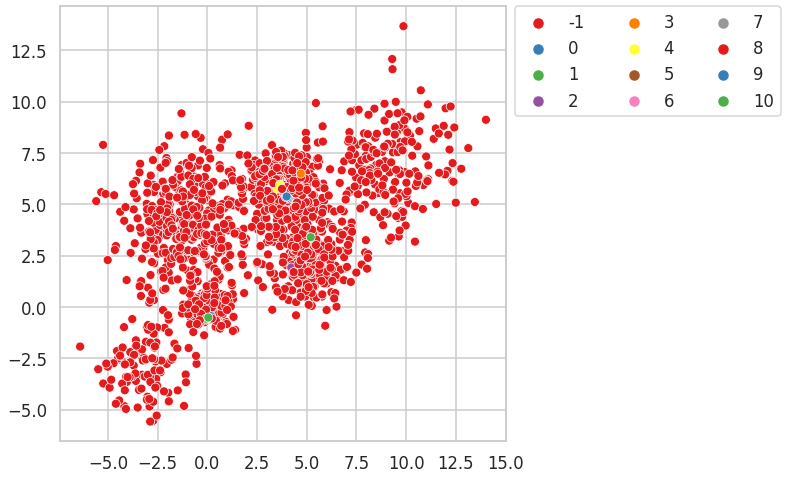

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.10 produces 5 clusters with silhouette score : -0.50
The Noise percentage is : 0.9827586206896551
-1    98.275862
 1     0.482759
 0     0.413793
 2     0.413793
 3     0.413793
dtype: float64


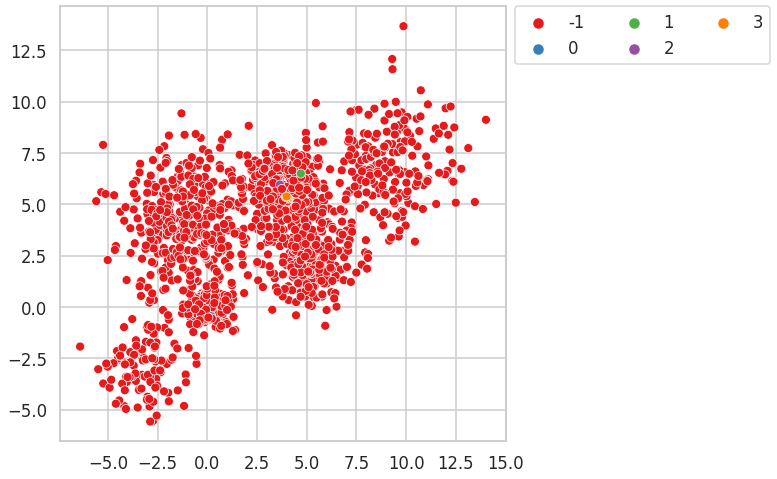

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.20 produces 39 clusters with silhouette score : -0.40
The Noise percentage is : 0.6317241379310344
-1     63.172414
 15    10.55

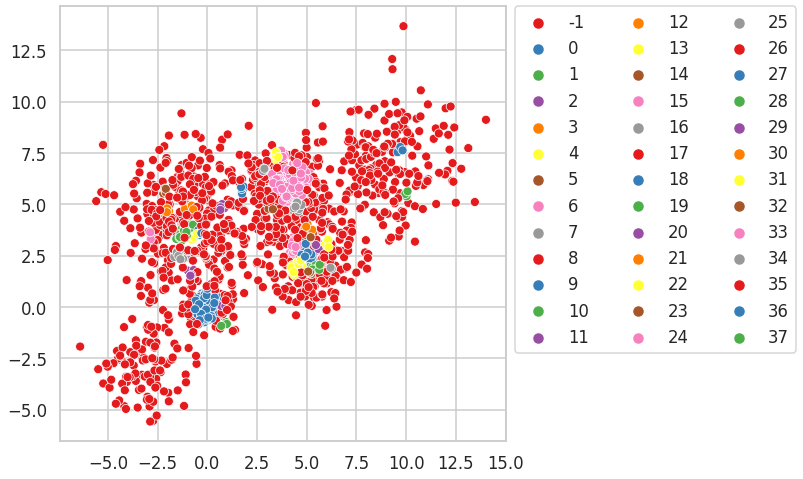

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.20 produces 23 clusters with silhouette score : -0.42
The Noise percentage is : 0.7262068965517241
-1     72.620690
 11     9.862069
 0      3.724138
 1      2.206897
 3      1.103448
dtype: float64
20    0.482759
10    0.413793
2     0.344828
18    0.344828
12    0.275862
dtype: float64


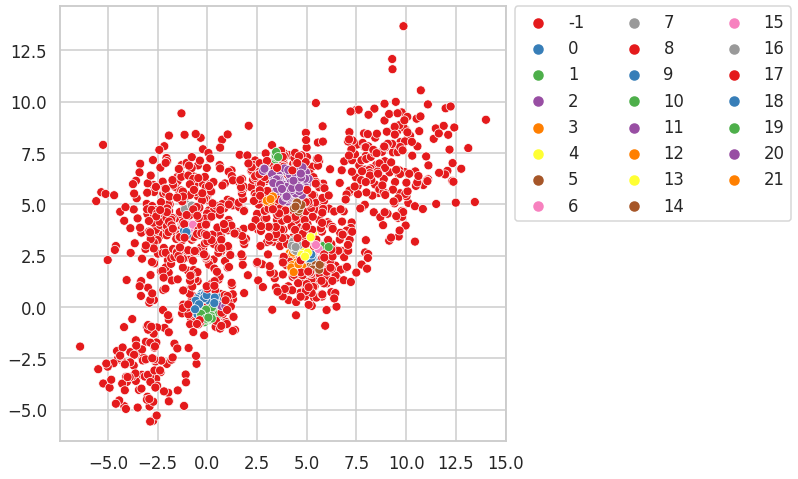

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.20 produces 17 clusters with silhouette score : -0.49
The Noise percentage is : 0.7937931034482759
-1     79.379310
 5      7.310345
 0      3.379310
 1      1.724138
 11     1.379310
dtype: float64
9     0.482759
6     0.482759
3     0.482759
15    0.482759
12    0.344828
dtype: float64


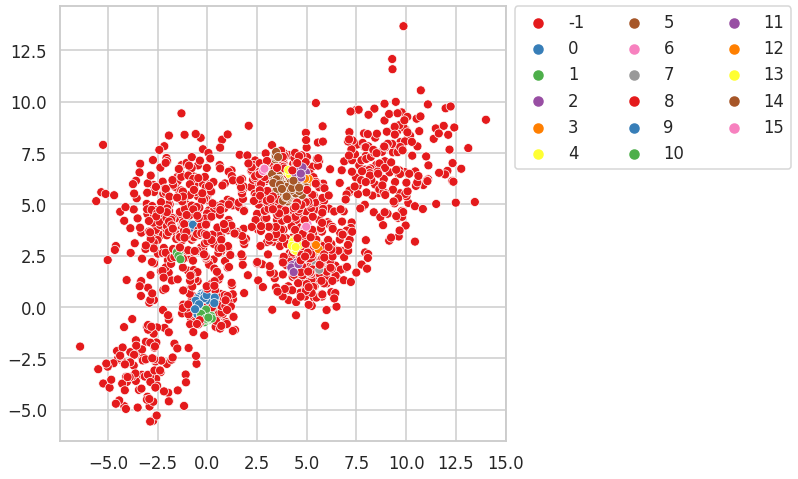

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.20 produces 13 clusters with silhouette score : -0.45
The Noise percentage is : 0.8489655172413794
-1    84.896552
 6     3.931034
 8     2.344828
 2     1.586207
 1     1.379310
dtype: float64
7     0.827586
11    0.620690
4     0.551724
10    0.482759
3     0.413793
dtype: float64


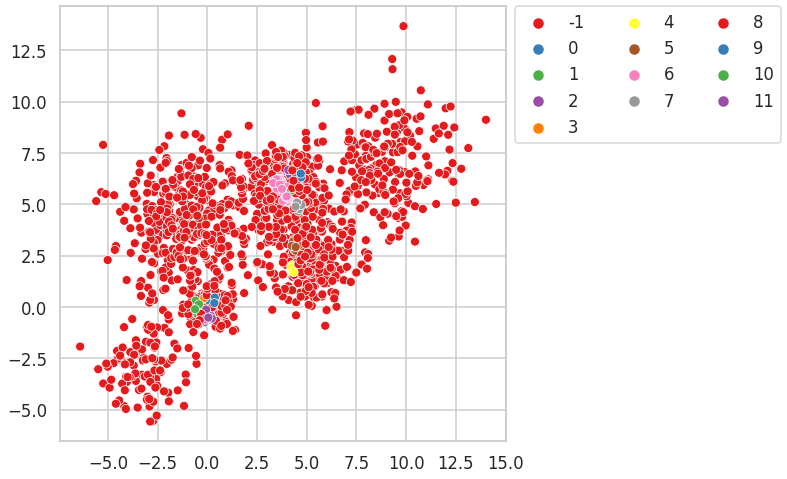

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.20 produces 10 clusters with silhouette score : -0.45
The Noise percentage is : 0.8737931034482759
-1    87.379310
 8     3.724138
 6     2.206897
 1     1.448276
 7     1.172414
 2     1.103448
 0     0.965517
 4     0.827586
 5     0.758621
 3     0.413793
dtype: float64


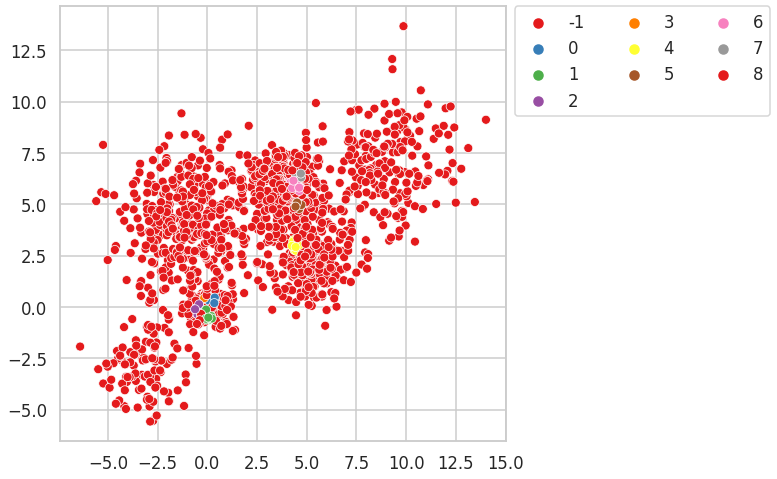

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.20 produces 8 clusters with silhouette score : -0.43
The Noise percentage is : 0.9041379310344828
-1    90.413793
 4     2.137931
 2     1.931034
 5     1.517241
 0     1.310345
 3     1.172414
 1     0.758621
 6     0.758621
dtype: float64


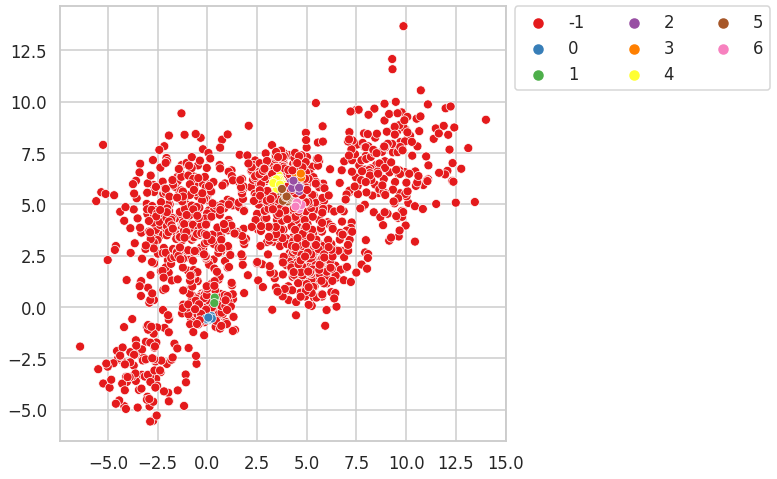

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.30 produces 38 clusters with silhouette score : -0.14
The Noise percentage is : 0.3317241379310345
-1     33.172414
 5     19.655172
 4     12.620690
 2      9.448276
 10     4.344828
dtype: float64
6     0.344828
36    0.344828
27    0.275862
22    0.206897
28    0.206897
dtype: float64


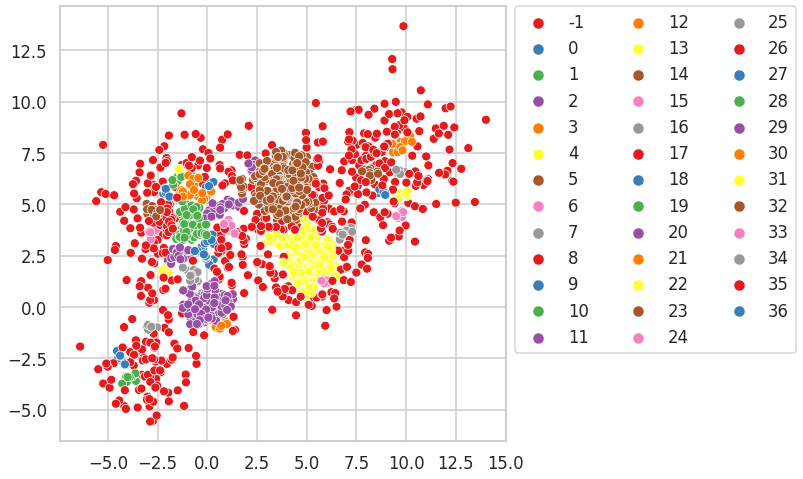

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.30 produces 27 clusters with silhouette score : -0.20
The Noise percentage is : 0.4317241379310345
-1    43.172414
 3    18.068966
 1    11.034483
 0     9.034483
 7     4.344828
dtype: float64
16    0.413793
17    0.413793
21    0.413793
18    0.275862
20    0.275862
dtype: float64


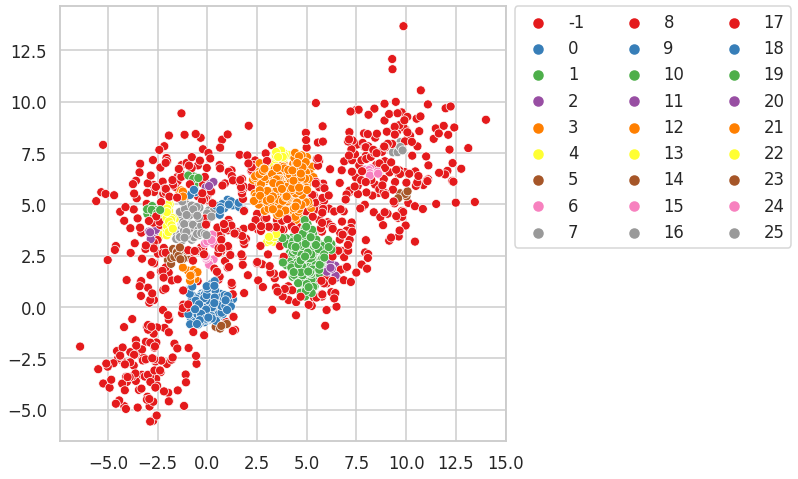

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.30 produces 21 clusters with silhouette score : -0.29
The Noise percentage is : 0.5103448275862069
-1    51.034483
 5    16.827586
 1     9.241379
 0     8.689655
 8     4.068966
dtype: float64
14    0.482759
18    0.482759
19    0.482759
15    0.413793
2     0.275862
dtype: float64


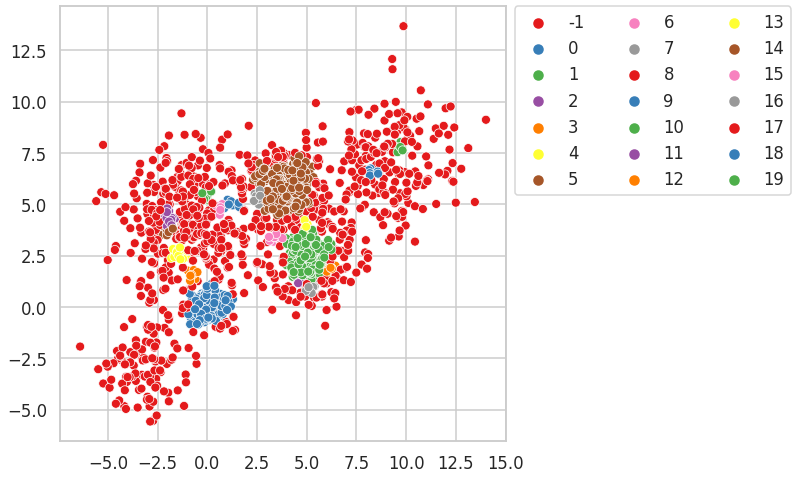

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.30 produces 15 clusters with silhouette score : -0.27
The Noise percentage is : 0.5696551724137932
-1    56.965517
 4    15.655172
 1     9.103448
 0     8.344828
 6     1.793103
dtype: float64
8     0.689655
3     0.551724
9     0.551724
10    0.551724
13    0.551724
dtype: float64


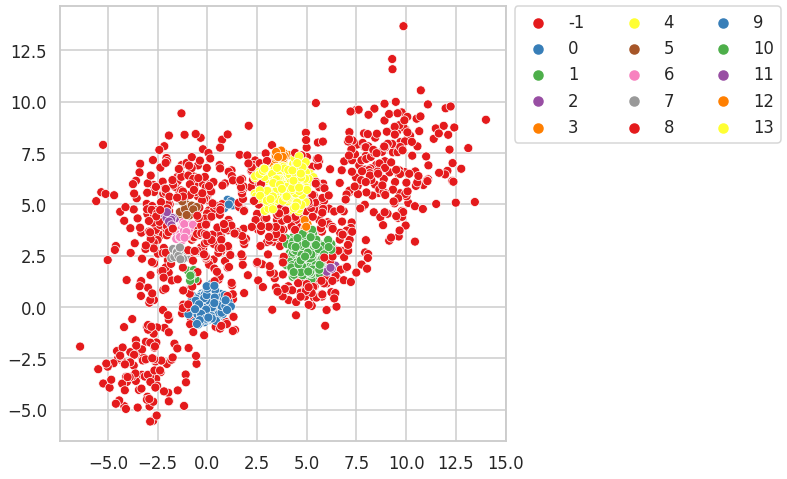

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.30 produces 15 clusters with silhouette score : -0.32
The Noise percentage is : 0.603448275862069
-1    60.344828
 6    13.241379
 0     7.724138
 3     7.034483
 2     1.724138
dtype: float64
12    0.896552
11    0.689655
4     0.620690
5     0.551724
1     0.413793
dtype: float64


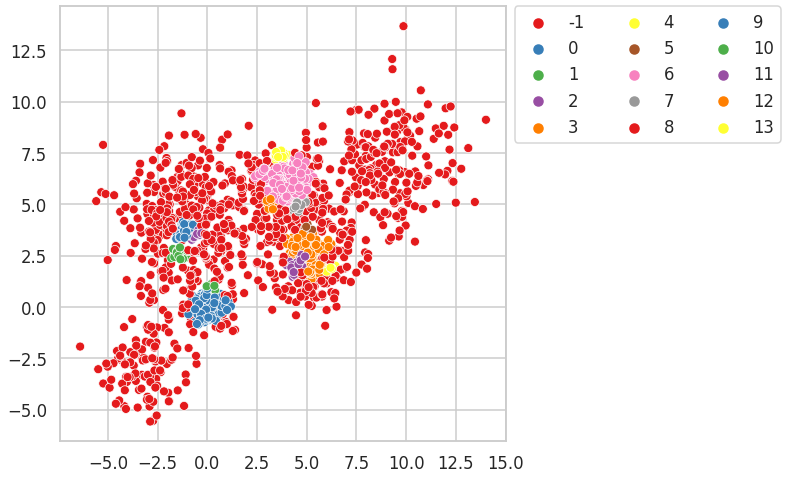

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.30 produces 12 clusters with silhouette score : -0.31
The Noise percentage is : 0.6489655172413793
-1    64.896552
 3    12.965517
 0     7.448276
 1     6.896552
 2     1.586207
dtype: float64
5     1.034483
9     0.827586
10    0.758621
8     0.689655
7     0.413793
dtype: float64


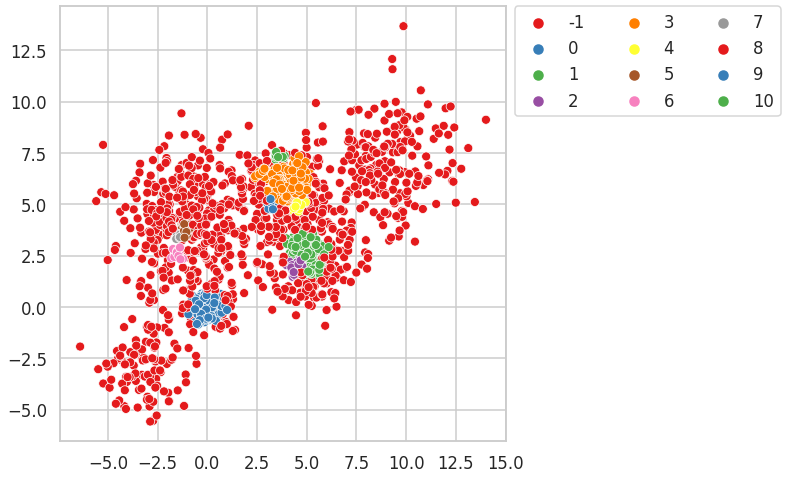

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.40 produces 24 clusters with silhouette score : -0.04
The Noise percentage is : 0.19448275862068964
 8     38.758621
-1     19.448276
 12    18.413793
 7     11.034483
 14     1.655172
dtype: float64
11    0.344828
5     0.344828
4     0.344828
3     0.344828
22    0.344828
dtype: float64


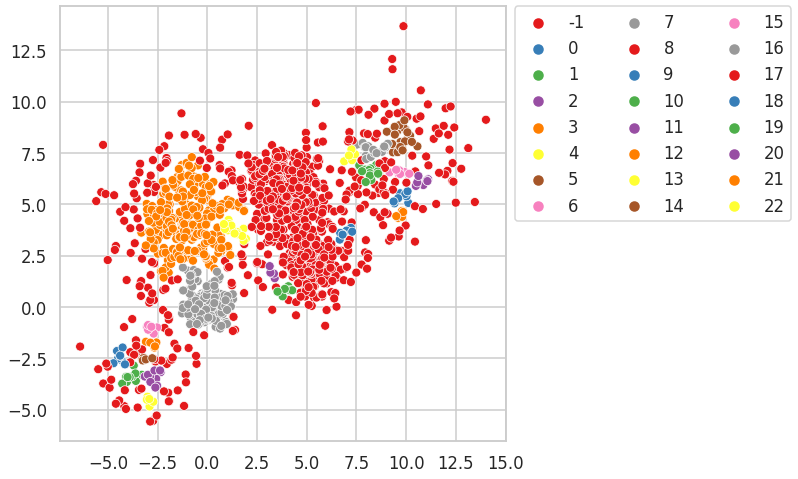

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.40 produces 20 clusters with silhouette score : -0.15
The Noise percentage is : 0.24344827586206896
 4     36.689655
-1     24.344828
 8     18.275862
 3     10.965517
 12     1.034483
dtype: float64
0     0.413793
6     0.413793
11    0.413793
5     0.413793
7     0.275862
dtype: float64


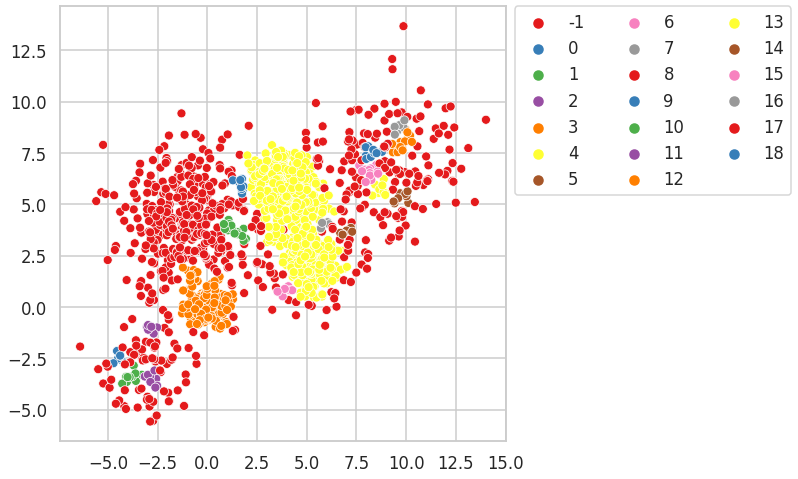

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.40 produces 14 clusters with silhouette score : -0.08
The Noise percentage is : 0.2986206896551724
 3    36.000000
-1    29.862069
 4    17.034483
 2    10.896552
 8     0.965517
dtype: float64
9     0.551724
0     0.482759
1     0.482759
11    0.482759
7     0.275862
dtype: float64


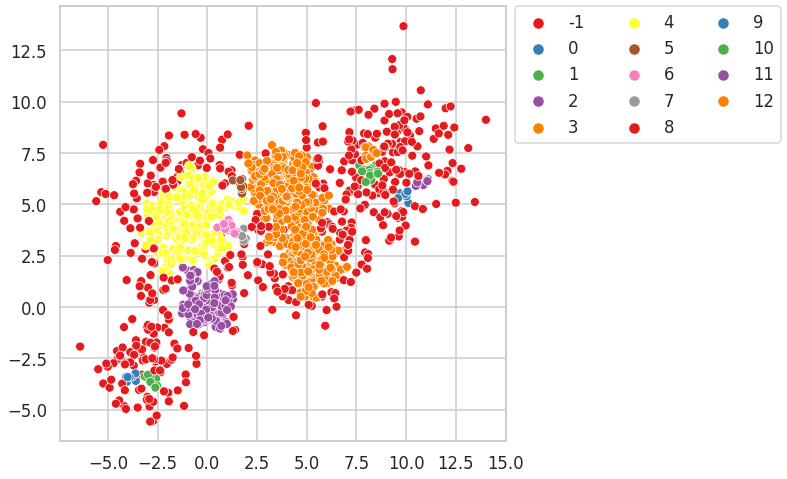

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.40 produces 11 clusters with silhouette score : -0.15
The Noise percentage is : 0.3544827586206897
-1    35.448276
 1    35.448276
 2    12.620690
 0    10.827586
 3     1.724138
dtype: float64
4    0.758621
8    0.758621
6    0.551724
7    0.551724
5    0.344828
dtype: float64


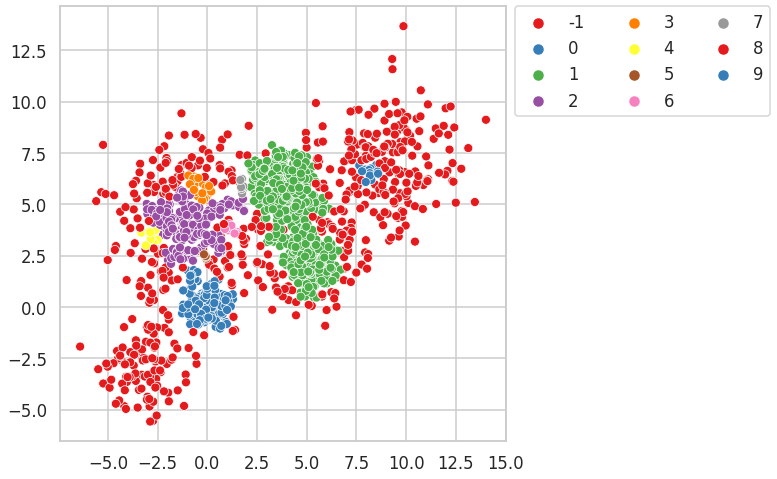

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.40 produces 14 clusters with silhouette score : -0.09
The Noise percentage is : 0.39241379310344826
-1    39.241379
 2    20.758621
 1    14.000000
 0    10.413793
 4     8.000000
dtype: float64
11    0.689655
12    0.620690
10    0.551724
3     0.482759
9     0.344828
dtype: float64


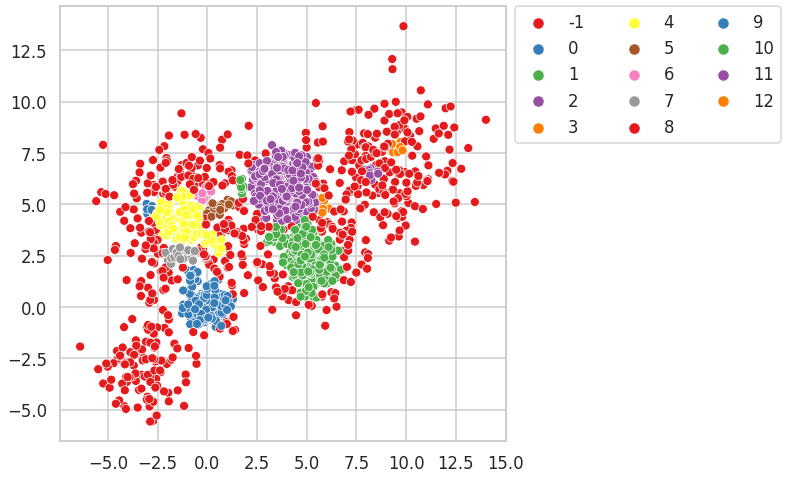

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.40 produces 9 clusters with silhouette score : -0.09
The Noise percentage is : 0.4613793103448276
-1    46.137931
 2    20.482759
 1    13.310345
 0     9.310345
 4     6.620690
 6     1.862069
 5     0.965517
 7     0.689655
 3     0.620690
dtype: float64


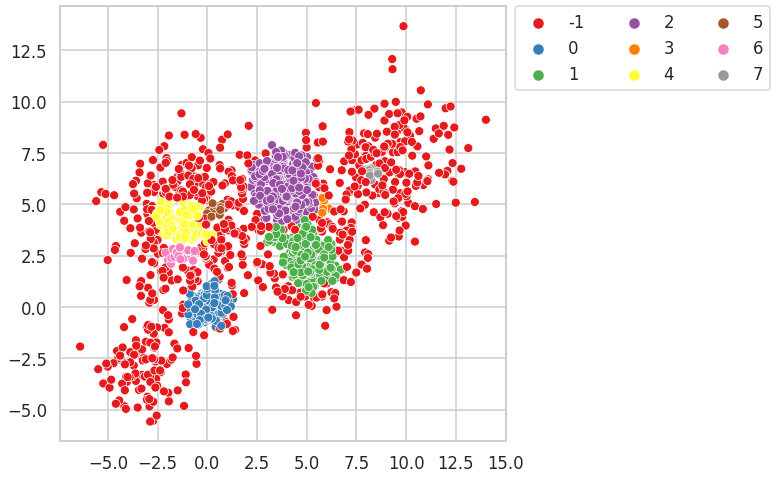

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.50 produces 11 clusters with silhouette score : -0.07
The Noise percentage is : 0.1103448275862069
 4    73.586207
-1    11.034483
 6     8.620690
 0     3.655172
 2     0.758621
dtype: float64
7    0.482759
1    0.344828
8    0.344828
3    0.275862
9    0.275862
dtype: float64


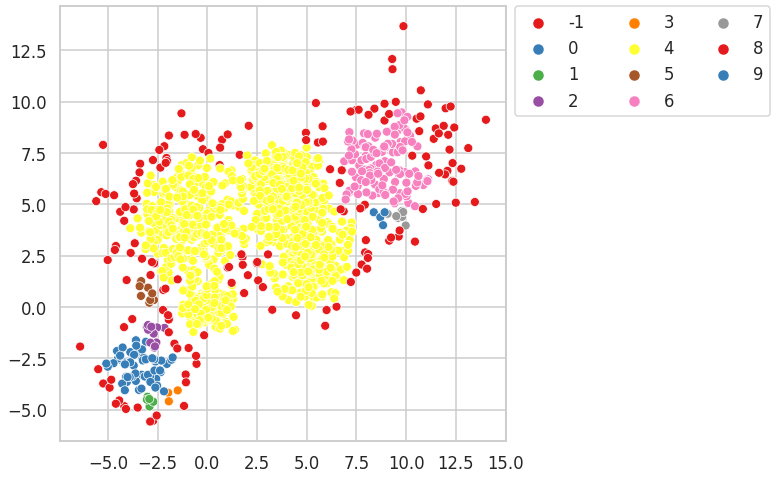

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.50 produces 8 clusters with silhouette score : -0.17
The Noise percentage is : 0.13655172413793104
 3    72.482759
-1    13.655172
 5     8.482759
 0     3.448276
 2     0.758621
 6     0.482759
 1     0.344828
 4     0.344828
dtype: float64


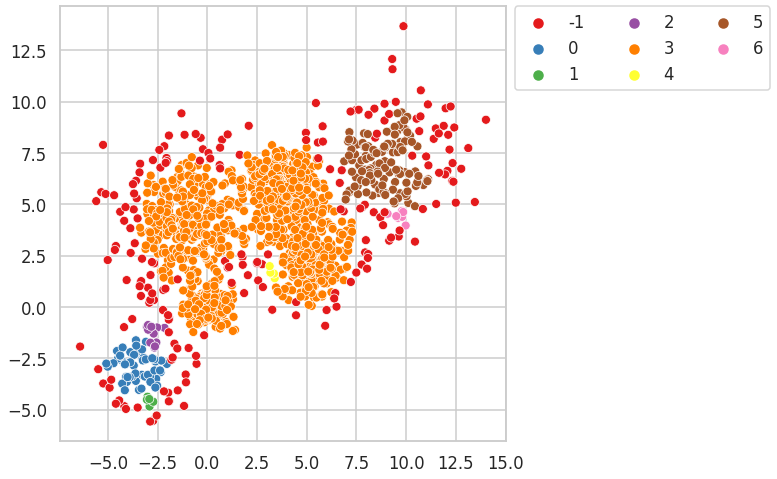

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.50 produces 11 clusters with silhouette score : -0.04
The Noise percentage is : 0.15655172413793103
 3    60.413793
-1    15.655172
 2    11.517241
 5     5.724138
 0     3.379310
dtype: float64
1    0.482759
4    0.413793
7    0.413793
8    0.413793
9    0.137931
dtype: float64


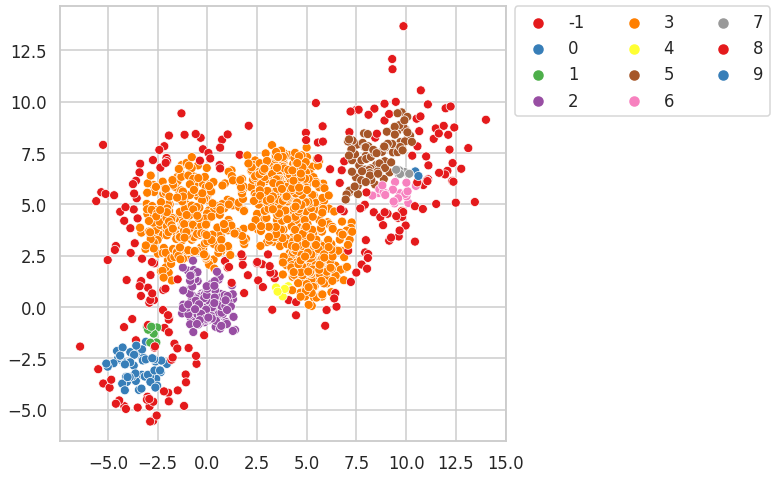

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.50 produces 14 clusters with silhouette score : 0.08
The Noise percentage is : 0.19793103448275862
 6    39.310345
 5    20.068966
-1    19.793103
 4    11.448276
 9     2.827586
dtype: float64
2     0.620690
7     0.620690
3     0.551724
10    0.482759
12    0.344828
dtype: float64


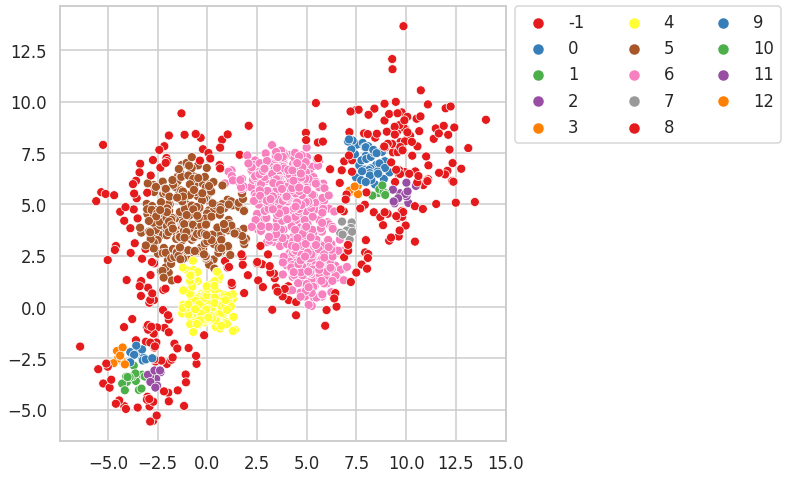

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.50 produces 13 clusters with silhouette score : 0.06
The Noise percentage is : 0.24068965517241378
 4    38.551724
-1    24.068966
 6    18.482759
 3    11.448276
 9     1.448276
dtype: float64
0     0.620690
2     0.620690
5     0.620690
11    0.620690
10    0.482759
dtype: float64


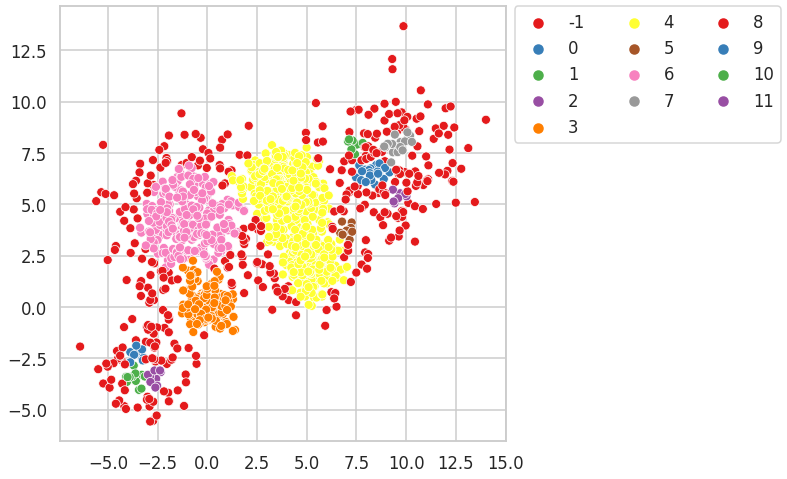

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.50 produces 7 clusters with silhouette score : 0.14
The Noise percentage is : 0.2944827586206897
 1    38.206897
-1    29.448276
 2    17.862069
 0    11.310345
 4     1.310345
 3     1.172414
 5     0.689655
dtype: float64


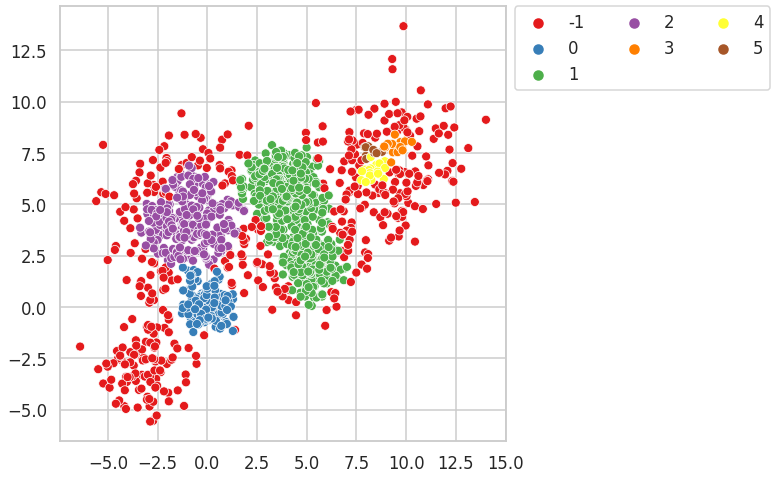

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.60 produces 9 clusters with silhouette score : -0.24
The Noise percentage is : 0.05724137931034483
 3    85.862069
 0     5.862069
-1     5.724138
 2     0.758621
 5     0.482759
 6     0.413793
 7     0.413793
 1     0.275862
 4     0.206897
dtype: float64


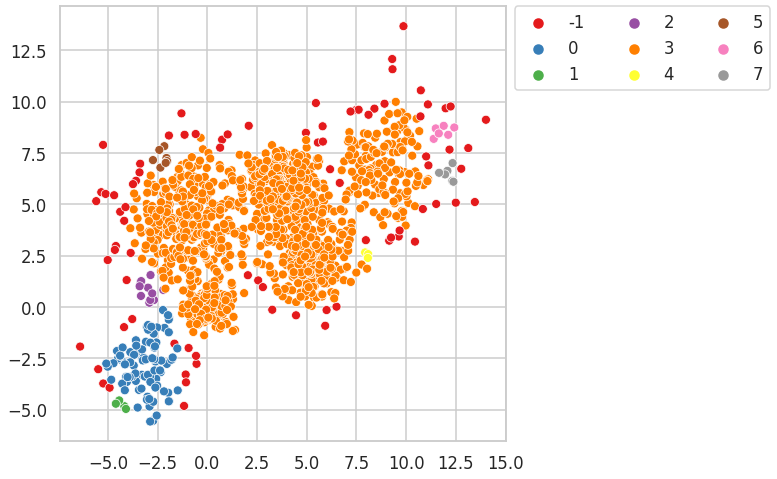

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.60 produces 5 clusters with silhouette score : 0.02
The Noise percentage is : 0.08827586206896551
 2    84.896552
-1     8.827586
 0     5.172414
 1     0.689655
 3     0.413793
dtype: float64


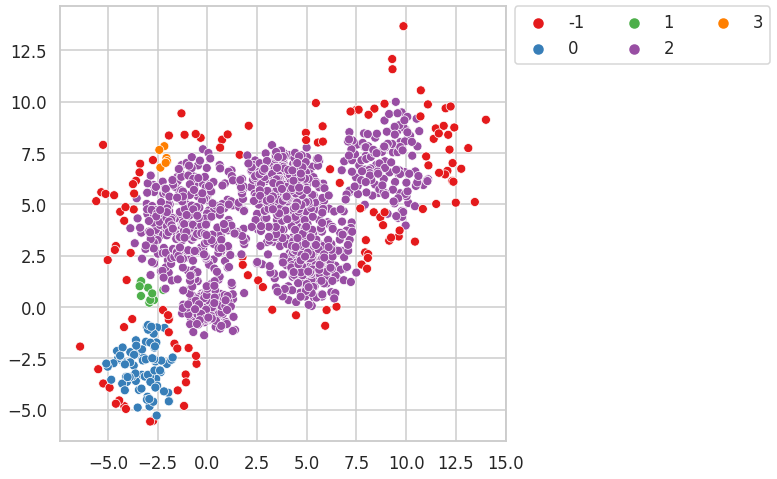

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.60 produces 6 clusters with silhouette score : 0.06
The Noise percentage is : 0.10275862068965518
 2    74.827586
-1    10.275862
 4     9.586207
 0     4.413793
 1     0.482759
 3     0.413793
dtype: float64


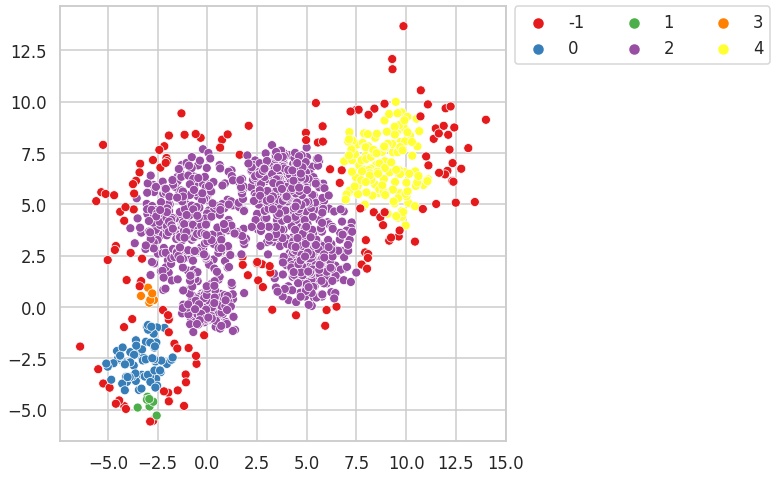

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.60 produces 5 clusters with silhouette score : 0.16
The Noise percentage is : 0.1193103448275862
 2    74.620690
-1    11.931034
 3     8.827586
 0     4.275862
 1     0.344828
dtype: float64


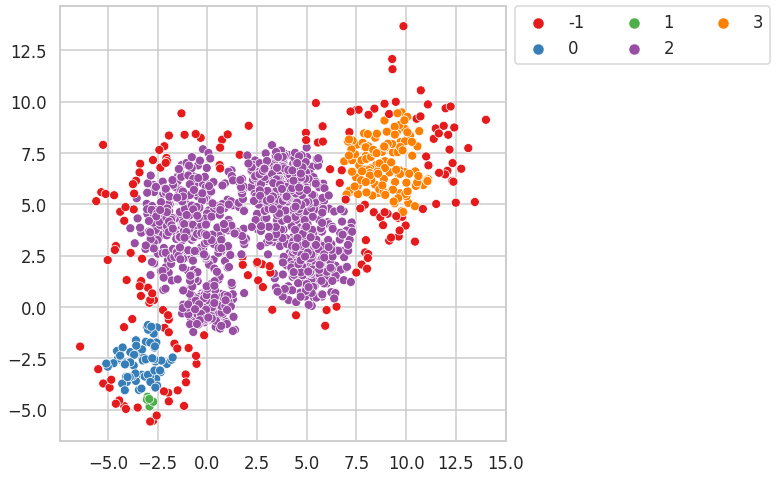

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.60 produces 4 clusters with silhouette score : 0.17
The Noise percentage is : 0.13655172413793104
 1    73.724138
-1    13.655172
 2     8.482759
 0     4.137931
dtype: float64


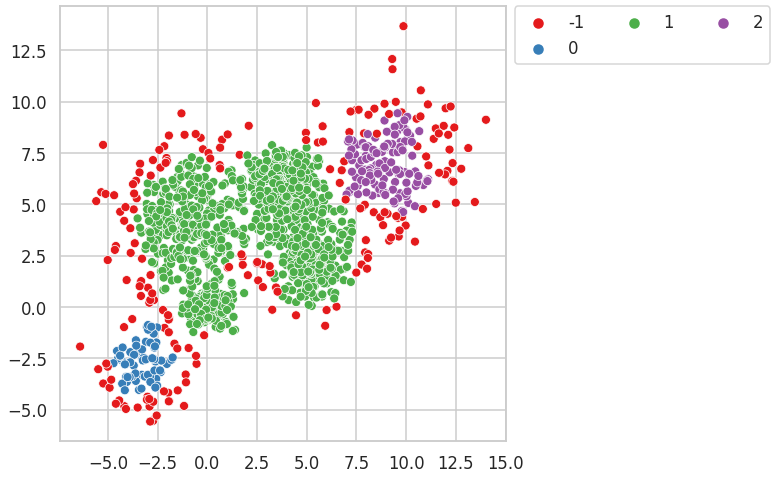

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.60 produces 6 clusters with silhouette score : 0.13
The Noise percentage is : 0.15379310344827588
 3    72.758621
-1    15.379310
 4     8.137931
 0     2.620690
 1     0.551724
 2     0.551724
dtype: float64


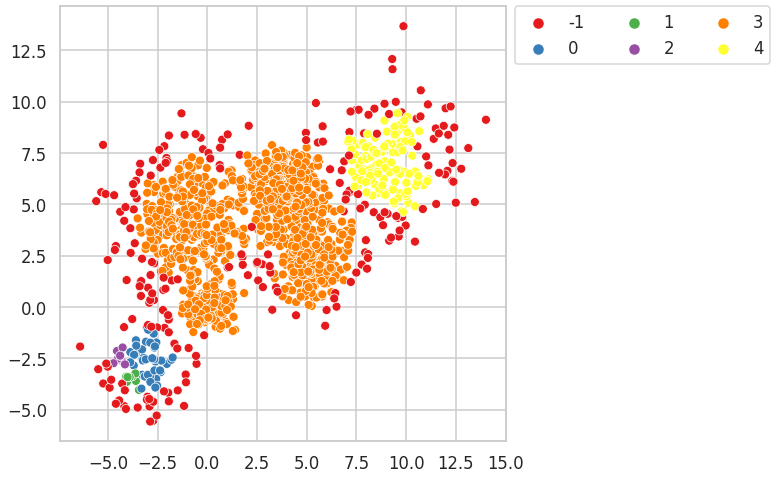

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.23
The Noise percentage is : 0.03310344827586207
 0    96.275862
-1     3.310345
 1     0.413793
dtype: float64


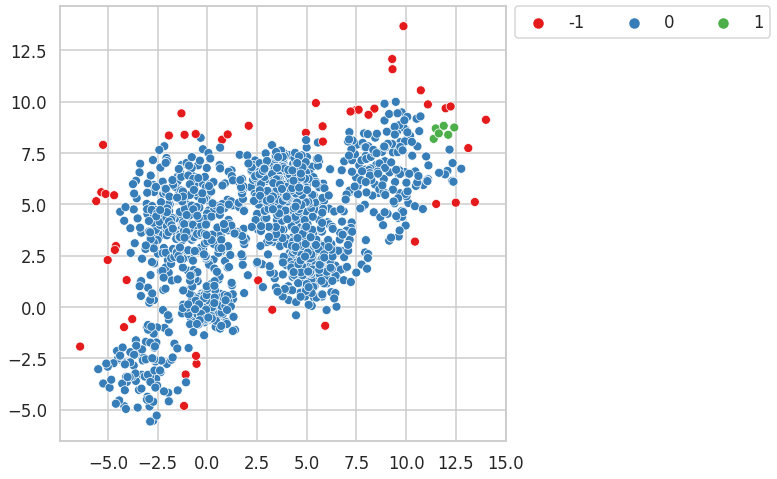

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.24
The Noise percentage is : 0.04482758620689655
 0    95.172414
-1     4.482759
 1     0.344828
dtype: float64


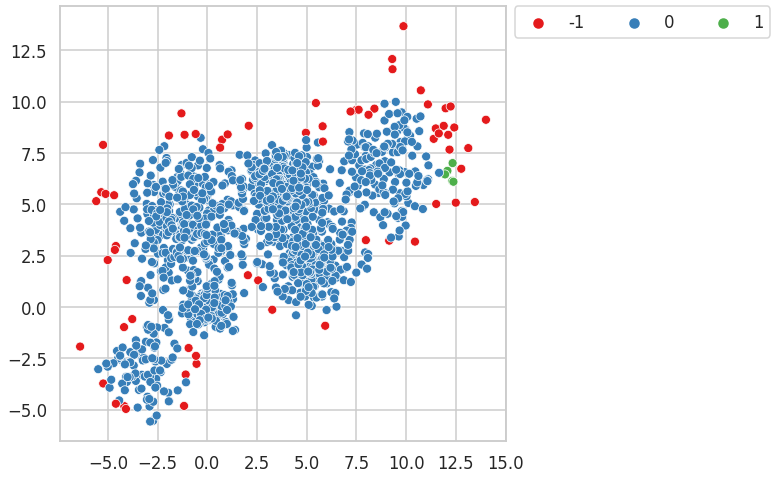

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.70 produces 4 clusters with silhouette score : 0.24
The Noise percentage is : 0.06
 1    77.655172
 2    10.620690
-1     6.000000
 0     5.724138
dtype: float64


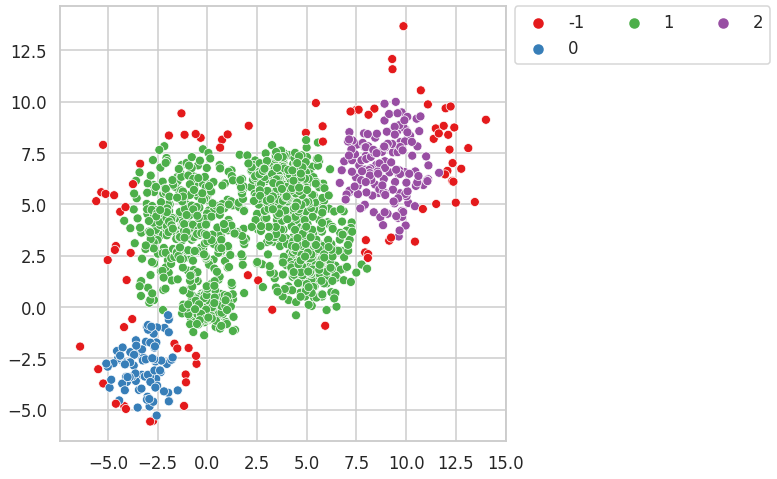

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.70 produces 4 clusters with silhouette score : 0.23
The Noise percentage is : 0.07172413793103448
 1    77.034483
 2    10.344828
-1     7.172414
 0     5.448276
dtype: float64


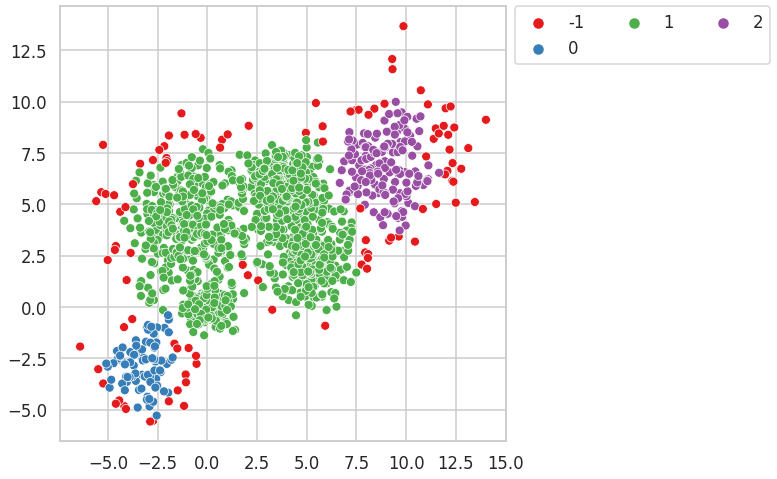

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.70 produces 4 clusters with silhouette score : 0.22
The Noise percentage is : 0.08413793103448276
 1    76.551724
 2    10.137931
-1     8.413793
 0     4.896552
dtype: float64


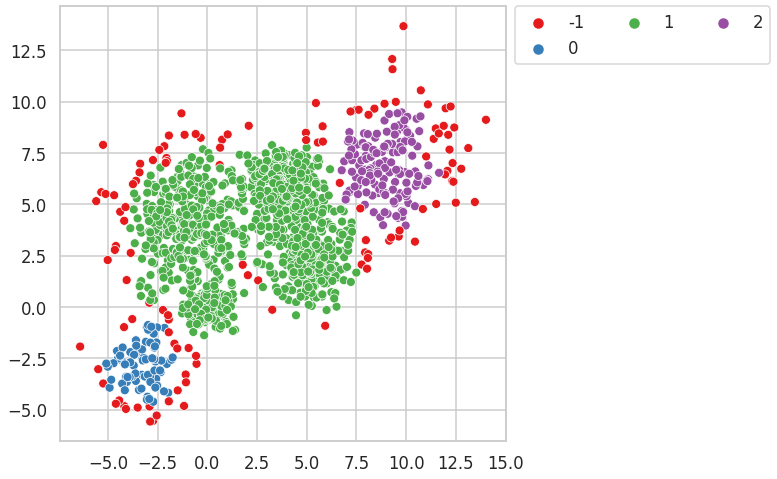

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.70 produces 4 clusters with silhouette score : 0.21
The Noise percentage is : 0.09724137931034482
 1    75.724138
-1     9.724138
 2     9.724138
 0     4.827586
dtype: float64


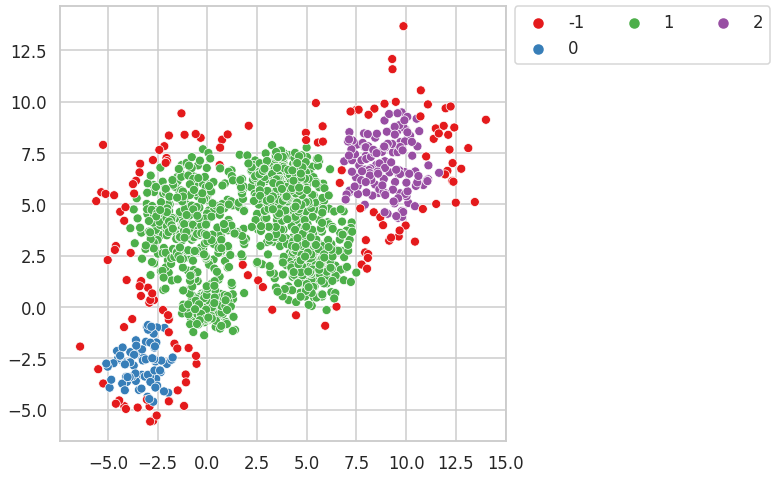

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.25
The Noise percentage is : 0.022758620689655173
 0    97.310345
-1     2.275862
 1     0.413793
dtype: float64


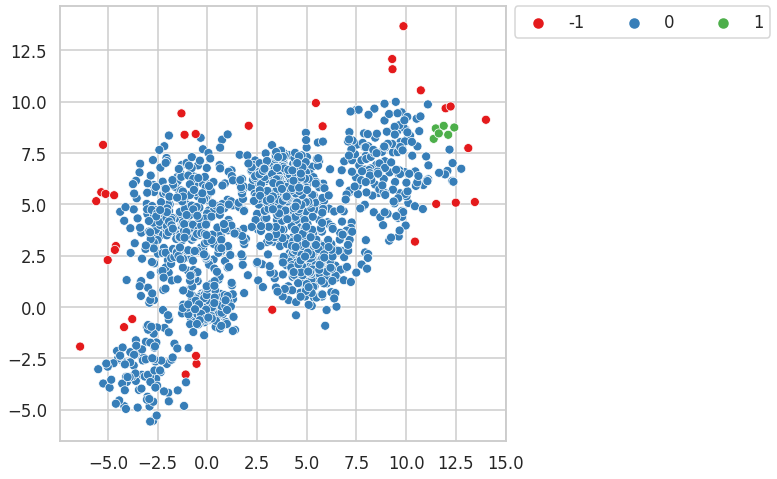

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.24
The Noise percentage is : 0.02689655172413793
 0    96.827586
-1     2.689655
 1     0.482759
dtype: float64


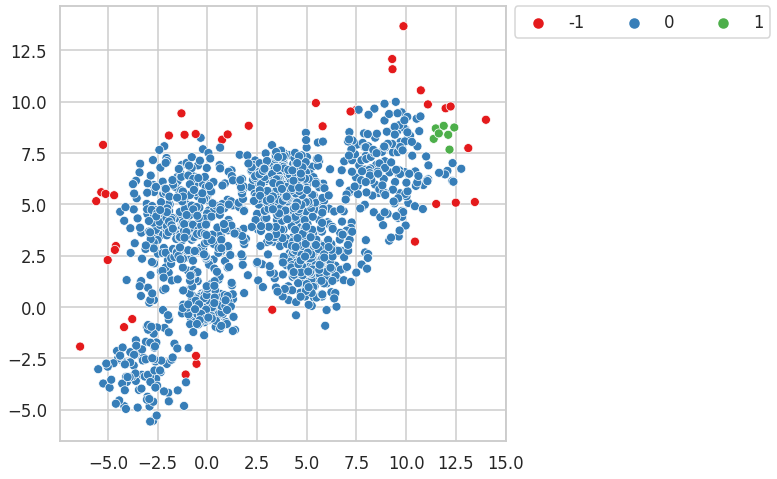

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.23
The Noise percentage is : 0.031724137931034485
 0    96.344828
-1     3.172414
 1     0.482759
dtype: float64


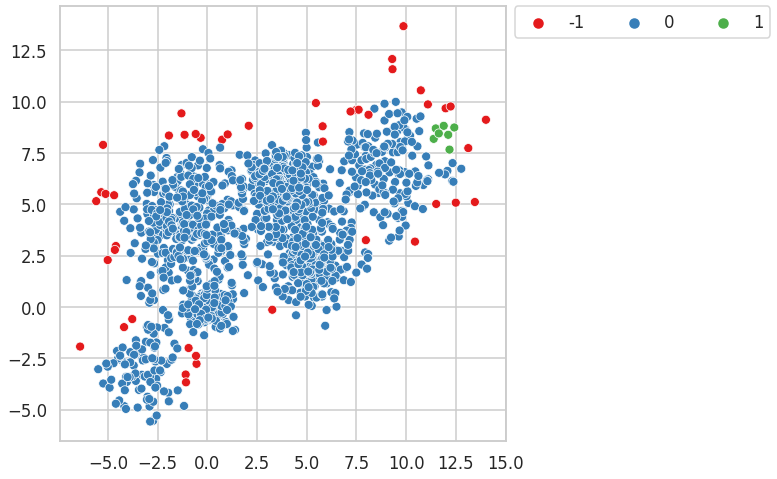

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.31
The Noise percentage is : 0.044137931034482755
 0    84.482759
 1    11.103448
-1     4.413793
dtype: float64


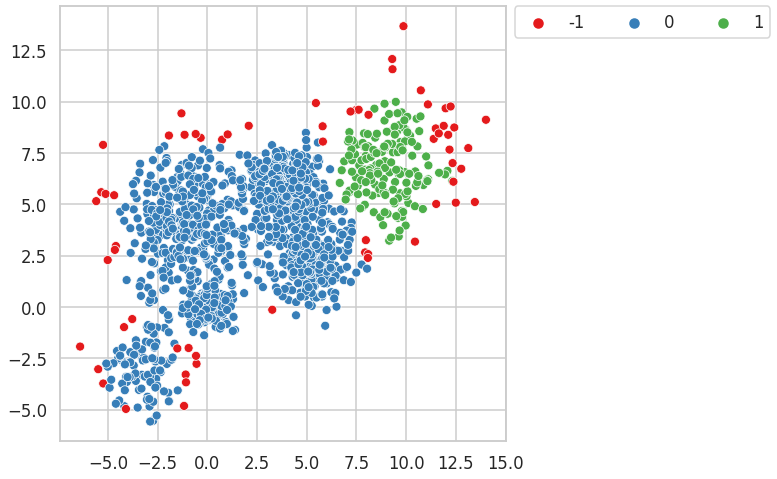

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.80 produces 4 clusters with silhouette score : 0.25
The Noise percentage is : 0.0503448275862069
 1    78.344828
 2    10.689655
 0     5.931034
-1     5.034483
dtype: float64


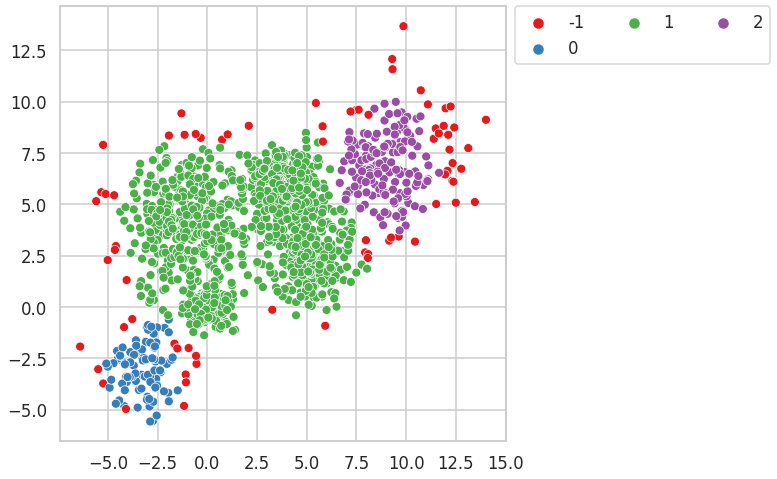

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.80 produces 4 clusters with silhouette score : 0.25
The Noise percentage is : 0.05517241379310345
 1    78.068966
 2    10.551724
 0     5.862069
-1     5.517241
dtype: float64


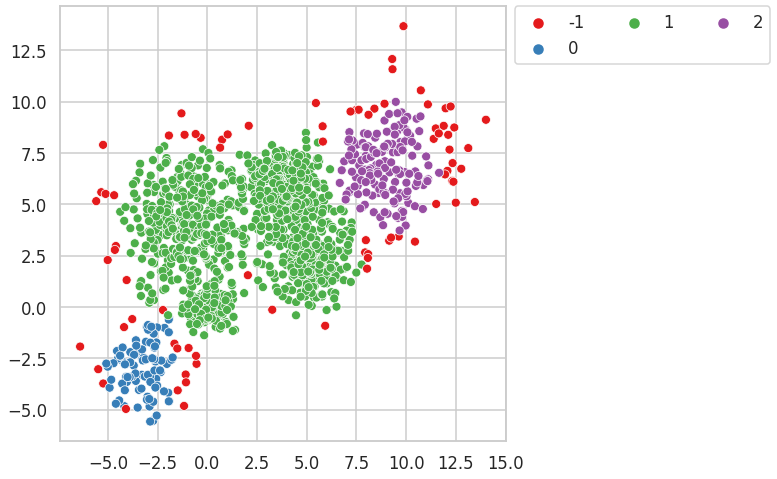

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.39
The Noise percentage is : 0.011724137931034483
 0    98.827586
-1     1.172414
dtype: float64


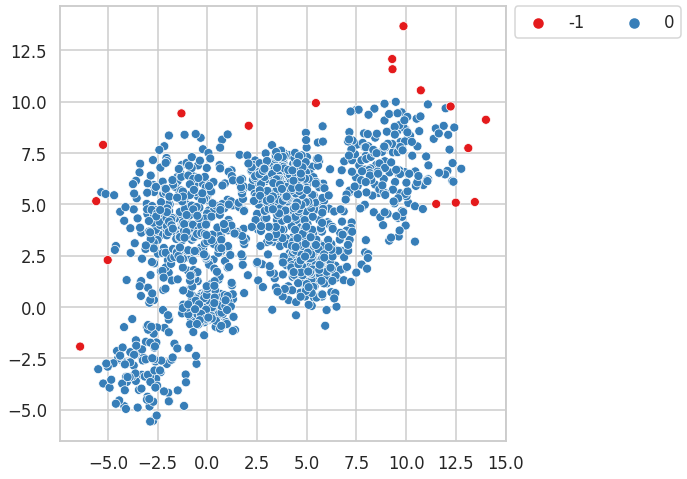

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.37
The Noise percentage is : 0.015172413793103448
 0    98.482759
-1     1.517241
dtype: float64


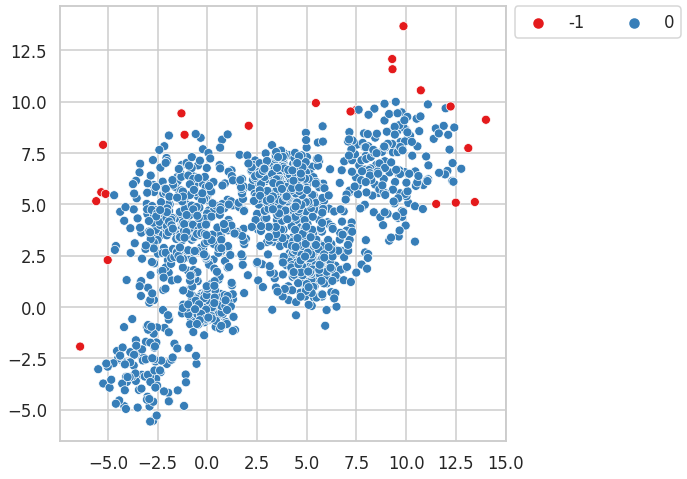

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.36
The Noise percentage is : 0.01793103448275862
 0    98.206897
-1     1.793103
dtype: float64


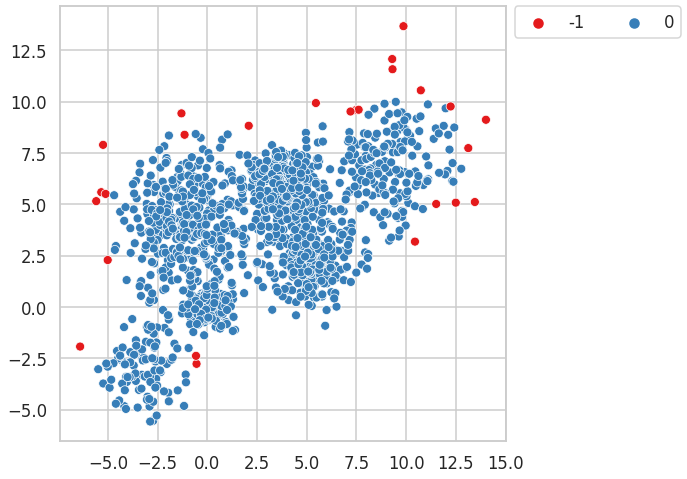

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.36
The Noise percentage is : 0.02482758620689655
 0    97.517241
-1     2.482759
dtype: float64


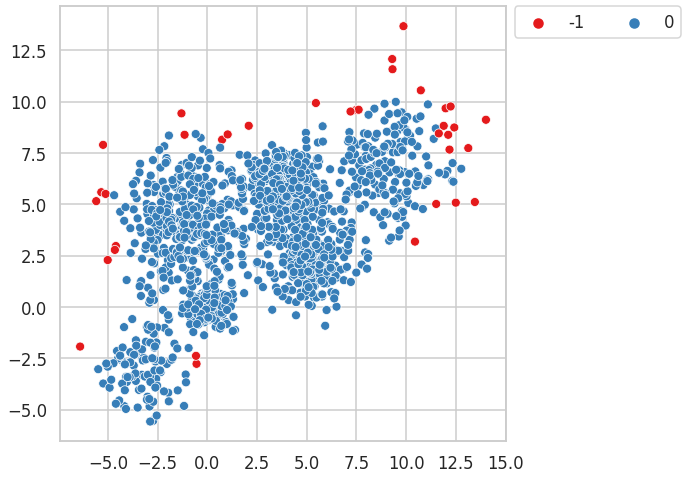

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.36
The Noise percentage is : 0.028965517241379312
 0    97.103448
-1     2.896552
dtype: float64


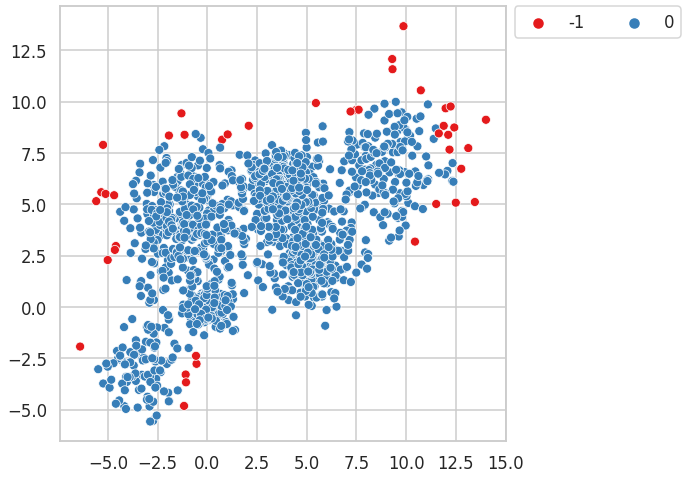

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.28
The Noise percentage is : 0.03379310344827586
 1    90.137931
 0     6.482759
-1     3.379310
dtype: float64


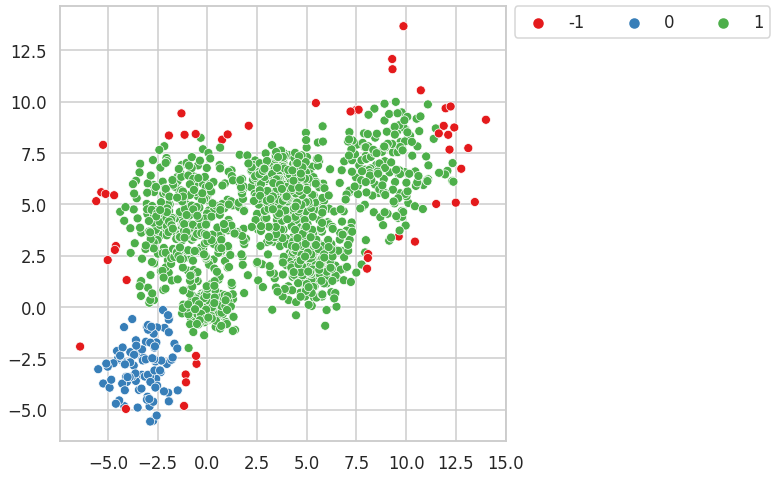

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.39
The Noise percentage is : 0.00896551724137931
 0    99.103448
-1     0.896552
dtype: float64


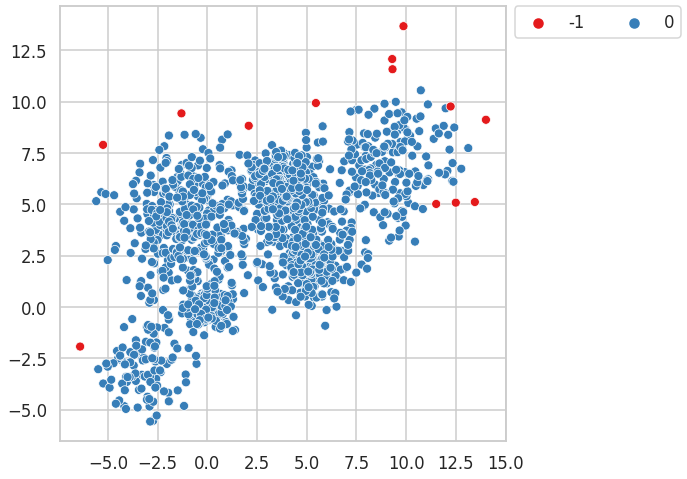

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.38
The Noise percentage is : 0.011034482758620689
 0    98.896552
-1     1.103448
dtype: float64


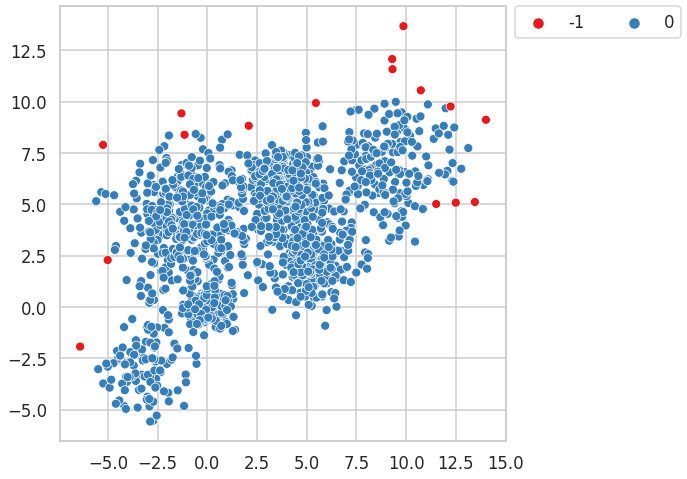

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.38
The Noise percentage is : 0.013793103448275862
 0    98.62069
-1     1.37931
dtype: float64


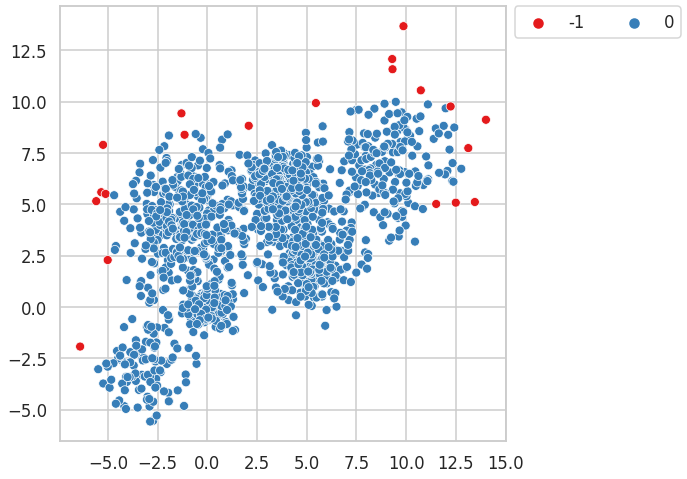

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.37
The Noise percentage is : 0.015862068965517243
 0    98.413793
-1     1.586207
dtype: float64


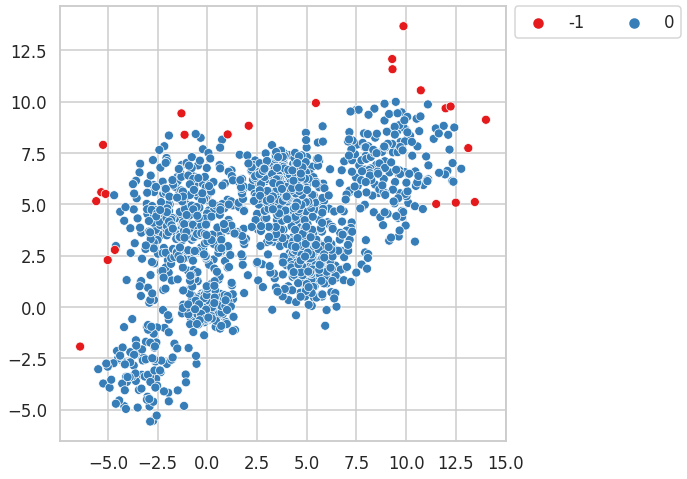

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.36
The Noise percentage is : 0.020689655172413793
 0    97.931034
-1     2.068966
dtype: float64


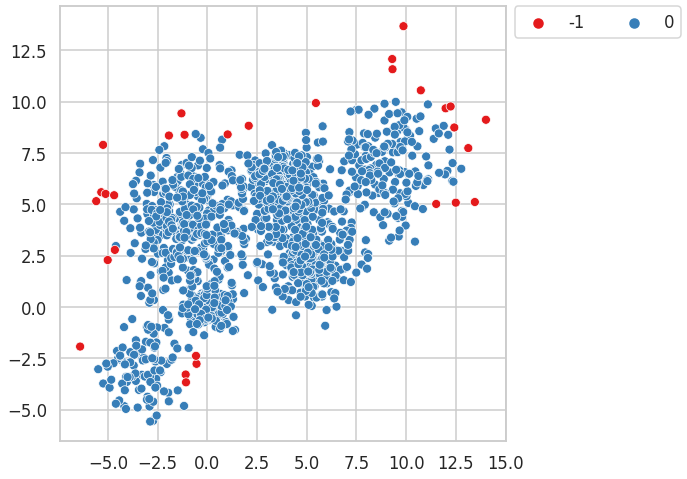

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.36
The Noise percentage is : 0.02482758620689655
 0    97.517241
-1     2.482759
dtype: float64


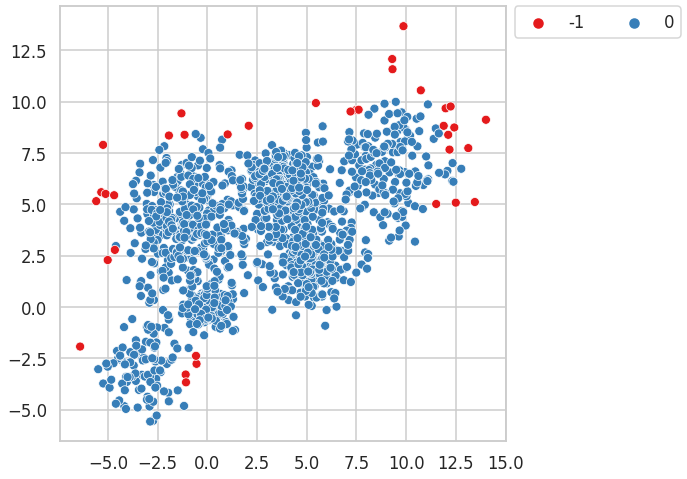

-----------------------------------------------------------------------------------------------------


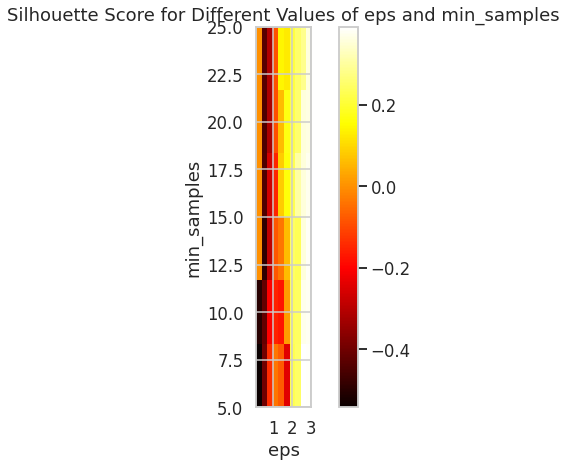


Best Silhouette Score: 0.39
Best Parameters: {'min_samples': 5, 'eps': 0.9, 'n_clusters': 2}


(0.3907788734374356, {'min_samples': 5, 'eps': 0.9, 'n_clusters': 2})

In [71]:
DBScan(Multi_blob_Data,min_eps = 0.1, max_eps = 1, min_samples = 5, max_samples = 10) 
# Minimum number of samples : 10.00, and epsilon: 0.80 produces 4 clusters with silhouette score : 0.25
# The Noise percentage is : 0.05517241379310345
#  1    78.068966
#  2    10.551724
#  0     5.862069
# -1     5.517241

# Minimum number of samples : 8.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.31
# The Noise percentage is : 0.044137931034482755
#  0    84.482759
#  1    11.103448
# -1     4.413793

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [72]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']



['setosa', 'versicolor', 'virginica']

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

Minimum number of samples : 5.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.10 produces only one cluster
---------------------

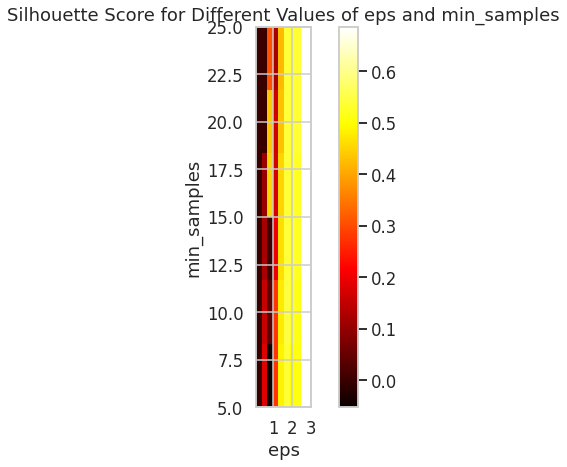


Best Silhouette Score: 0.69
Best Parameters: {'min_samples': 5, 'eps': 0.9, 'n_clusters': 2}


(0.6867350732769777, {'min_samples': 5, 'eps': 0.9, 'n_clusters': 2})

In [73]:
DBScan(iris_data.data,min_eps = 0.1, max_eps = 1, min_samples = 5, max_samples = 10) 
# Minimum number of samples : 5.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.69
# The Noise percentage is : 0
# 1    66.666667
# 0    33.333333

### Features relations

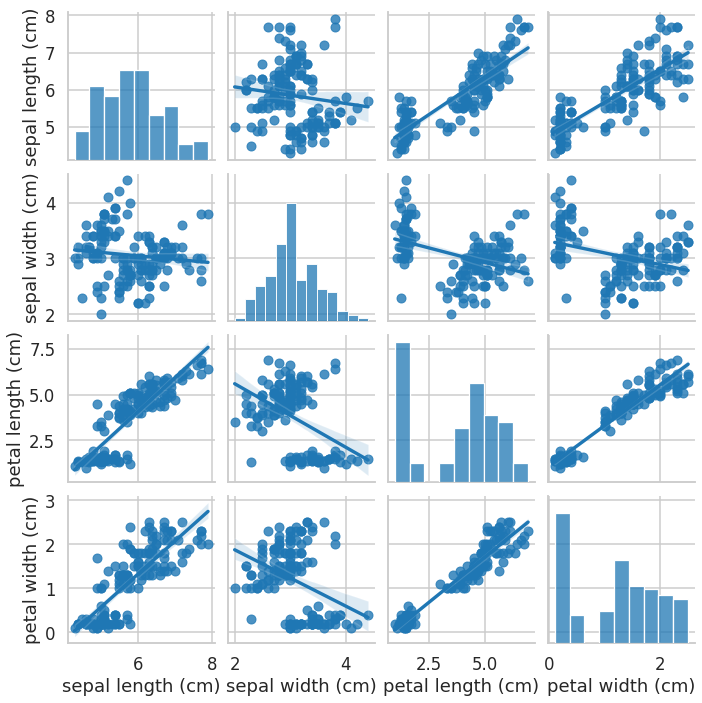

In [74]:
sns.pairplot(pd.DataFrame(iris_data.data,columns = iris_data.feature_names), kind="reg")
plt.show()

In [75]:
df = pd.DataFrame(iris_data.data,columns = iris_data.feature_names)
df.describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [76]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(iris_data.data)

Minimum number of samples : 5.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.10 produces only one cluster
---------------------

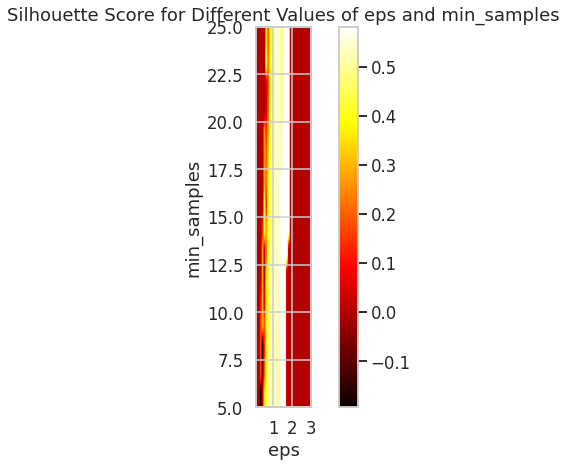


Best Silhouette Score: 0.58
Best Parameters: {'min_samples': 5, 'eps': 1.4, 'n_clusters': 2}


(0.5817500491982808, {'min_samples': 5, 'eps': 1.4, 'n_clusters': 2})

In [77]:
DBScan(scaled_data)
# Minimum number of samples : 25.00, and epsilon: 1.80 produces 2 clusters with silhouette score : 0.58
# The Noise percentage is : 0
# 1    66.666667
# 0    33.333333
# it changes because of the used method in calculating the distance 

In [78]:
pca = PCA(n_components=3)
# prepare transform on dataset
pca.fit(iris_data.data)
# apply transform to dataset
transformed = pca.transform(iris_data.data)
data_3d = pd.DataFrame(transformed,columns = ["1",'2',"3"])
fig = px.scatter_3d(data_3d, x='1', y='2', z='3',
              color='3')
fig.show()

Minimum number of samples : 5.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.10 produces only one cluster
---------------------

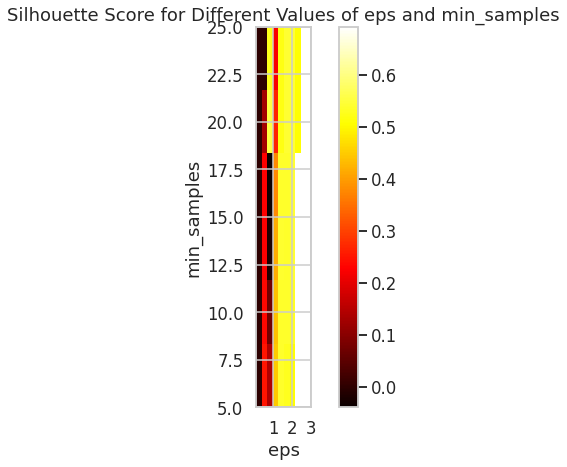


Best Silhouette Score: 0.69
Best Parameters: {'min_samples': 5, 'eps': 0.8, 'n_clusters': 2}


(0.692612946075623, {'min_samples': 5, 'eps': 0.8, 'n_clusters': 2})

In [79]:
DBScan(data_3d,min_eps = 0.1, max_eps = 1, min_samples = 5, max_samples = 10)
# Minimum number of samples : 5.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.69
# The Noise percentage is : 0
# 1    66.666667
# 0    33.333333

In [80]:
pca = PCA(n_components=2)
# prepare transform on dataset
pca.fit(iris_data.data)
# apply transform to dataset
transformed = pca.transform(iris_data.data)
data_2d = pd.DataFrame(transformed,columns = ["1",'2'])
df = px.data.iris()
fig = px.scatter(data_2d,x = "1",y = "2",
              color='2')
fig.show()

Minimum number of samples : 5.00, and epsilon: 0.10 produces 6 clusters with silhouette score : -0.39
The Noise percentage is : 0.78
-1    78.000000
 0     6.000000
 1     5.333333
 2     4.000000
 3     3.333333
 4     3.333333
dtype: float64


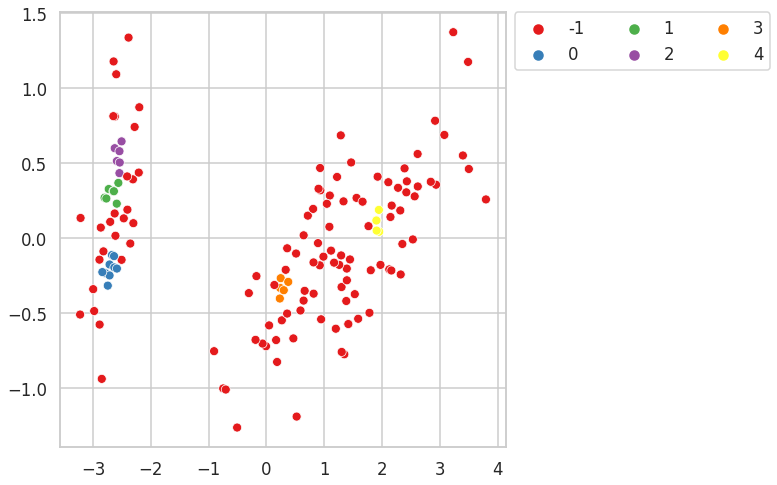

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.10 produces 3 clusters with silhouette score : 0.19
The Noise percentage is : 0.9
-1    90.000000
 1     5.333333
 0     4.666667
dtype: float64


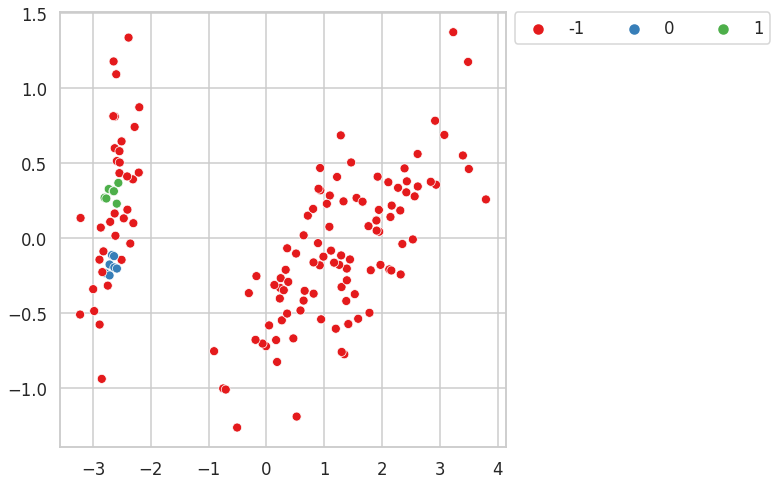

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.10 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.10 produces only one cluster
--------------------------------------------------------------------------------------------------

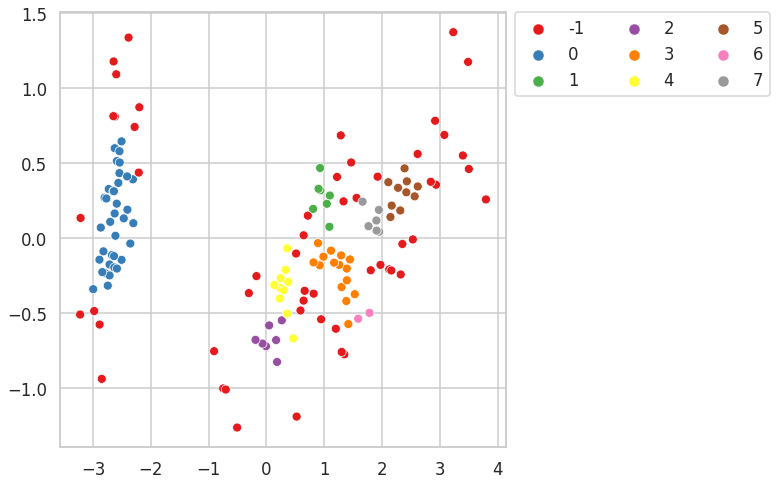

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.20 produces 7 clusters with silhouette score : 0.07
The Noise percentage is : 0.43333333333333335
-1    43.333333
 0    24.000000
 2    11.333333
 3     6.666667
 5     6.000000
 4     4.666667
 1     4.000000
dtype: float64


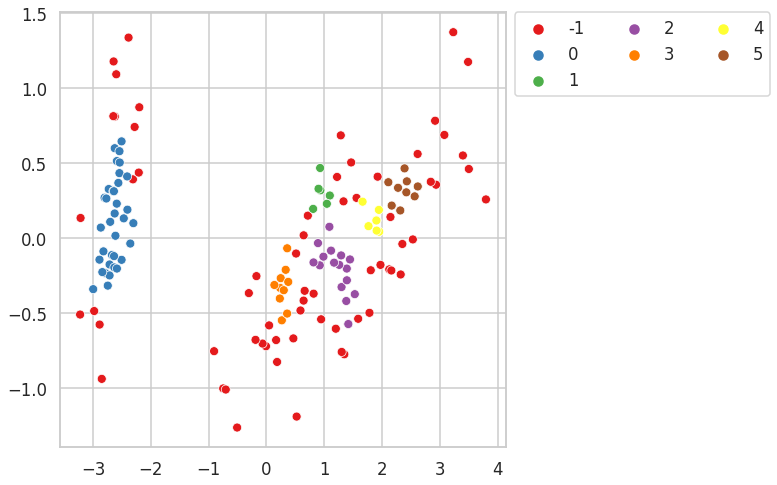

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.20 produces 5 clusters with silhouette score : -0.08
The Noise percentage is : 0.5933333333333334
-1    59.333333
 0    23.333333
 3     6.666667
 1     6.000000
 2     4.666667
dtype: float64


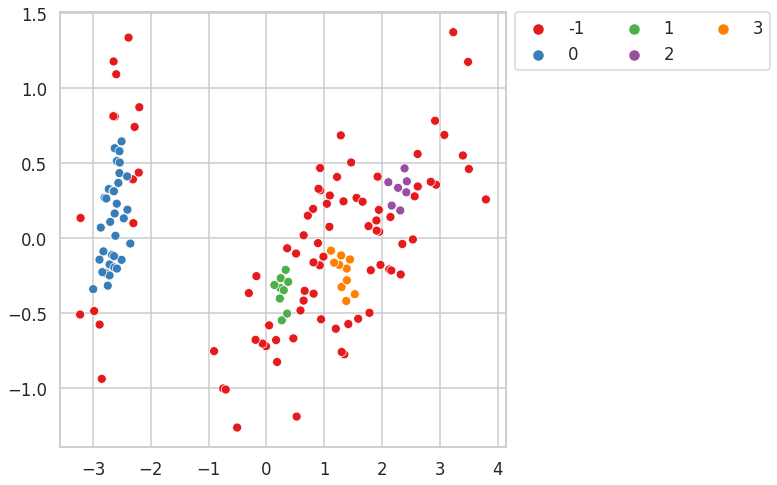

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.20 produces 5 clusters with silhouette score : -0.17
The Noise percentage is : 0.6466666666666666
-1    64.666667
 0    13.333333
 1     9.333333
 3     6.666667
 2     6.000000
dtype: float64


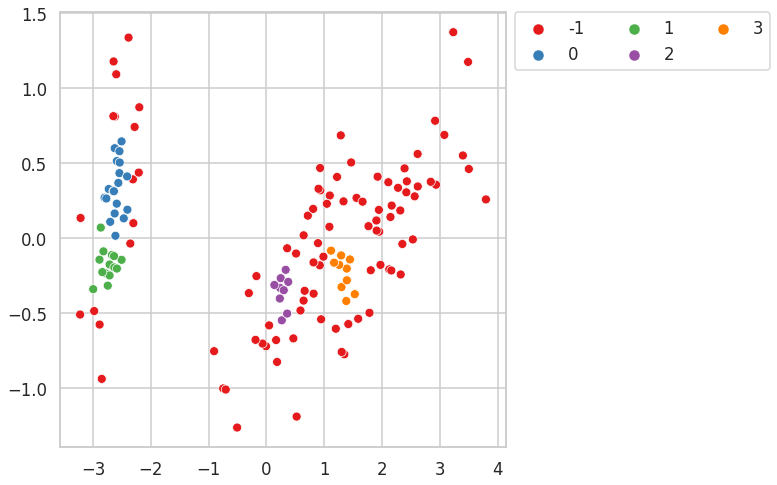

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.20 produces 3 clusters with silhouette score : 0.37
The Noise percentage is : 0.7866666666666666
-1    78.666667
 0    12.666667
 1     8.666667
dtype: float64


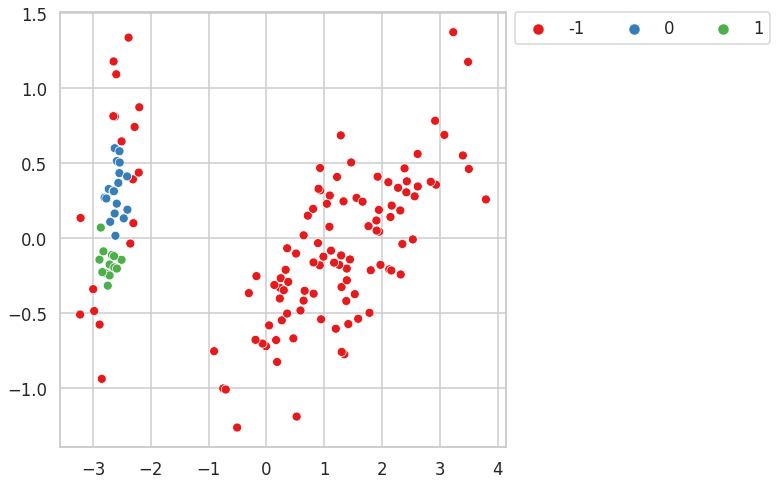

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.20 produces 3 clusters with silhouette score : 0.36
The Noise percentage is : 0.7933333333333333
-1    79.333333
 0    12.666667
 1     8.000000
dtype: float64


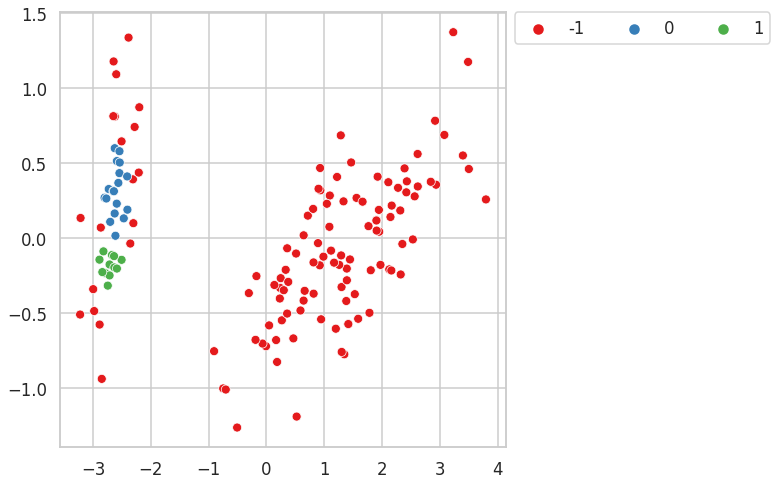

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.20 produces 3 clusters with silhouette score : 0.26
The Noise percentage is : 0.8533333333333334
-1    85.333333
 0     7.333333
 1     7.333333
dtype: float64


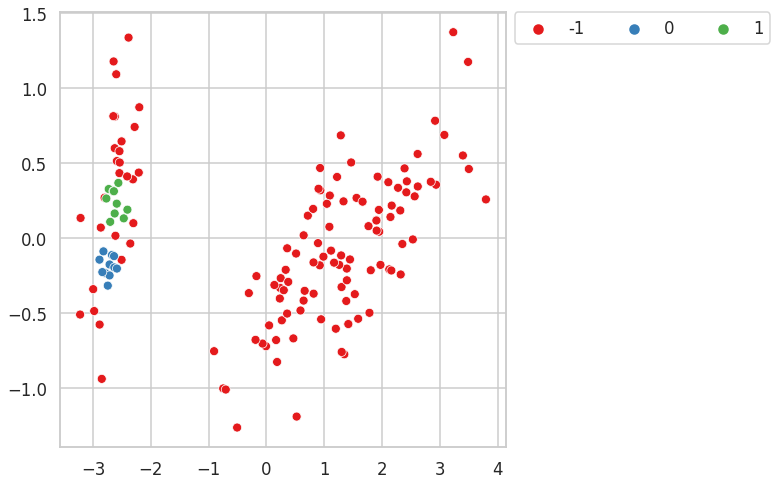

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.20 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.20 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.20 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.20 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.20 produces only one cluster
-----------------------------------------------------------------------------------------------

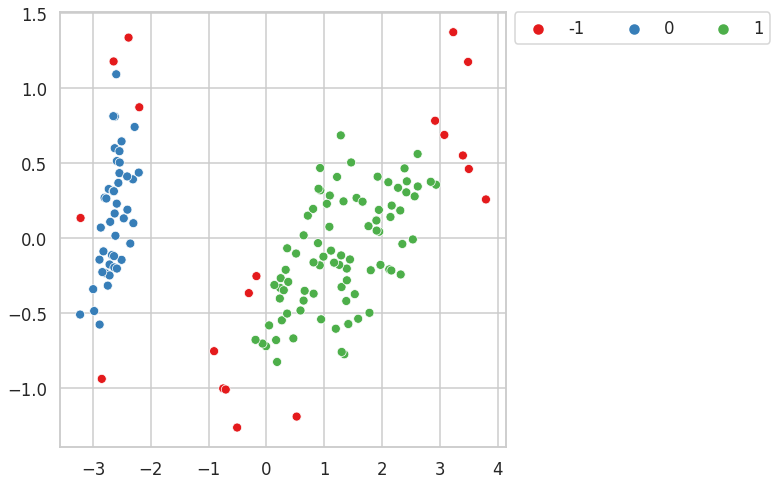

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.30 produces 4 clusters with silhouette score : 0.45
The Noise percentage is : 0.13333333333333333
 1    38.666667
 0    30.000000
 2    18.000000
-1    13.333333
dtype: float64


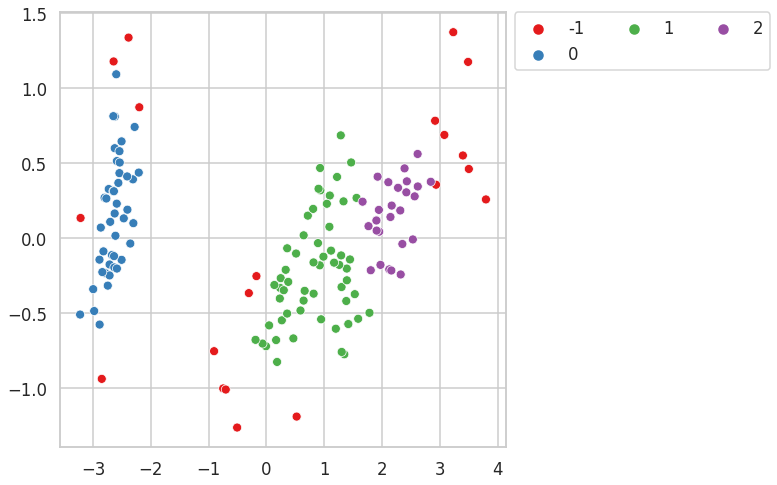

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.30 produces 4 clusters with silhouette score : 0.45
The Noise percentage is : 0.13333333333333333
 1    38.666667
 0    30.000000
 2    18.000000
-1    13.333333
dtype: float64


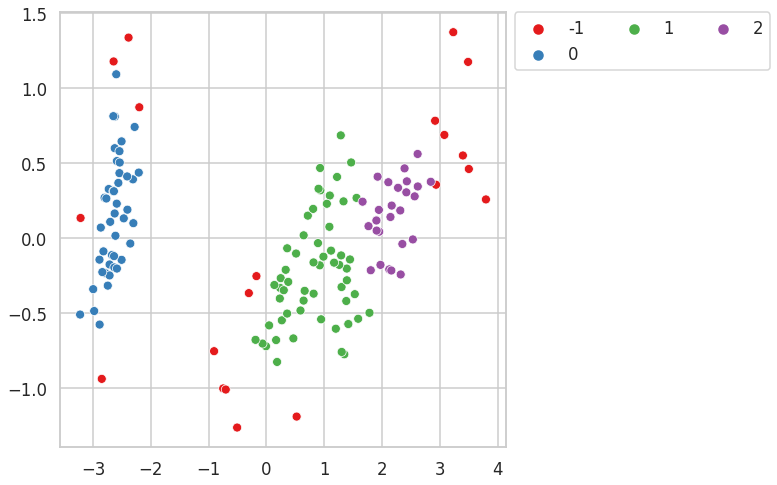

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.30 produces 5 clusters with silhouette score : 0.38
The Noise percentage is : 0.17333333333333334
 0    29.333333
 1    24.666667
-1    17.333333
 3    16.666667
 2    12.000000
dtype: float64


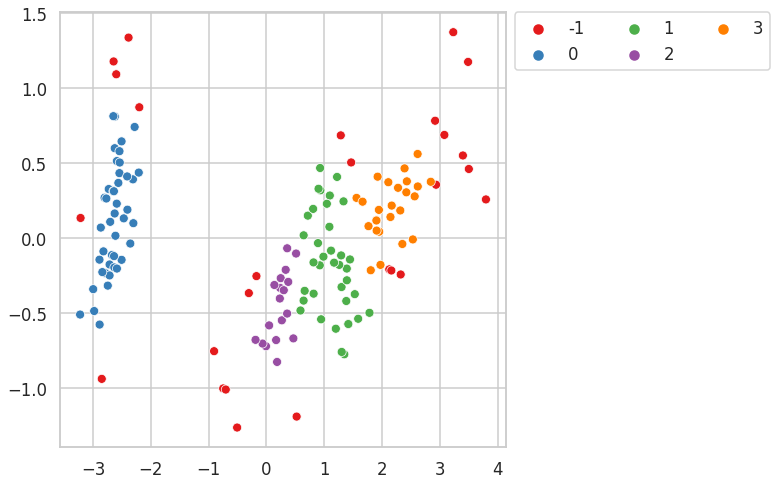

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.30 produces 5 clusters with silhouette score : 0.38
The Noise percentage is : 0.18
 0    29.333333
 1    22.000000
-1    18.000000
 3    16.666667
 2    14.000000
dtype: float64


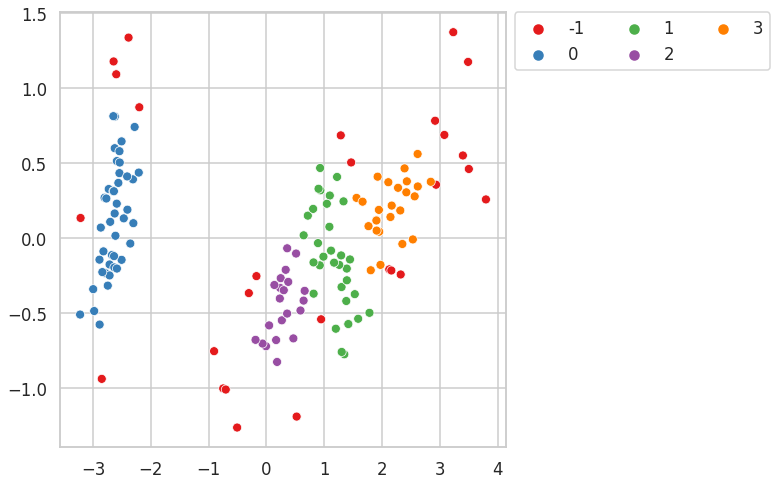

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.30 produces 5 clusters with silhouette score : 0.31
The Noise percentage is : 0.26666666666666666
 0    28.666667
-1    26.666667
 1    16.666667
 3    16.000000
 2    12.000000
dtype: float64


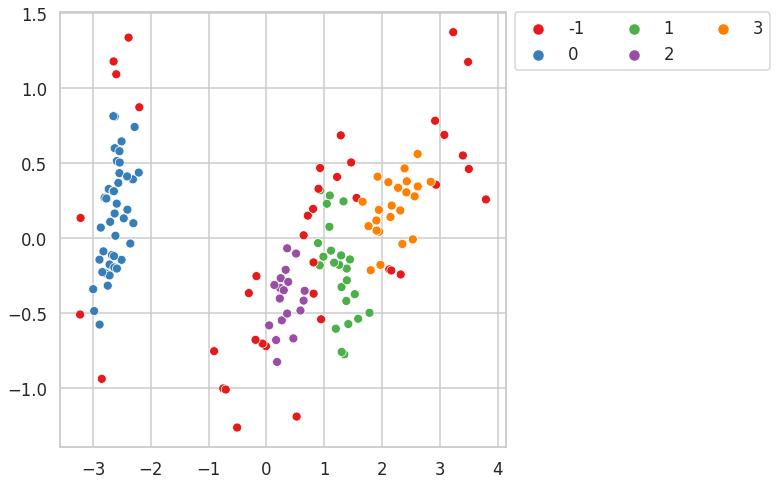

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.30 produces 5 clusters with silhouette score : 0.24
The Noise percentage is : 0.35333333333333333
-1    35.333333
 0    28.666667
 3    12.666667
 1    12.000000
 2    11.333333
dtype: float64


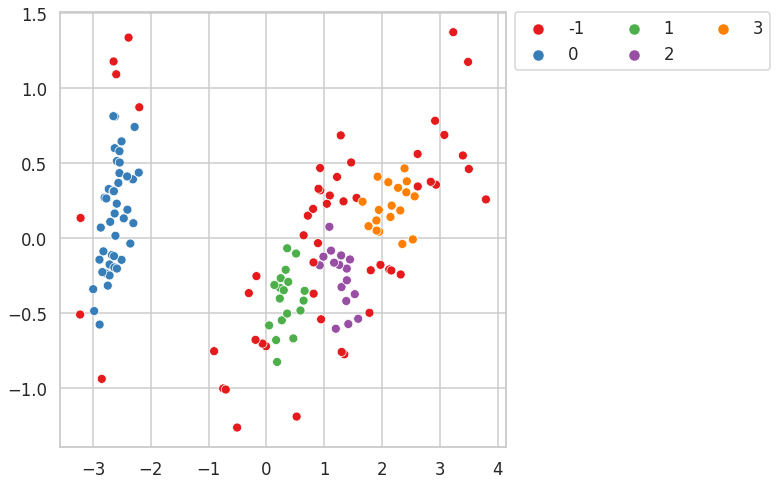

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.30 produces 4 clusters with silhouette score : 0.12
The Noise percentage is : 0.52
-1    52.0
 0    28.0
 1    12.0
 2     8.0
dtype: float64


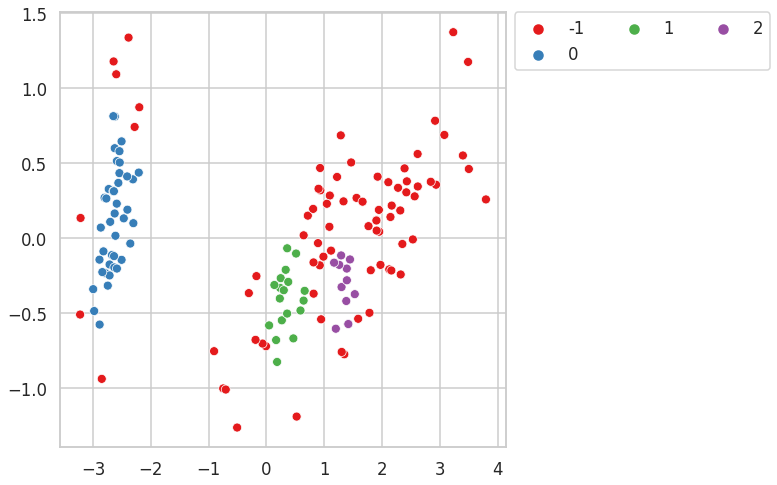

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.30 produces 3 clusters with silhouette score : 0.21
The Noise percentage is : 0.6133333333333333
-1    61.333333
 0    28.000000
 1    10.666667
dtype: float64


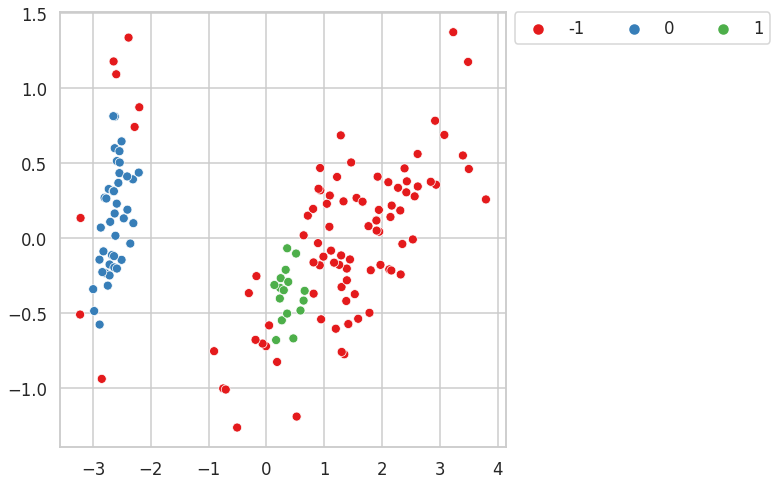

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.30 produces 3 clusters with silhouette score : 0.19
The Noise percentage is : 0.6266666666666667
-1    62.666667
 0    28.000000
 1     9.333333
dtype: float64


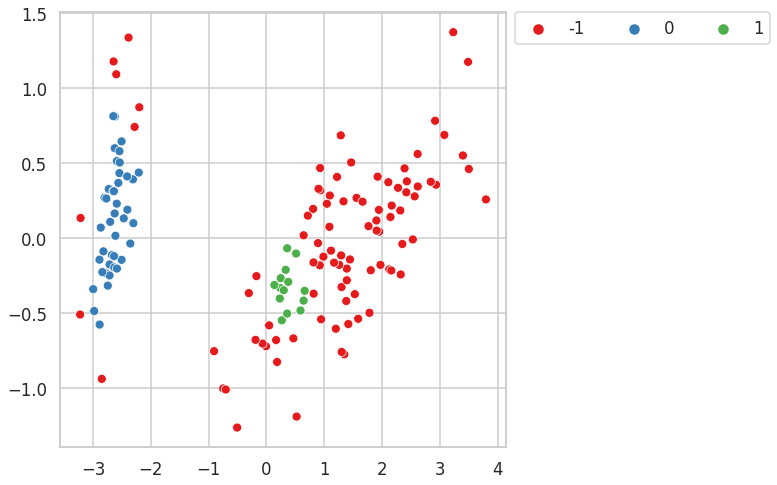

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.30 produces 2 clusters with silhouette score : 0.55
The Noise percentage is : 0.74
-1    74.0
 0    26.0
dtype: float64


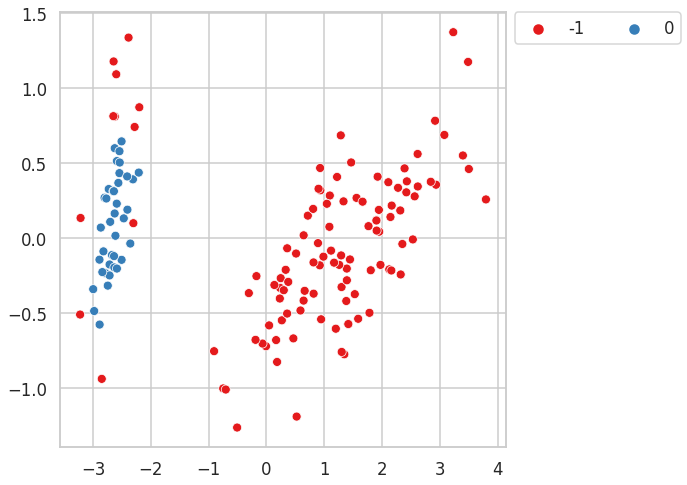

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.30 produces 2 clusters with silhouette score : 0.51
The Noise percentage is : 0.76
-1    76.0
 0    24.0
dtype: float64


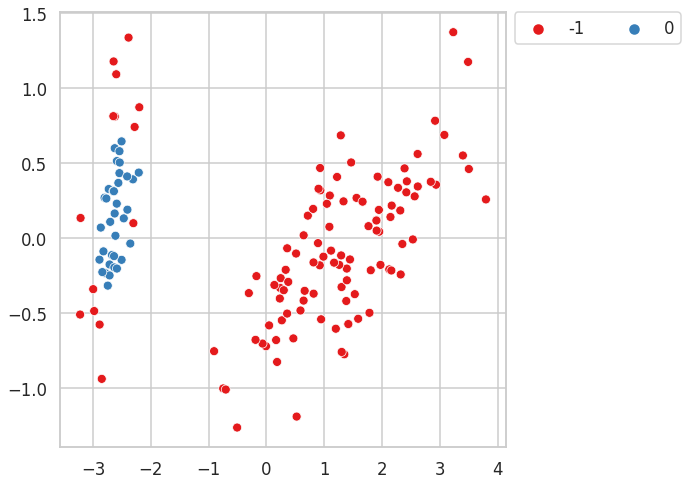

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 0.30 produces 2 clusters with silhouette score : 0.50
The Noise percentage is : 0.7666666666666667
-1    76.666667
 0    23.333333
dtype: float64


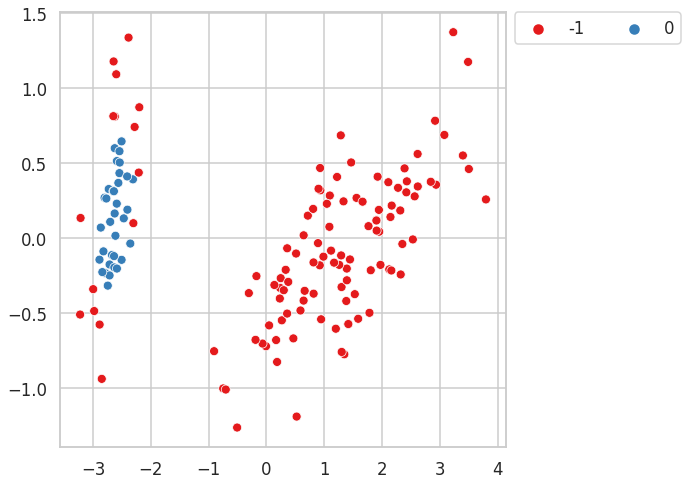

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 0.30 produces 2 clusters with silhouette score : 0.44
The Noise percentage is : 0.7933333333333333
-1    79.333333
 0    20.666667
dtype: float64


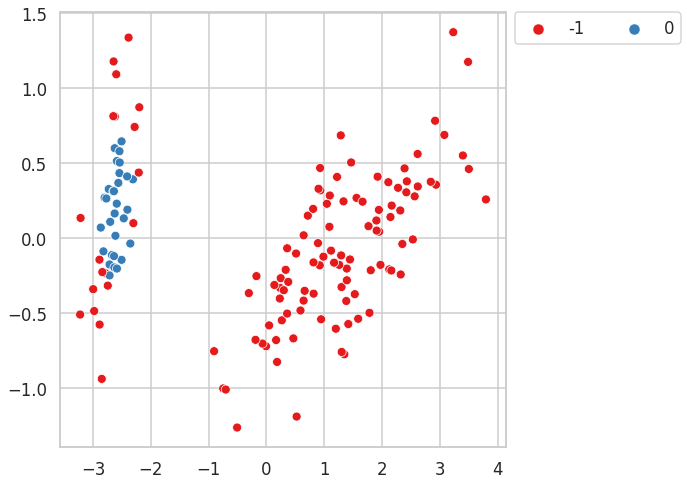

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 0.30 produces 2 clusters with silhouette score : 0.44
The Noise percentage is : 0.7933333333333333
-1    79.333333
 0    20.666667
dtype: float64


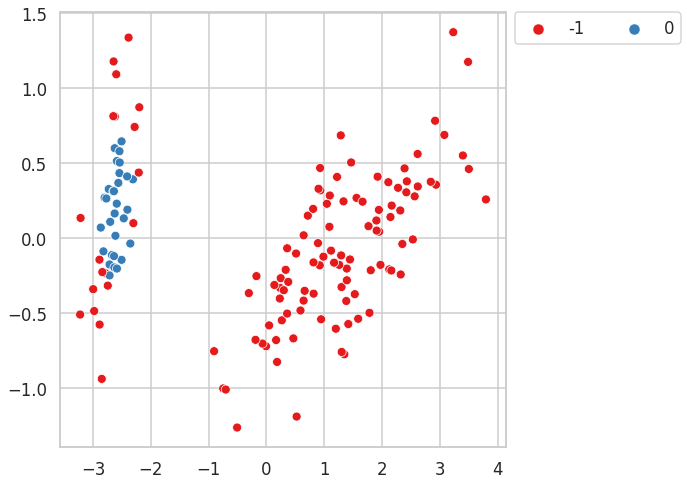

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 0.30 produces 2 clusters with silhouette score : 0.28
The Noise percentage is : 0.8666666666666667
-1    86.666667
 0    13.333333
dtype: float64


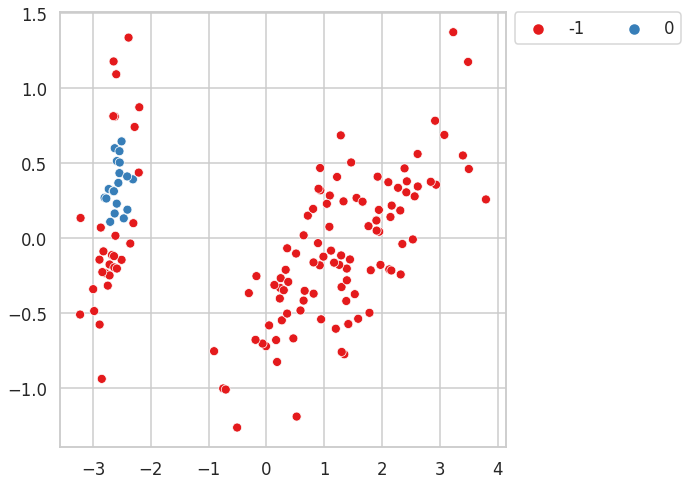

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 0.30 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 0.30 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 0.30 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 0.30 produces only one cluster
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 0.30 produces only one cluster
-----------------------------------------------------------------------------------------------

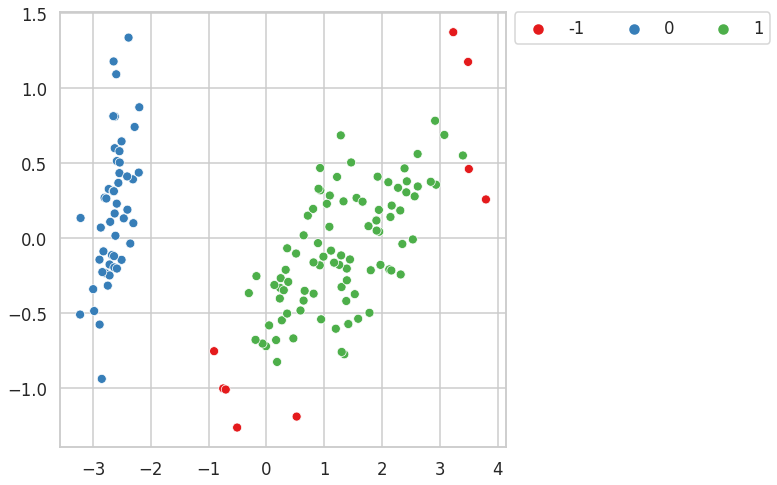

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.07333333333333333
 1    60.000000
 0    32.666667
-1     7.333333
dtype: float64


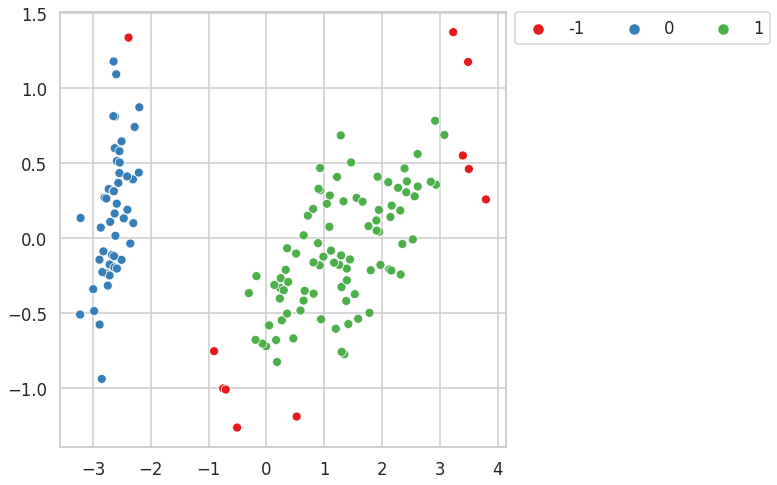

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.08666666666666667
 1    58.666667
 0    32.666667
-1     8.666667
dtype: float64


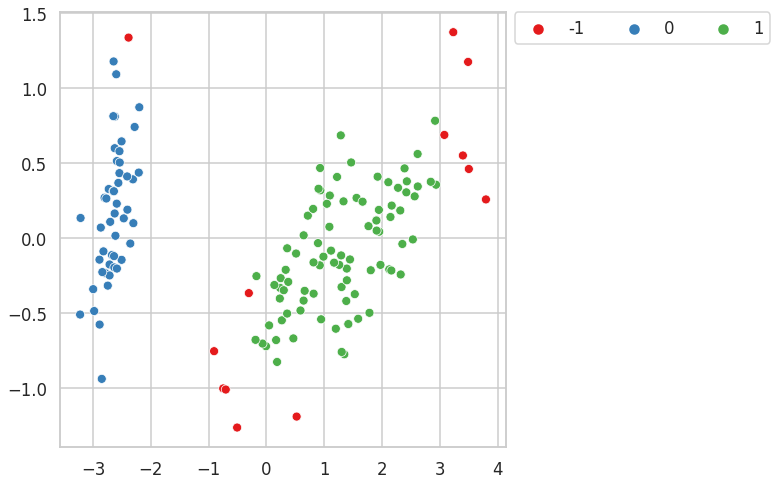

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.08666666666666667
 1    58.666667
 0    32.666667
-1     8.666667
dtype: float64


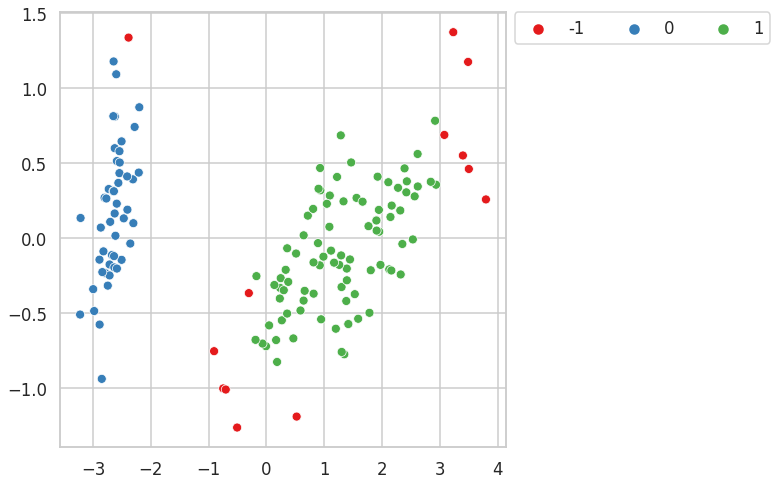

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.08666666666666667
 1    58.666667
 0    32.666667
-1     8.666667
dtype: float64


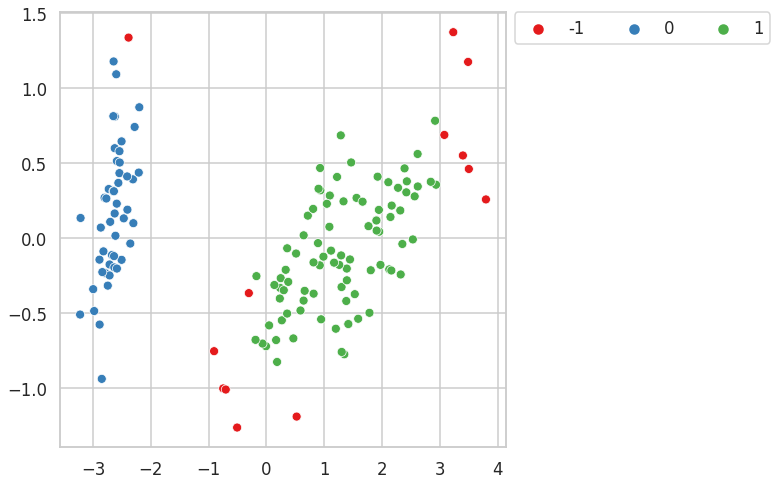

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.1
 1    58.0
 0    32.0
-1    10.0
dtype: float64


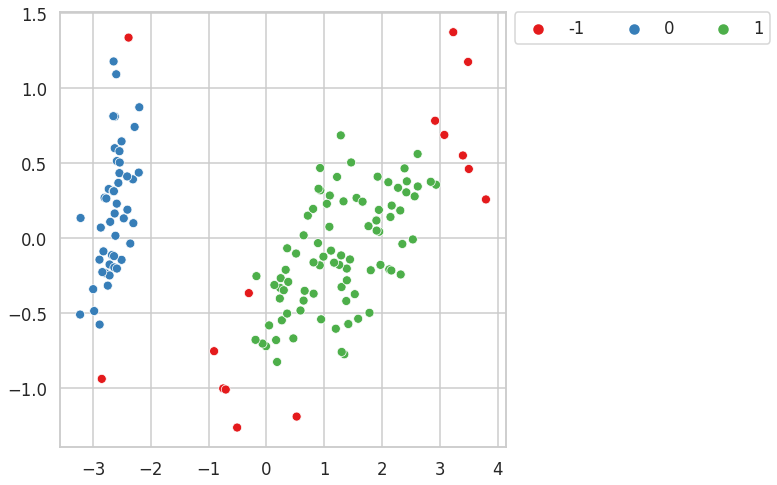

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.1
 1    58.0
 0    32.0
-1    10.0
dtype: float64


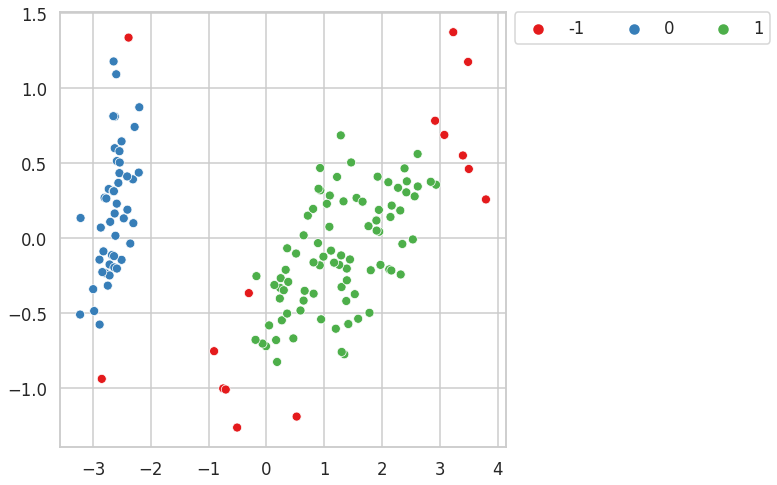

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.53
The Noise percentage is : 0.12666666666666668
 1    56.666667
 0    30.666667
-1    12.666667
dtype: float64


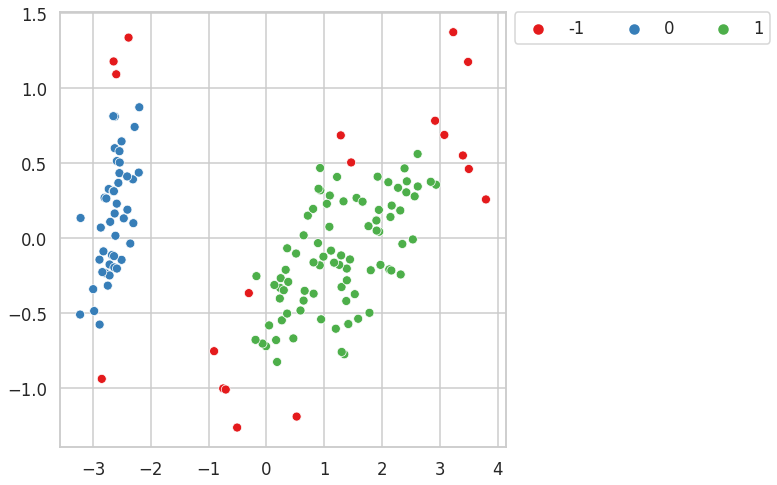

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.40 produces 3 clusters with silhouette score : 0.52
The Noise percentage is : 0.14
 1    55.333333
 0    30.666667
-1    14.000000
dtype: float64


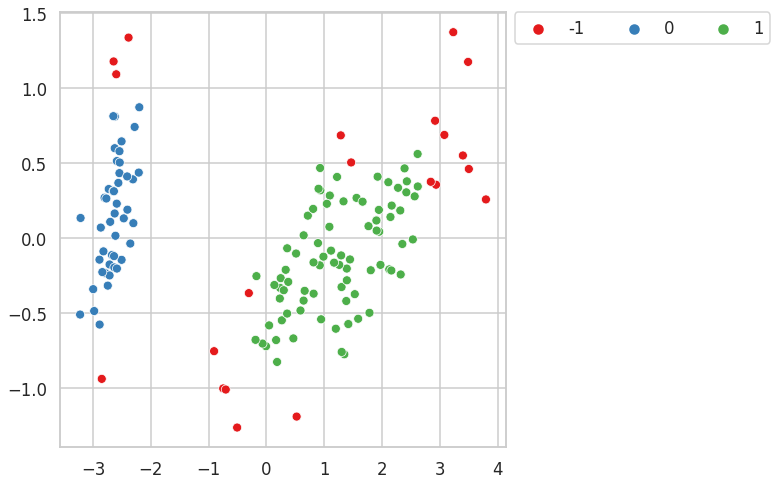

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.40 produces 4 clusters with silhouette score : 0.42
The Noise percentage is : 0.17333333333333334
 1    36.000000
 0    30.000000
-1    17.333333
 2    16.666667
dtype: float64


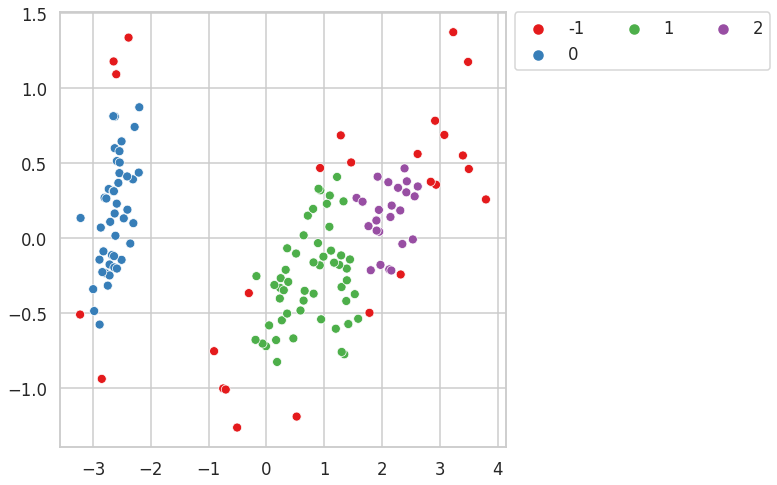

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.40 produces 4 clusters with silhouette score : 0.38
The Noise percentage is : 0.20666666666666667
 1    34.666667
 0    30.000000
-1    20.666667
 2    14.666667
dtype: float64


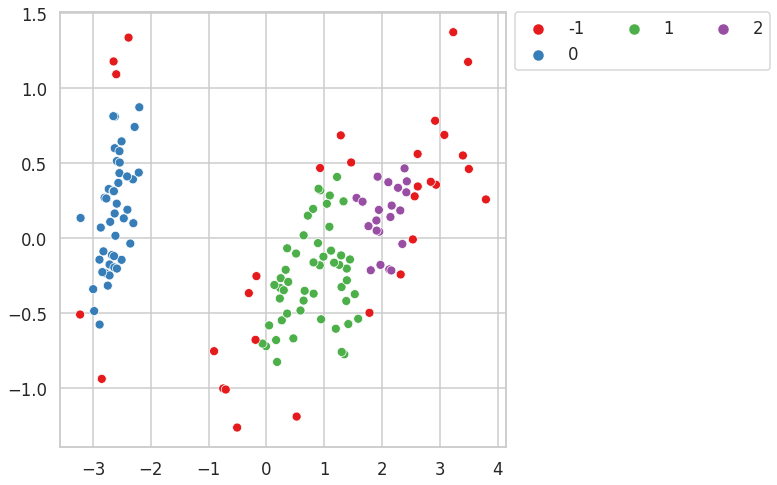

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.40 produces 4 clusters with silhouette score : 0.34
The Noise percentage is : 0.2733333333333333
 0    30.000000
 1    29.333333
-1    27.333333
 2    13.333333
dtype: float64


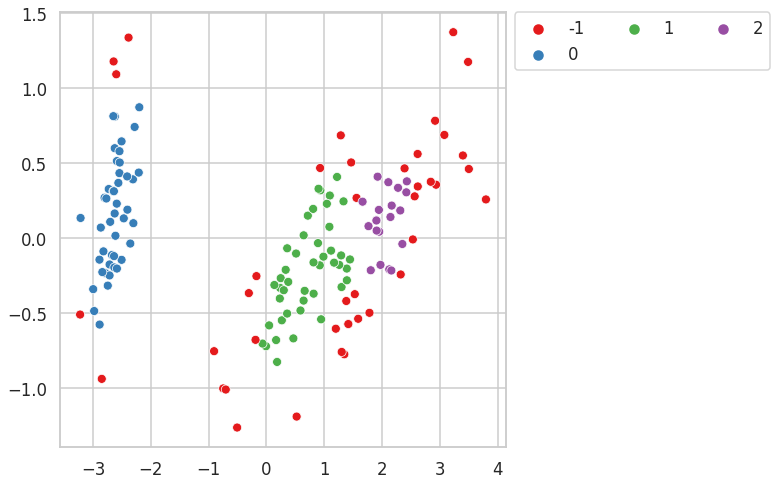

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 0.40 produces 5 clusters with silhouette score : 0.27
The Noise percentage is : 0.32
-1    32.0
 0    30.0
 1    14.0
 2    12.0
 3    12.0
dtype: float64


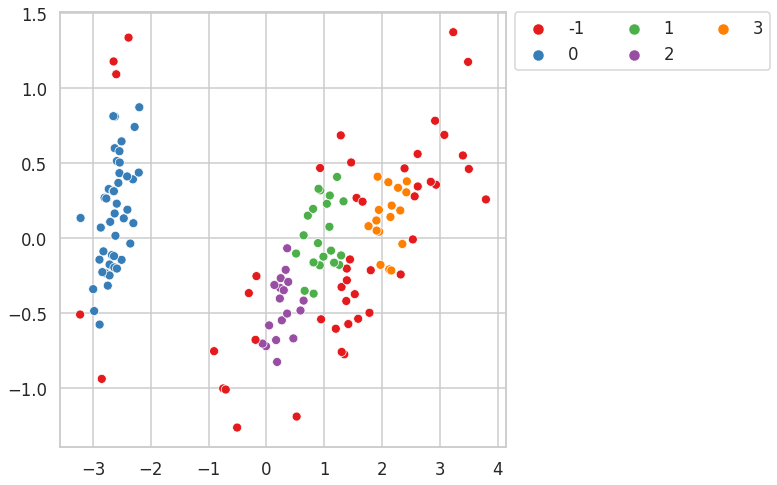

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 0.40 produces 4 clusters with silhouette score : 0.19
The Noise percentage is : 0.46
-1    46.0
 0    30.0
 1    12.0
 2    12.0
dtype: float64


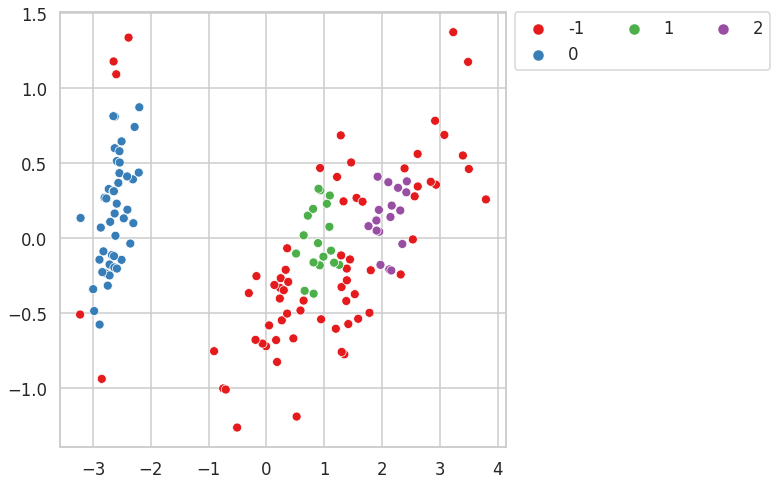

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 0.40 produces 2 clusters with silhouette score : 0.60
The Noise percentage is : 0.72
-1    72.0
 0    28.0
dtype: float64


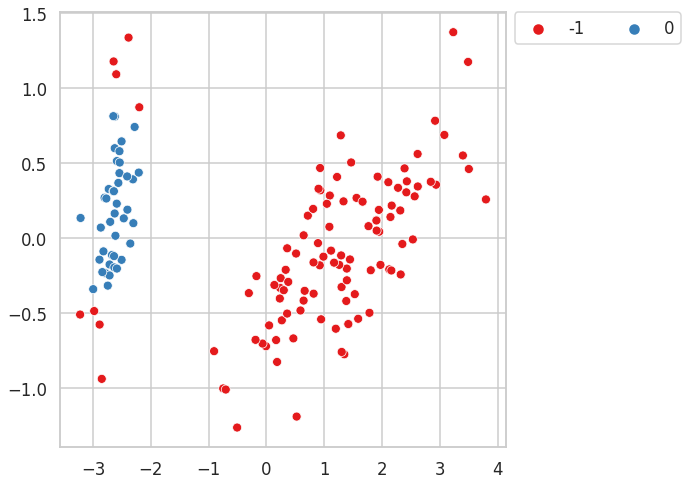

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 0.40 produces 2 clusters with silhouette score : 0.60
The Noise percentage is : 0.72
-1    72.0
 0    28.0
dtype: float64


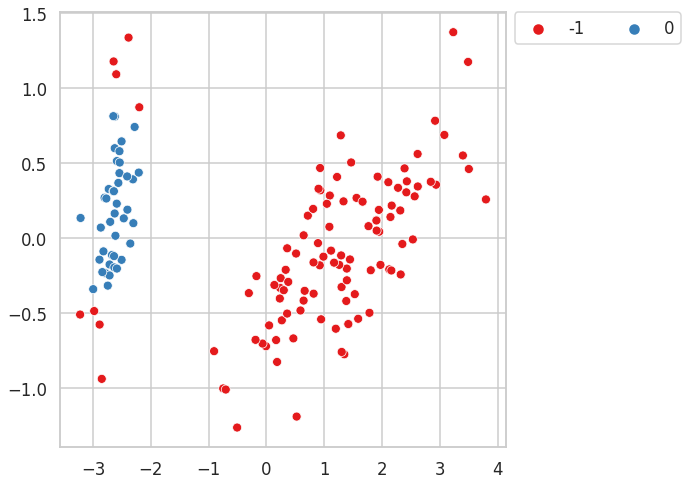

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 0.40 produces 2 clusters with silhouette score : 0.60
The Noise percentage is : 0.72
-1    72.0
 0    28.0
dtype: float64


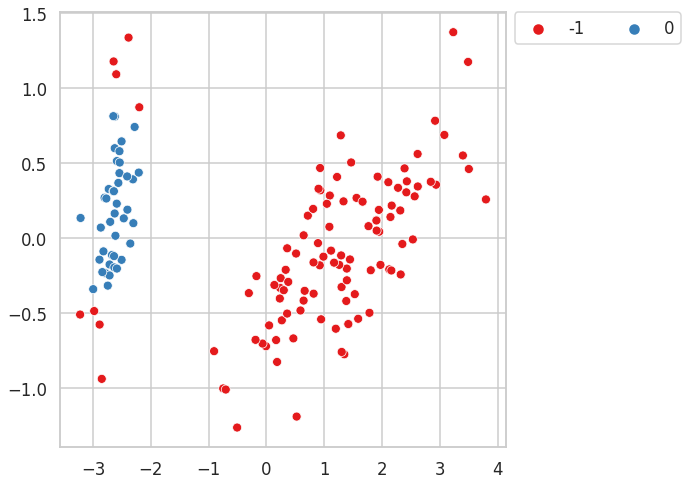

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 0.40 produces 2 clusters with silhouette score : 0.58
The Noise percentage is : 0.7266666666666667
-1    72.666667
 0    27.333333
dtype: float64


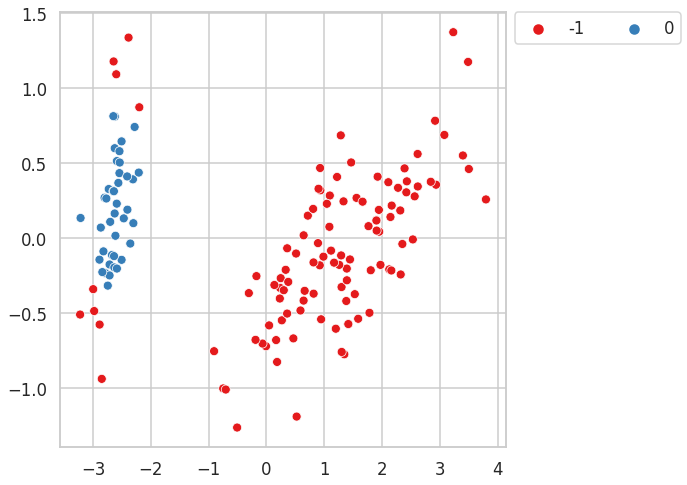

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 0.40 produces 2 clusters with silhouette score : 0.56
The Noise percentage is : 0.7333333333333333
-1    73.333333
 0    26.666667
dtype: float64


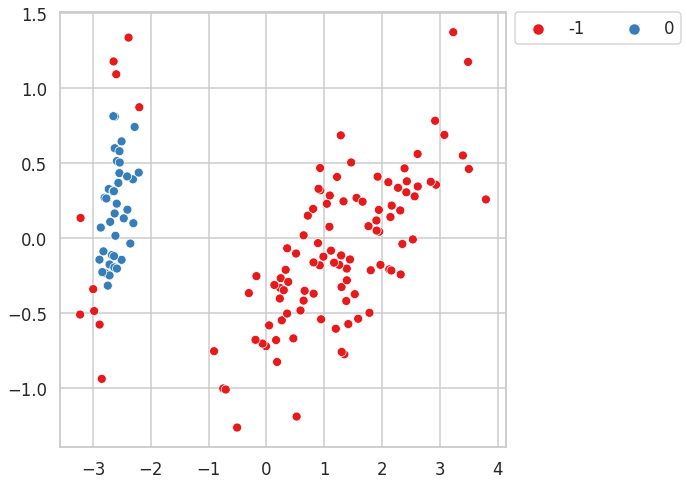

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 0.40 produces 2 clusters with silhouette score : 0.50
The Noise percentage is : 0.7666666666666667
-1    76.666667
 0    23.333333
dtype: float64


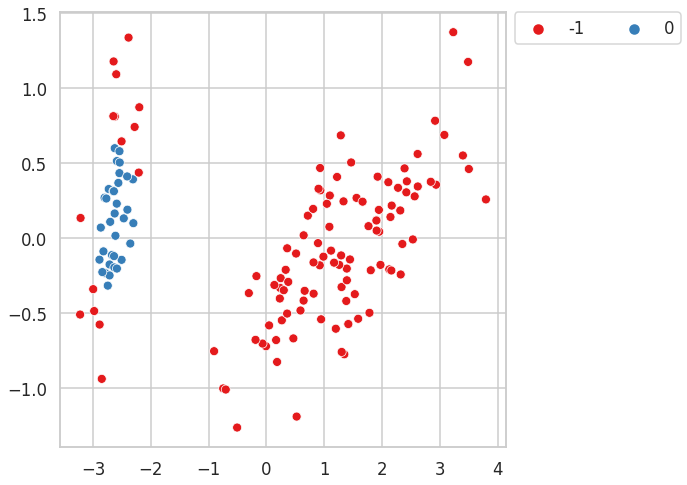

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 0.40 produces 2 clusters with silhouette score : 0.50
The Noise percentage is : 0.7666666666666667
-1    76.666667
 0    23.333333
dtype: float64


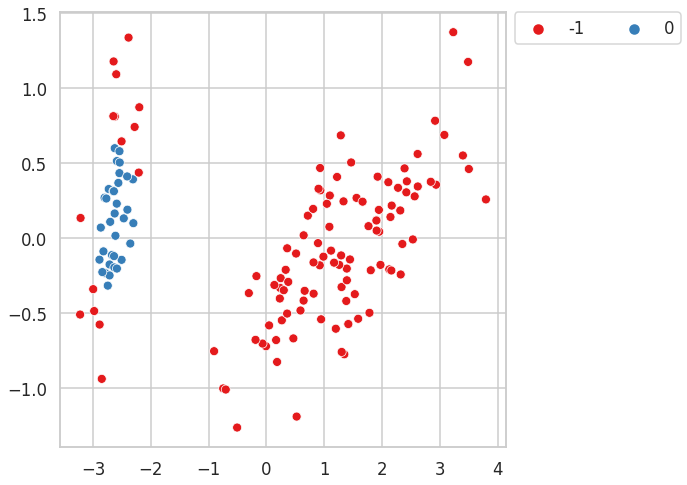

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


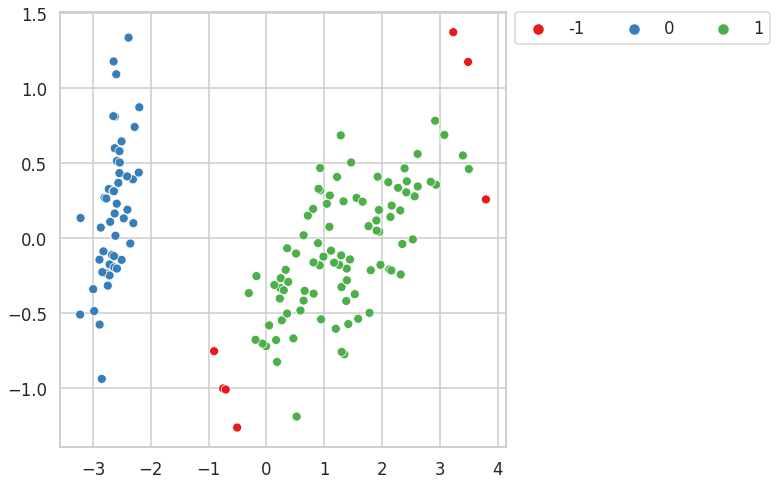

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


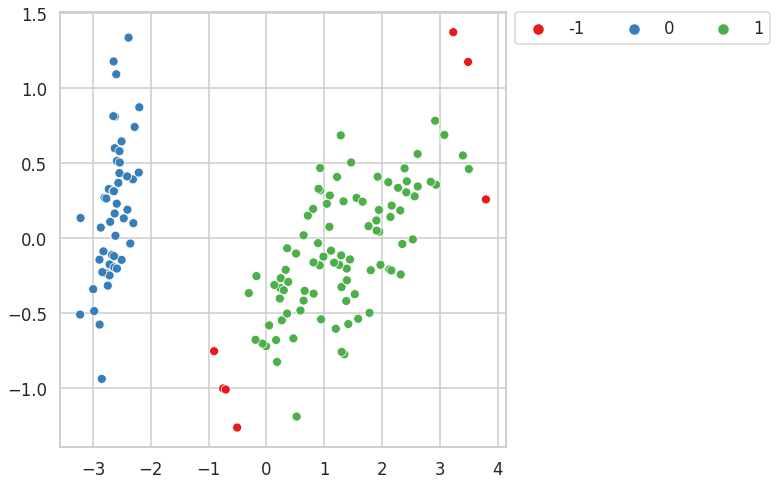

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


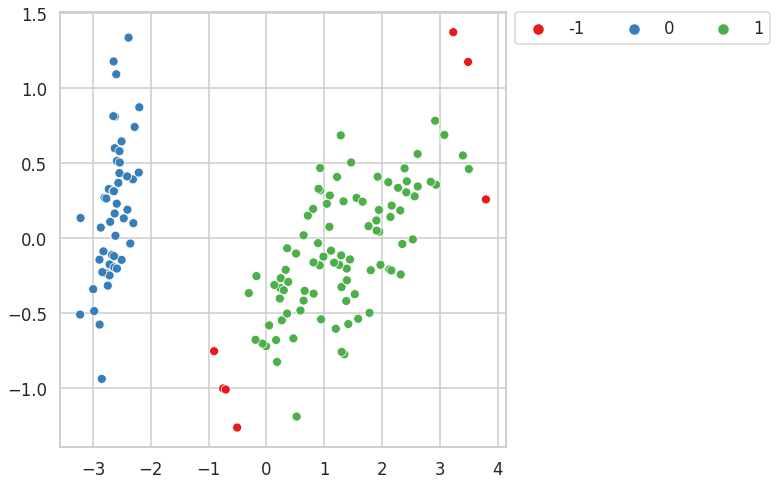

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


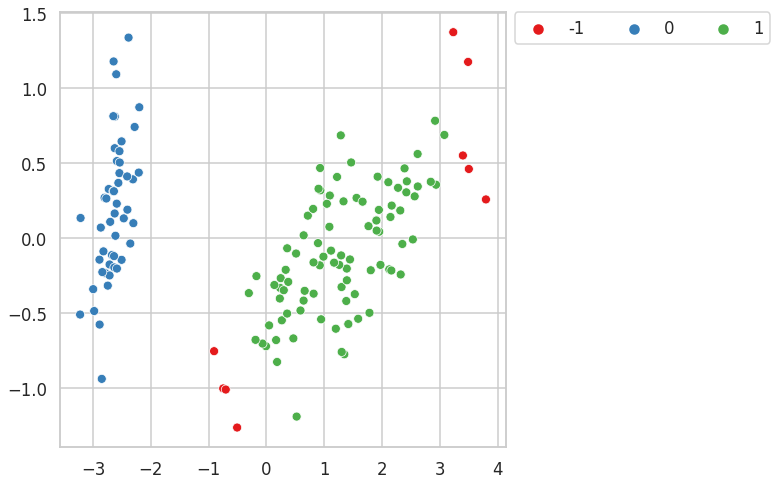

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


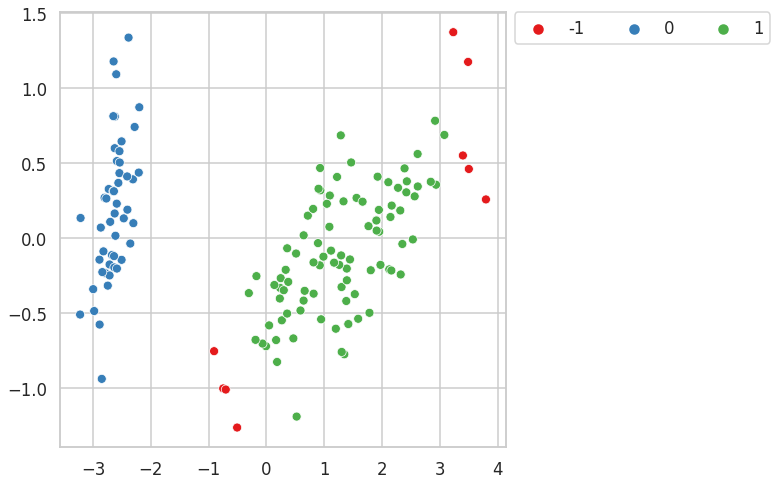

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.59
The Noise percentage is : 0.06666666666666667
 1    60.666667
 0    32.666667
-1     6.666667
dtype: float64


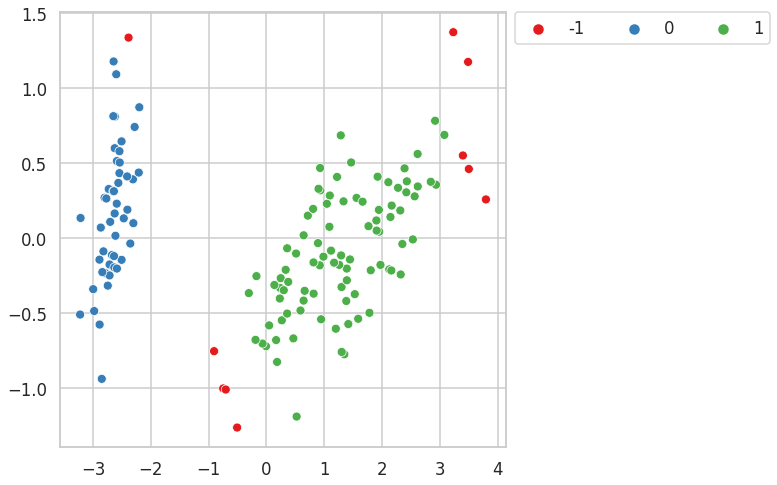

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.59
The Noise percentage is : 0.06666666666666667
 1    60.666667
 0    32.666667
-1     6.666667
dtype: float64


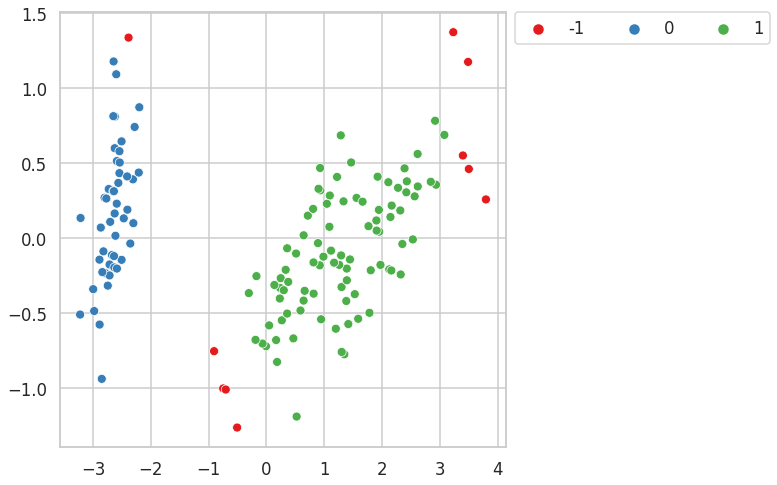

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.59
The Noise percentage is : 0.06666666666666667
 1    60.666667
 0    32.666667
-1     6.666667
dtype: float64


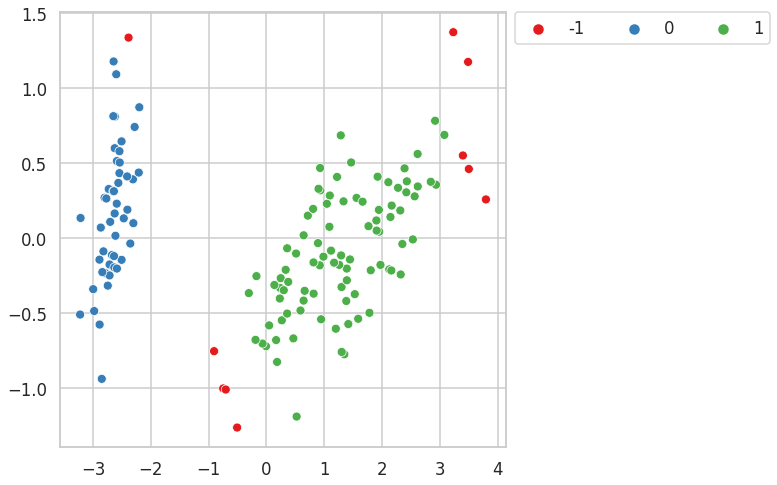

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.08
 1    59.333333
 0    32.666667
-1     8.000000
dtype: float64


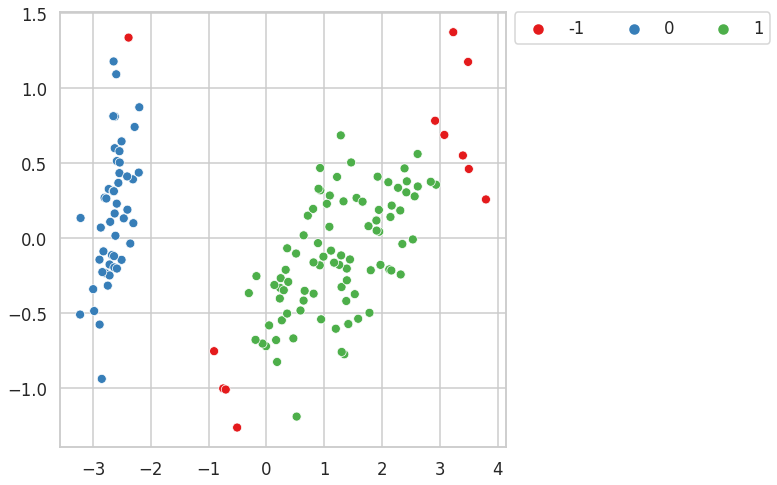

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.08666666666666667
 1    58.666667
 0    32.666667
-1     8.666667
dtype: float64


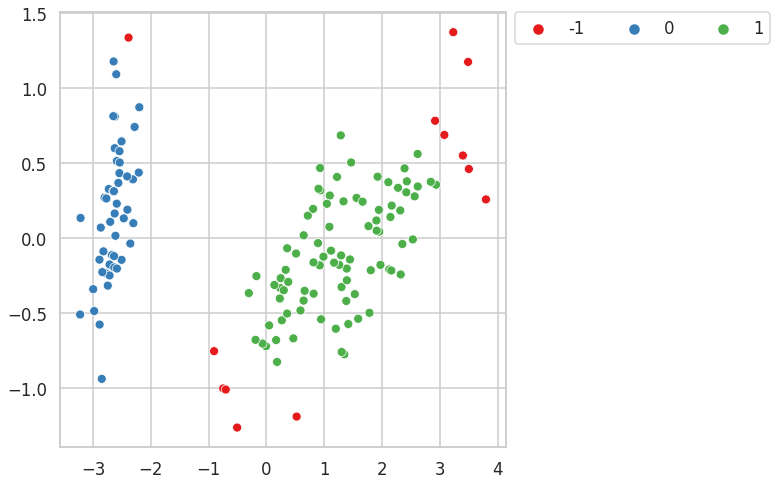

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.08666666666666667
 1    58.666667
 0    32.666667
-1     8.666667
dtype: float64


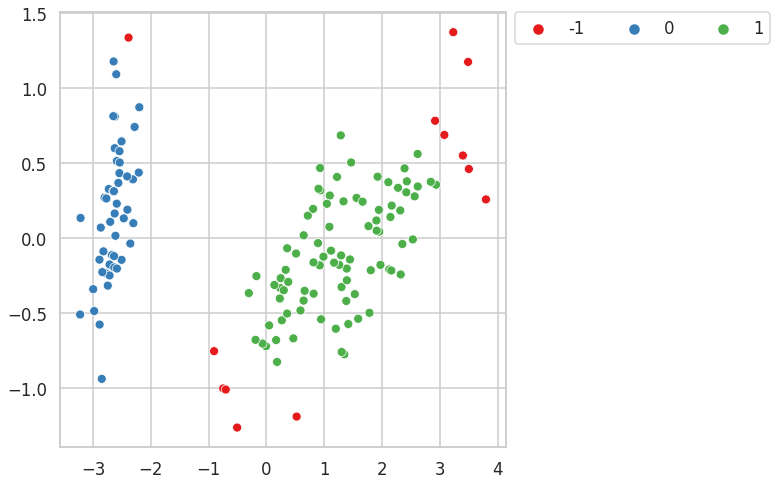

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.10666666666666667
 1    57.333333
 0    32.000000
-1    10.666667
dtype: float64


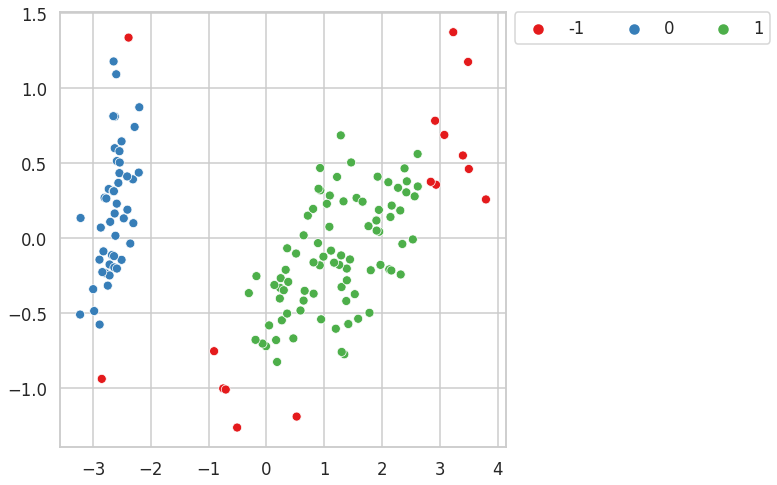

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.10666666666666667
 1    57.333333
 0    32.000000
-1    10.666667
dtype: float64


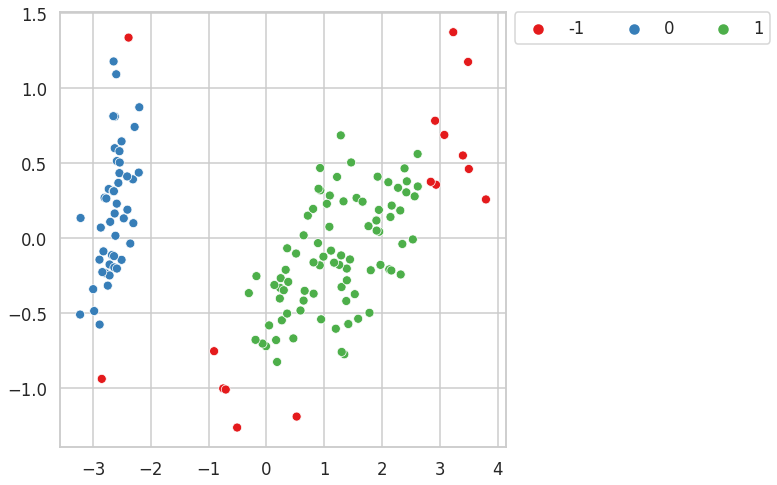

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.10666666666666667
 1    57.333333
 0    32.000000
-1    10.666667
dtype: float64


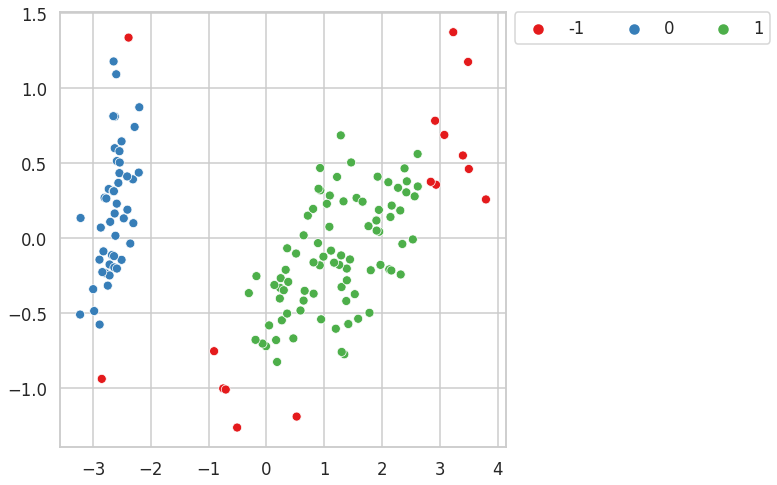

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.11333333333333333
 1    57.333333
 0    31.333333
-1    11.333333
dtype: float64


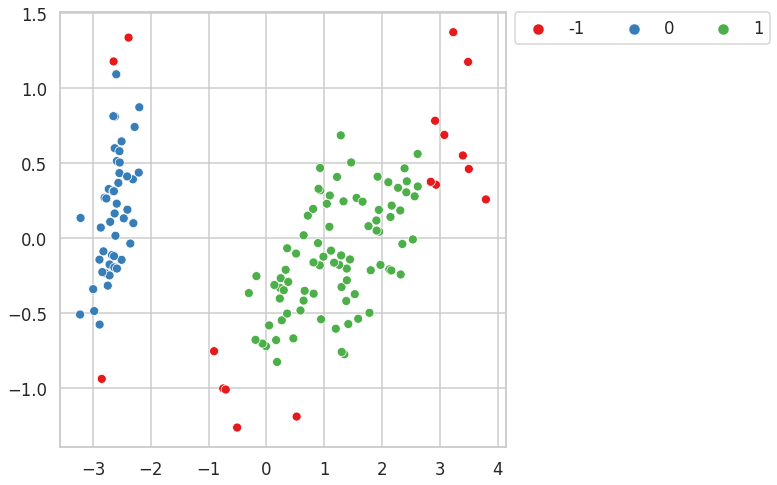

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.11333333333333333
 1    57.333333
 0    31.333333
-1    11.333333
dtype: float64


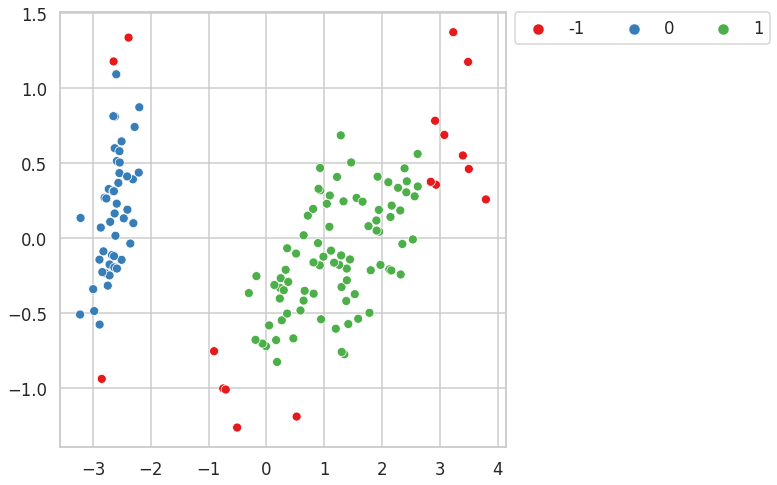

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 0.50 produces 4 clusters with silhouette score : 0.44
The Noise percentage is : 0.14
 1    40.000000
 0    31.333333
 2    14.666667
-1    14.000000
dtype: float64


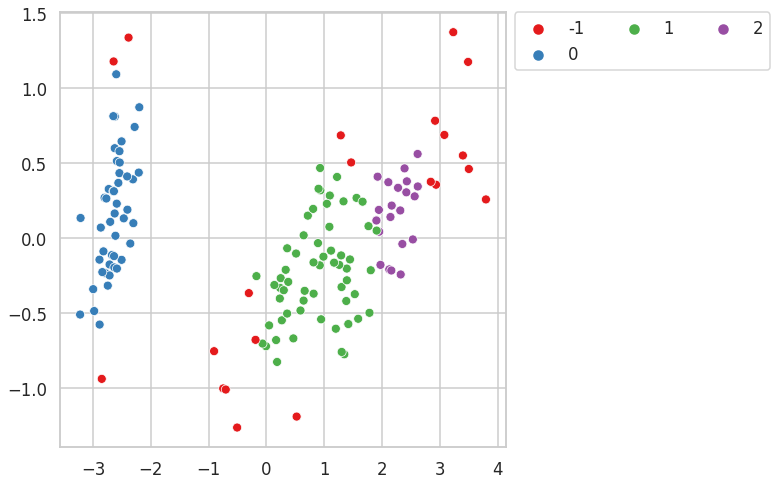

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 0.50 produces 4 clusters with silhouette score : 0.38
The Noise percentage is : 0.24666666666666667
 0    31.333333
 1    29.333333
-1    24.666667
 2    14.666667
dtype: float64


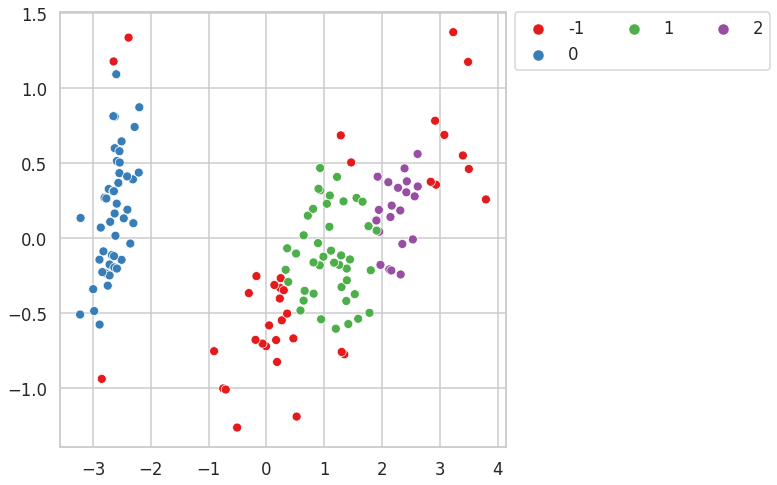

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 0.50 produces 4 clusters with silhouette score : 0.39
The Noise percentage is : 0.26
 0    31.333333
-1    26.000000
 1    25.333333
 2    17.333333
dtype: float64


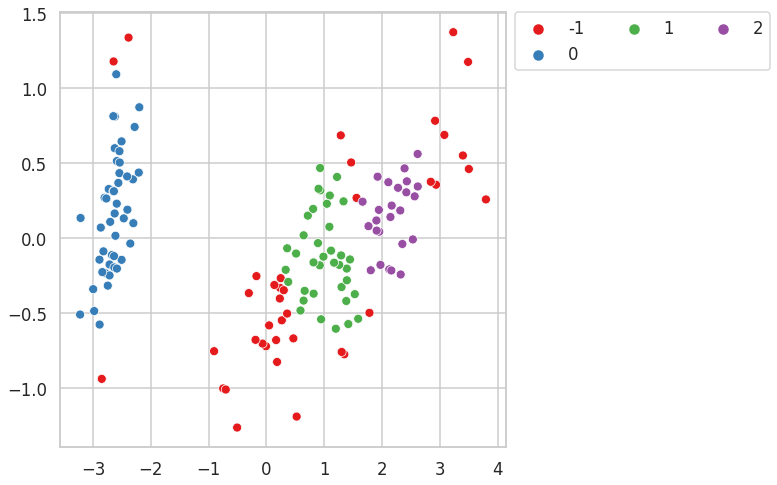

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 0.50 produces 4 clusters with silhouette score : 0.36
The Noise percentage is : 0.2866666666666667
 0    31.333333
-1    28.666667
 1    24.000000
 2    16.000000
dtype: float64


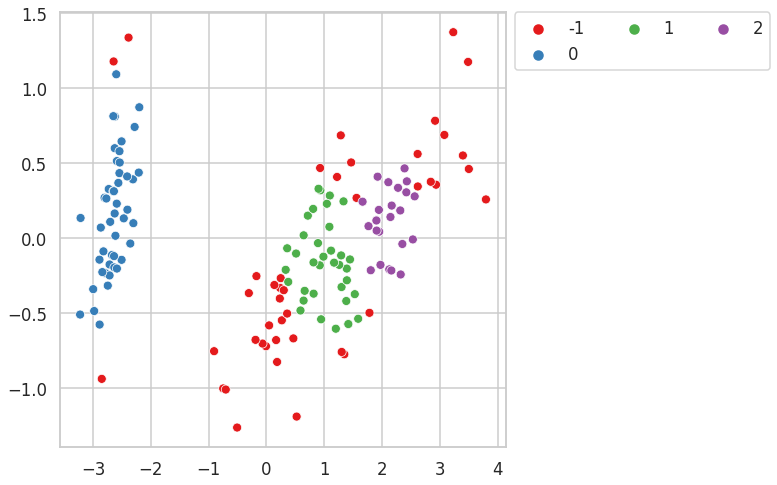

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 0.50 produces 3 clusters with silhouette score : 0.23
The Noise percentage is : 0.5133333333333333
-1    51.333333
 0    31.333333
 1    17.333333
dtype: float64


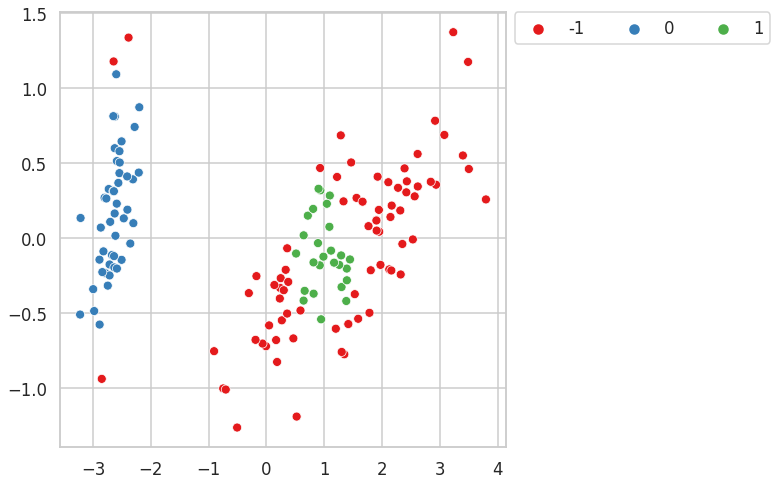

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


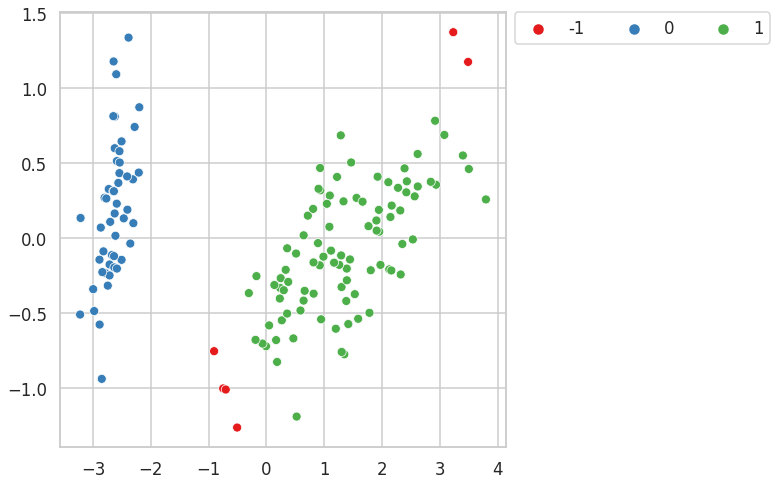

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


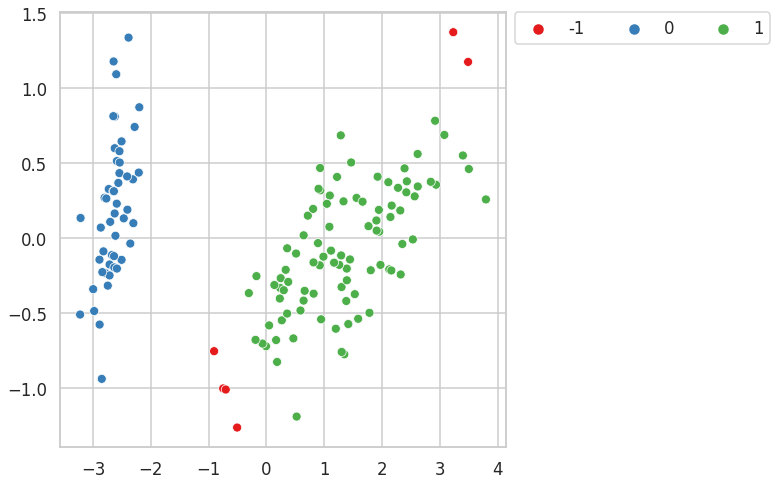

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


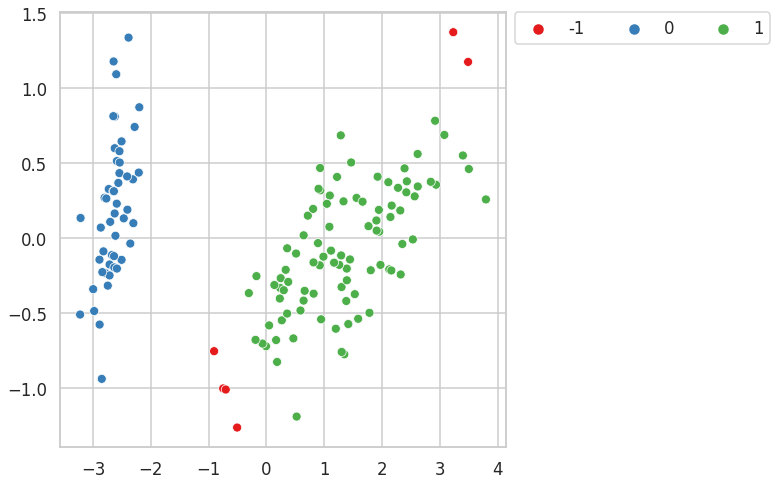

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


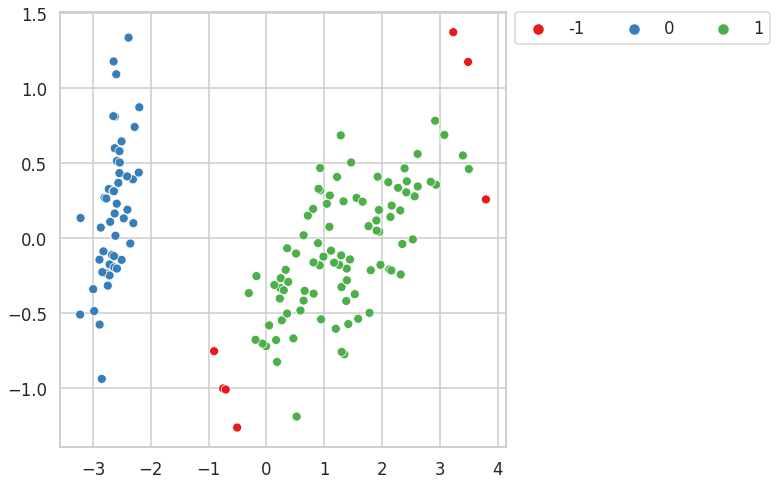

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


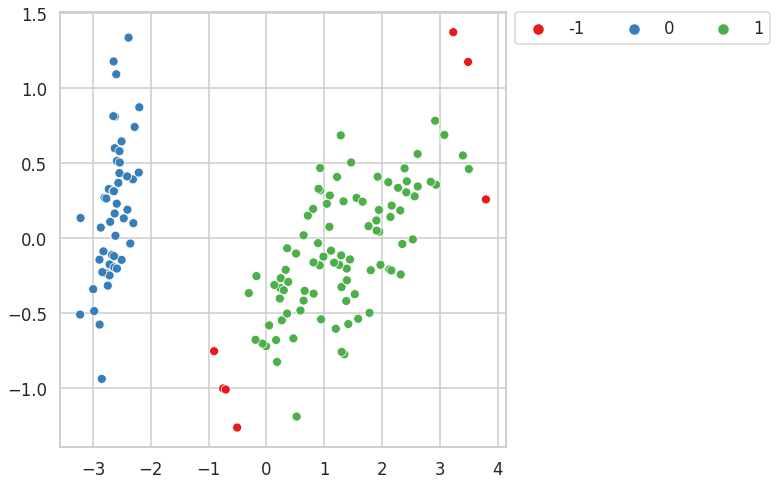

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


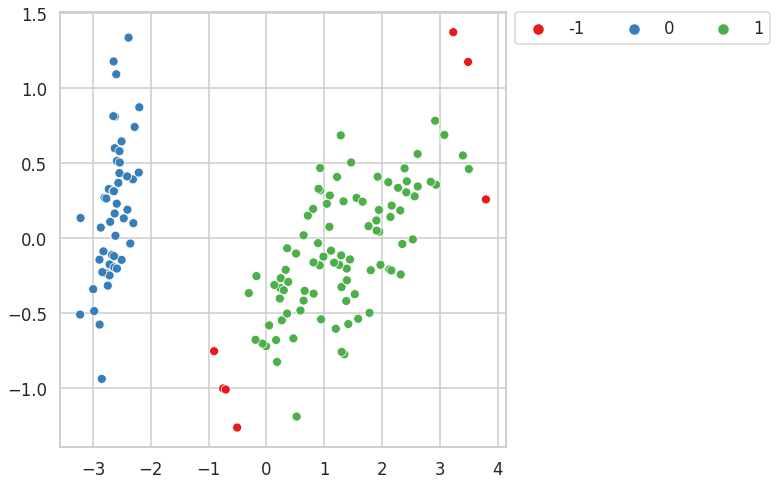

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


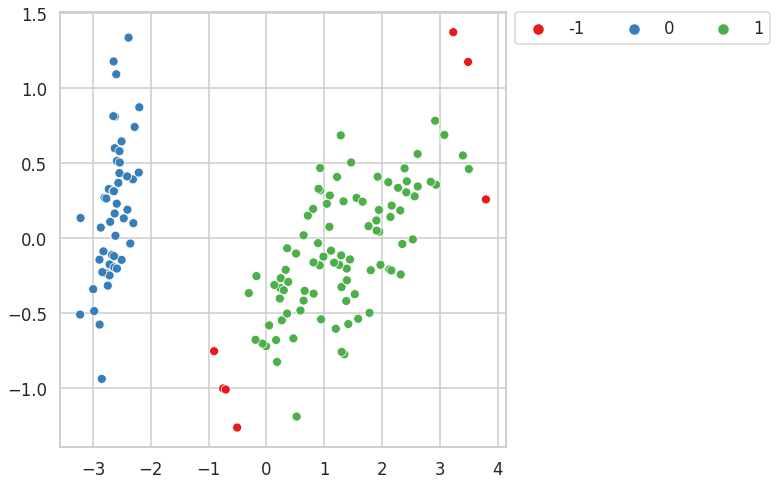

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


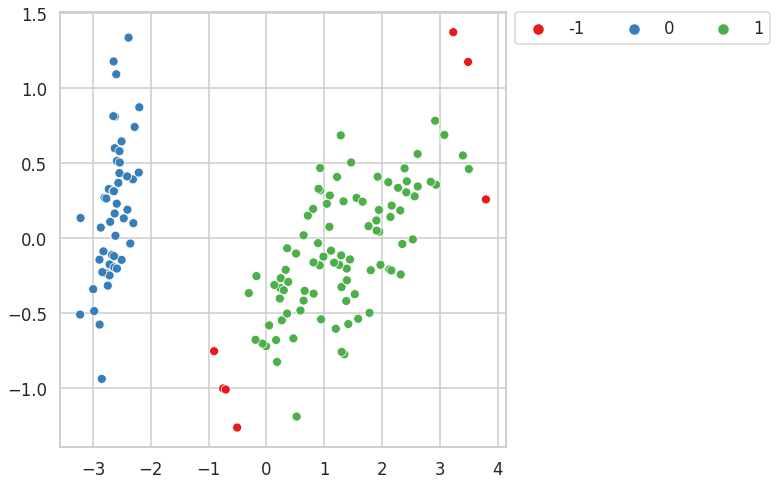

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.04666666666666667
 1    62.000000
 0    33.333333
-1     4.666667
dtype: float64


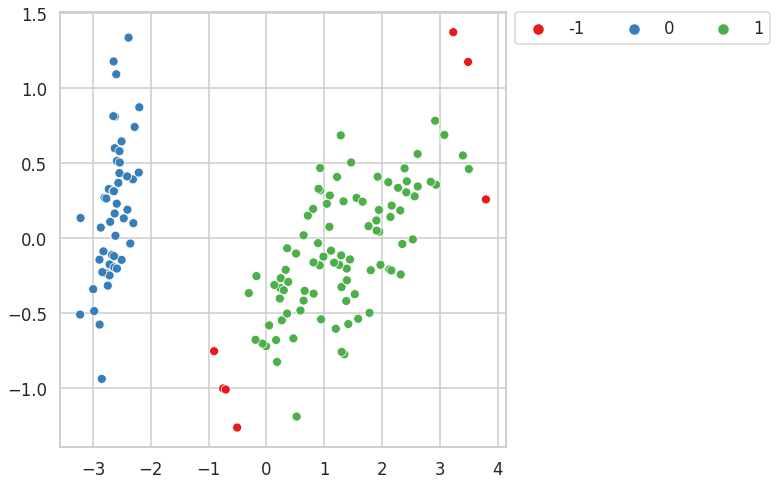

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.05333333333333334
 1    61.333333
 0    33.333333
-1     5.333333
dtype: float64


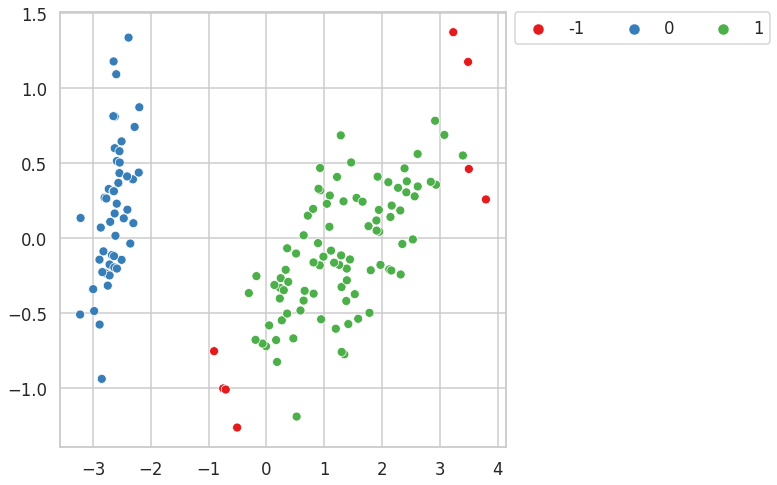

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


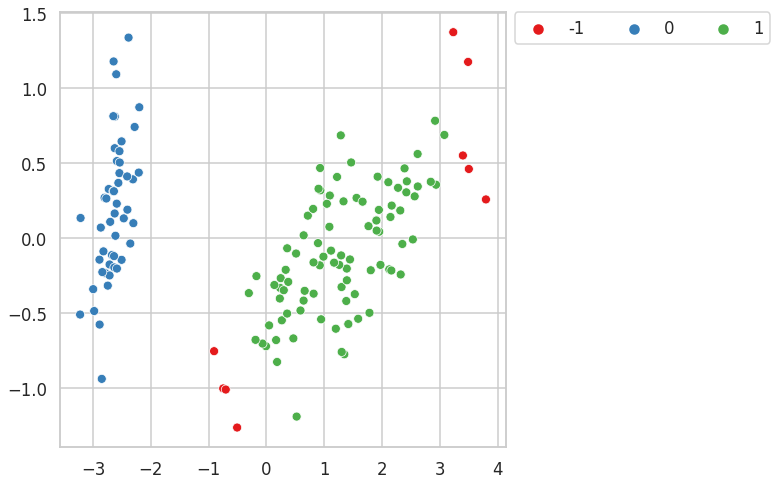

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


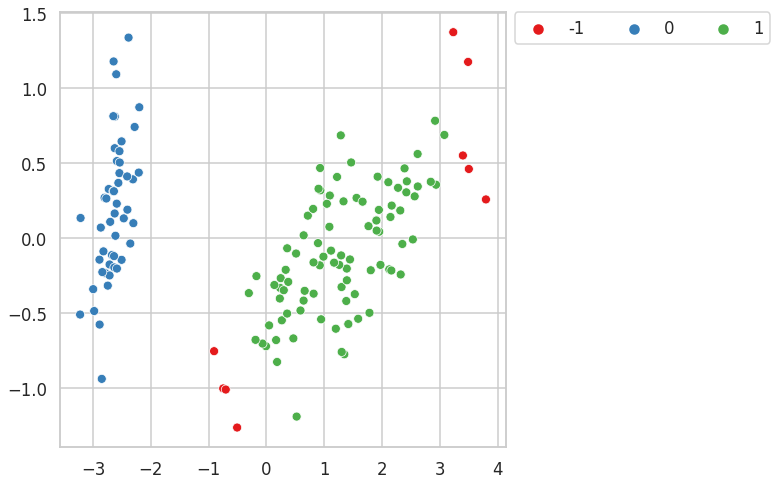

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


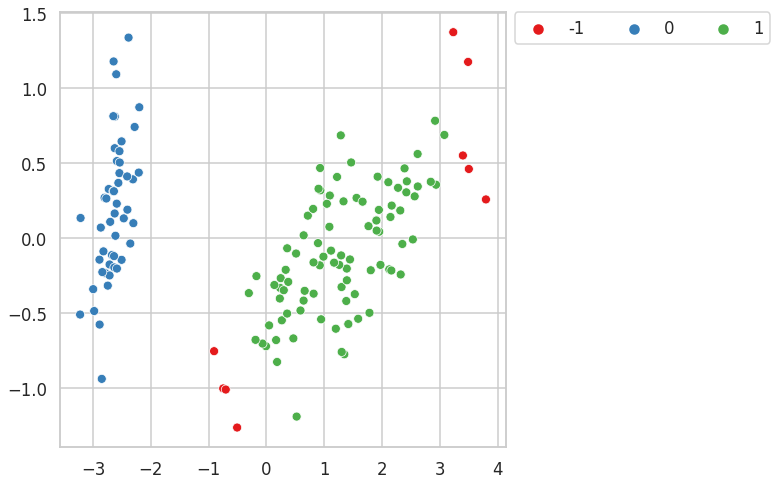

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.07333333333333333
 1    59.333333
 0    33.333333
-1     7.333333
dtype: float64


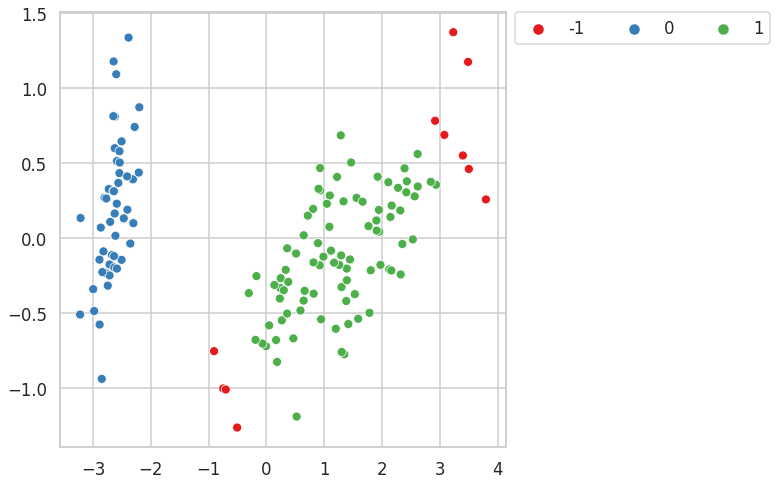

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.08
 1    59.333333
 0    32.666667
-1     8.000000
dtype: float64


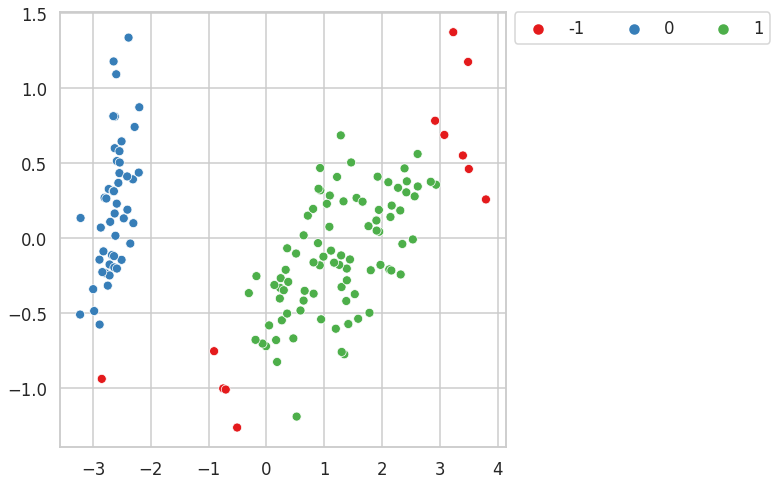

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.08
 1    59.333333
 0    32.666667
-1     8.000000
dtype: float64


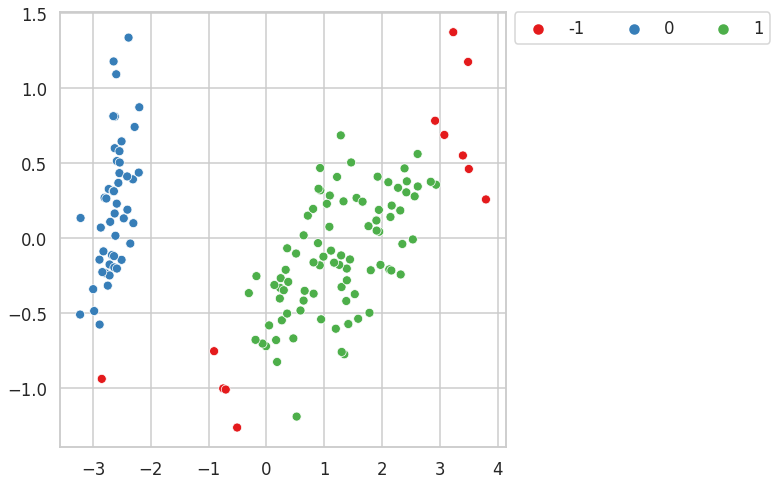

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.08
 1    59.333333
 0    32.666667
-1     8.000000
dtype: float64


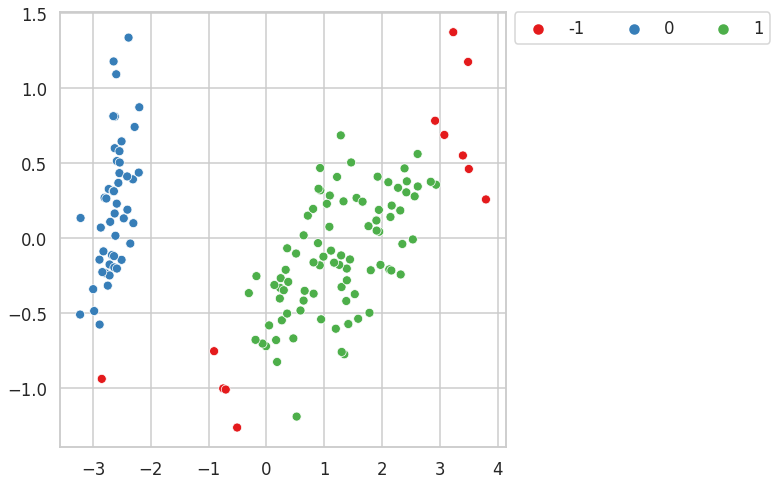

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.08
 1    59.333333
 0    32.666667
-1     8.000000
dtype: float64


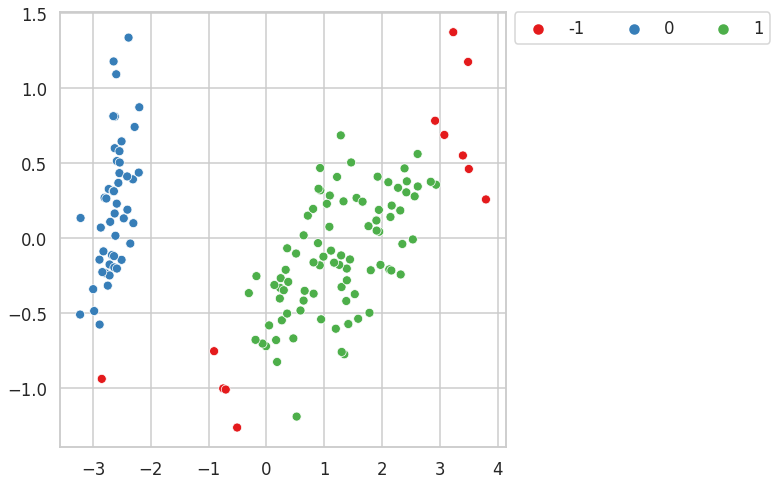

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.08666666666666667
 1    58.666667
 0    32.666667
-1     8.666667
dtype: float64


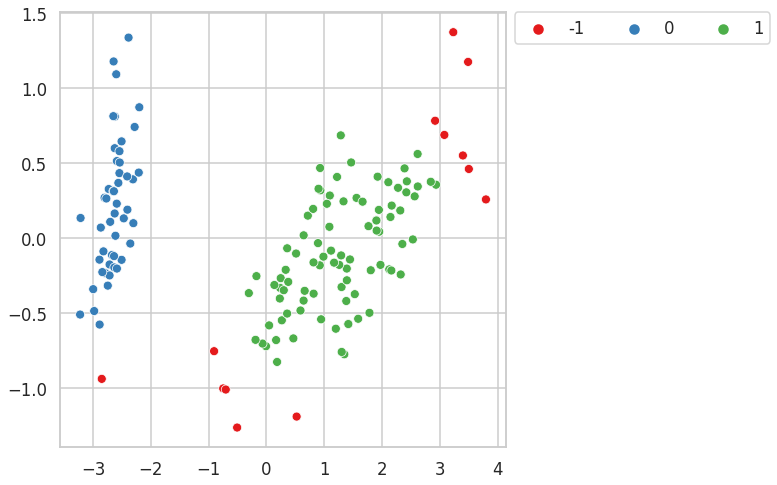

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.08666666666666667
 1    58.666667
 0    32.666667
-1     8.666667
dtype: float64


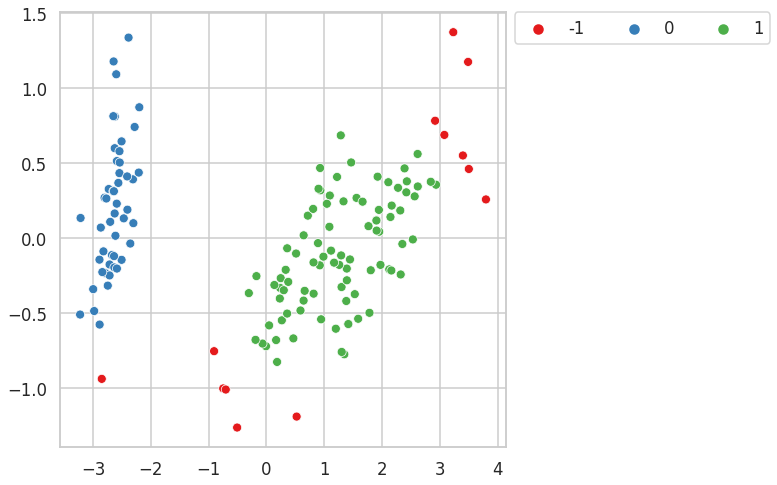

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.1
 1    58.0
 0    32.0
-1    10.0
dtype: float64


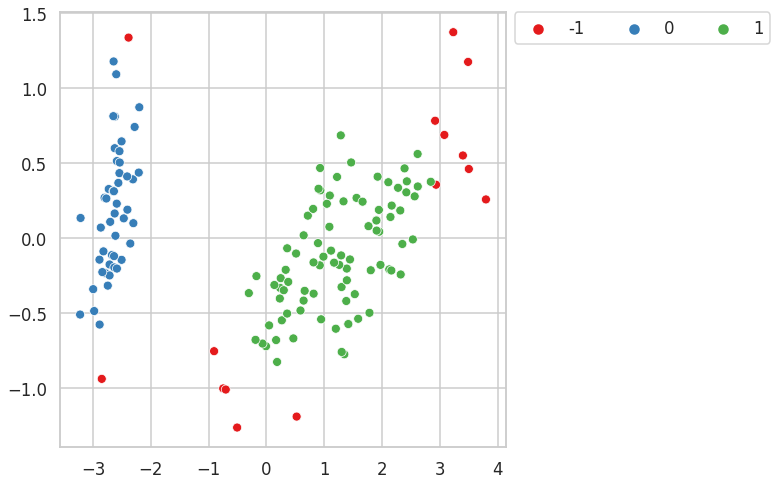

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.70 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


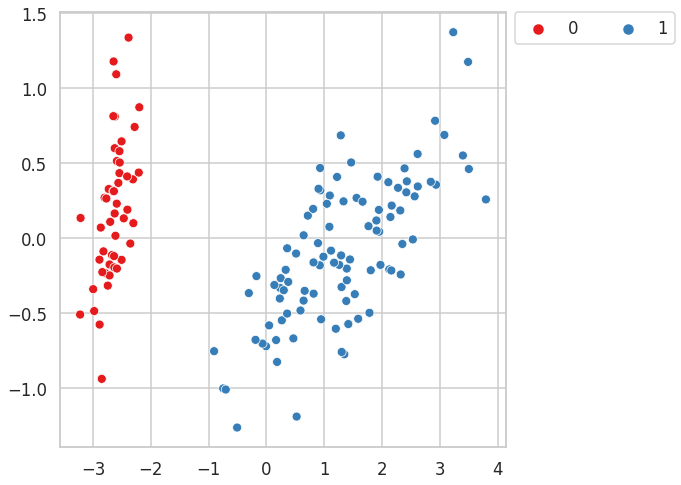

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.46
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


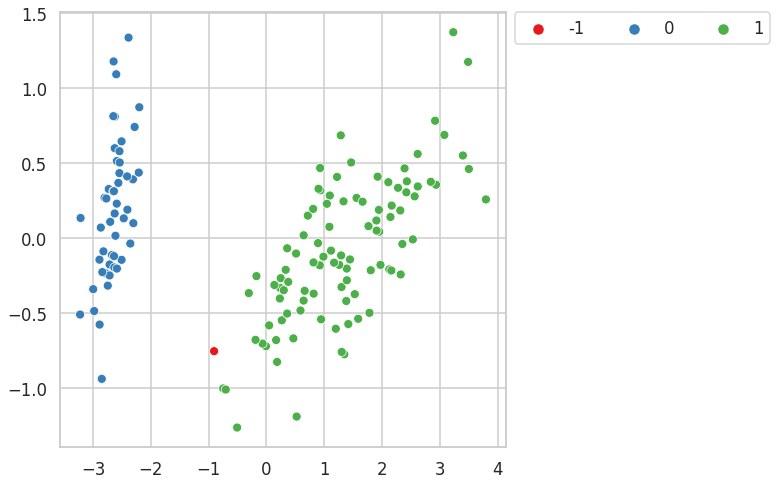

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.46
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


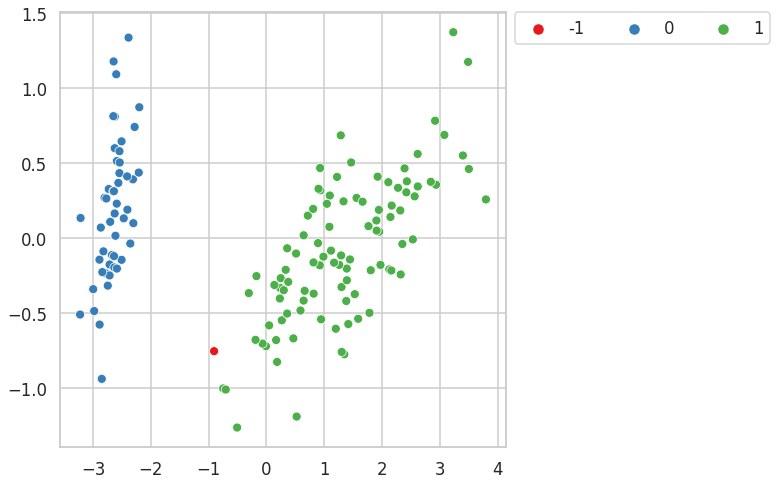

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.46
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


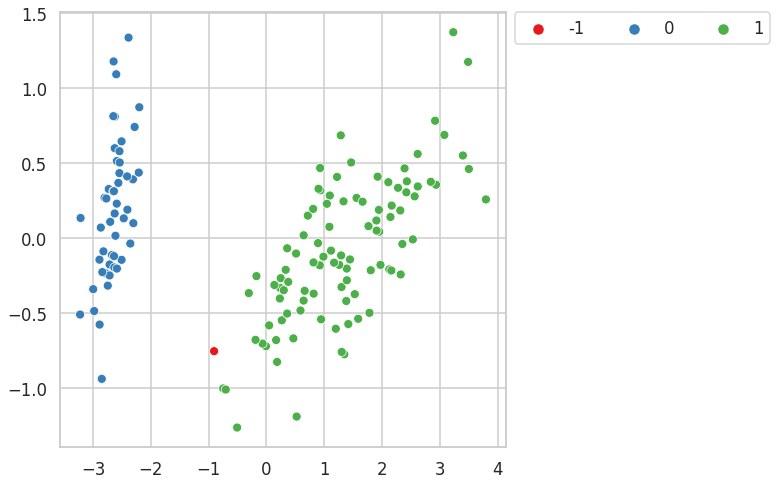

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


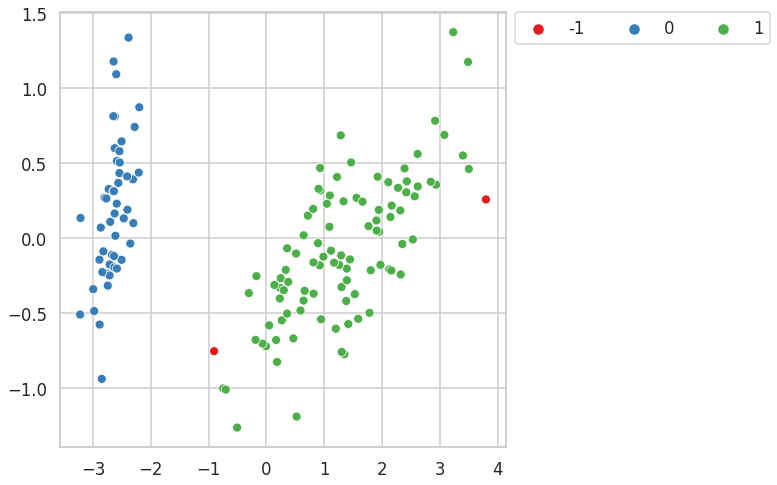

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


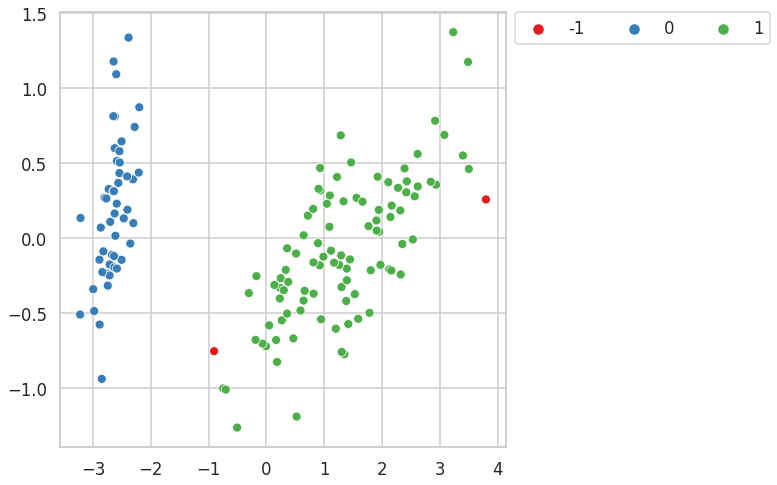

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


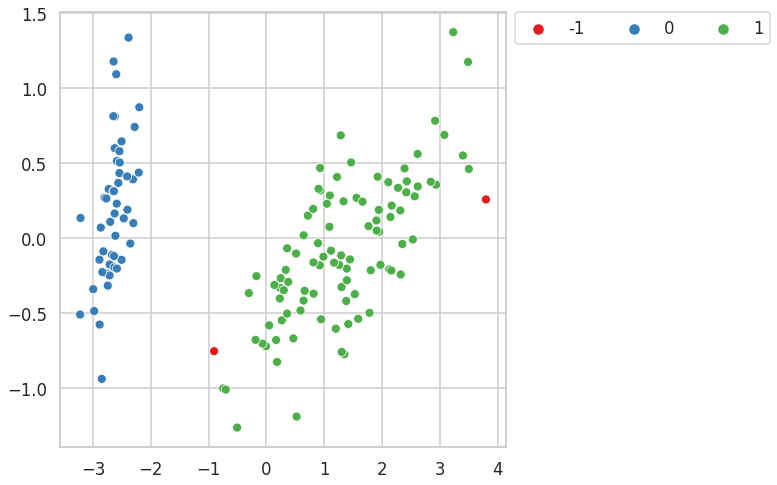

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


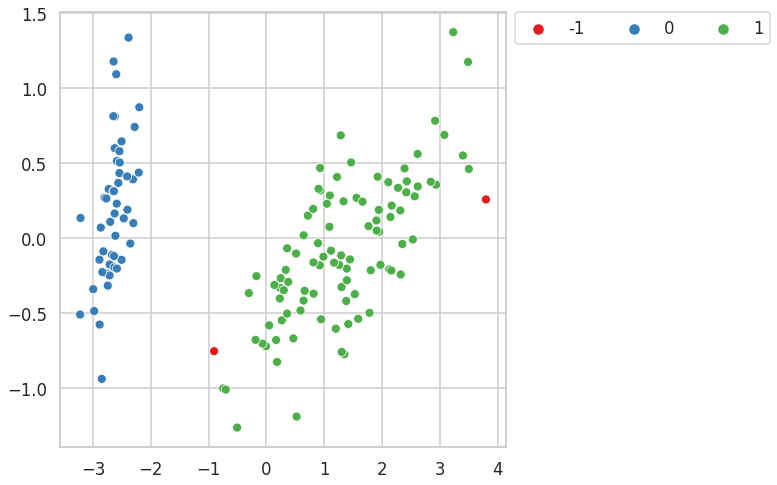

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


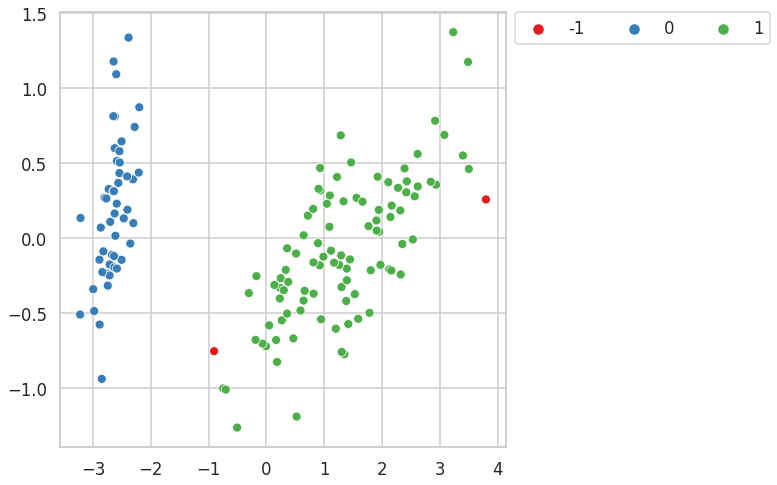

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


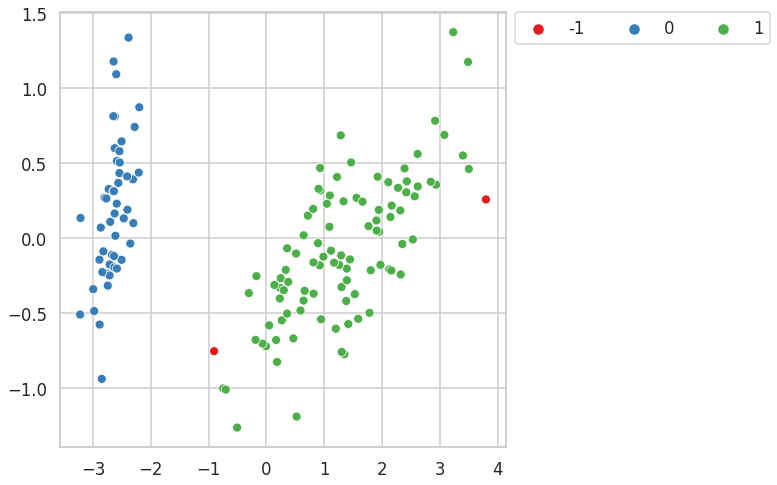

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.02666666666666667
 1    64.000000
 0    33.333333
-1     2.666667
dtype: float64


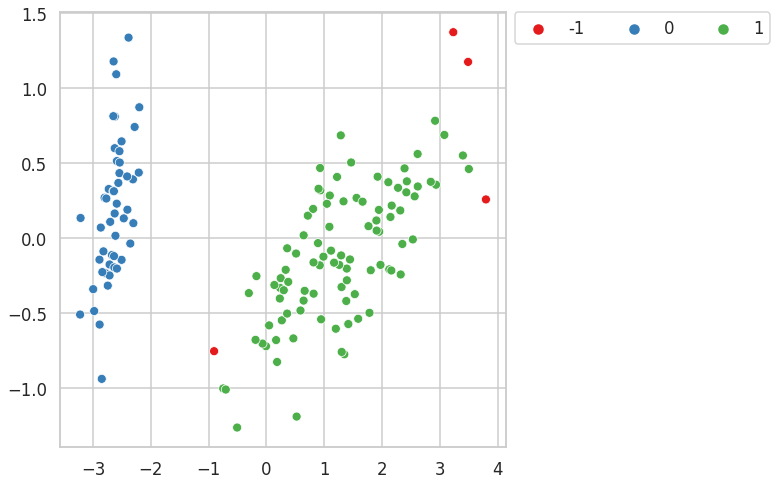

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.02666666666666667
 1    64.000000
 0    33.333333
-1     2.666667
dtype: float64


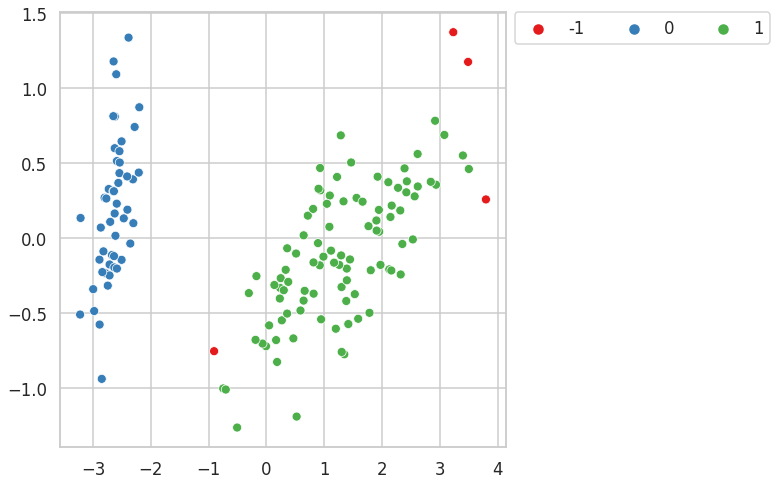

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.02666666666666667
 1    64.000000
 0    33.333333
-1     2.666667
dtype: float64


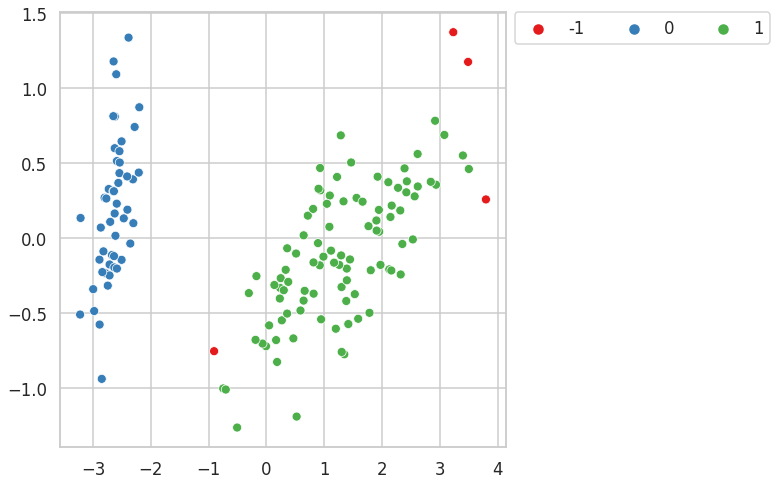

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


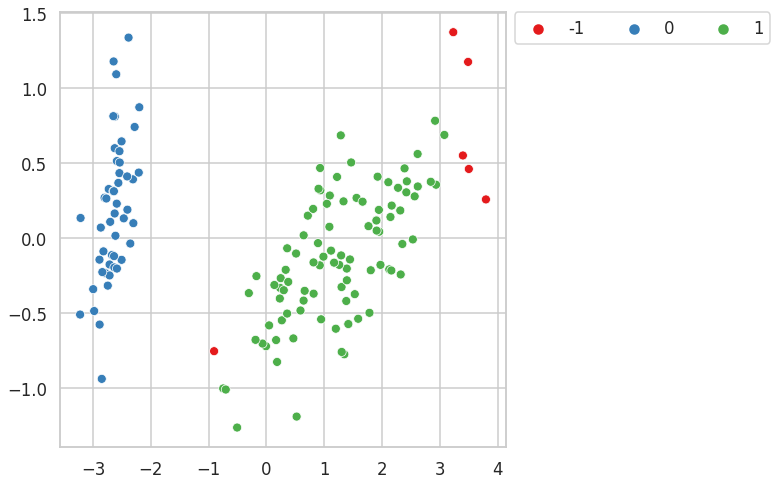

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


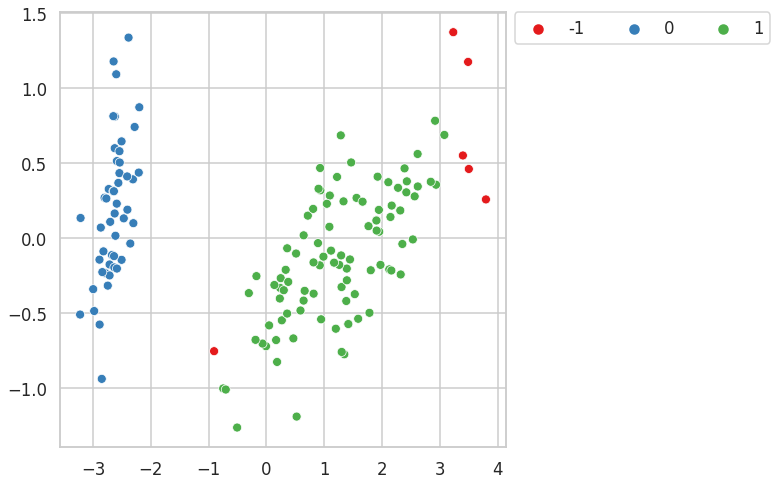

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


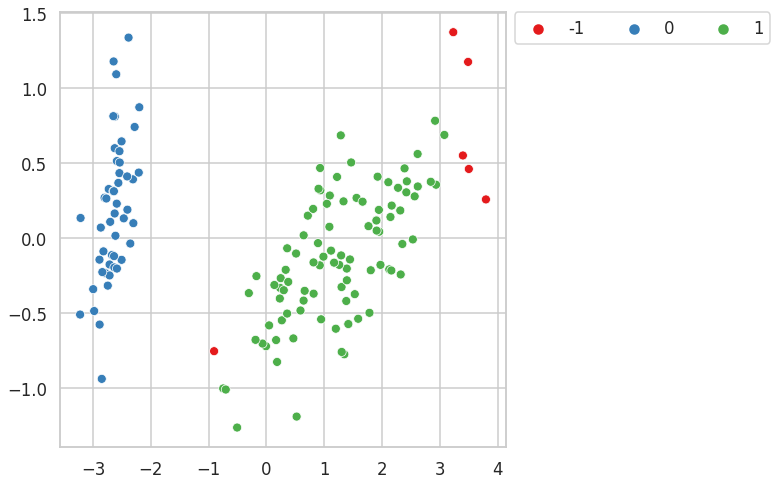

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


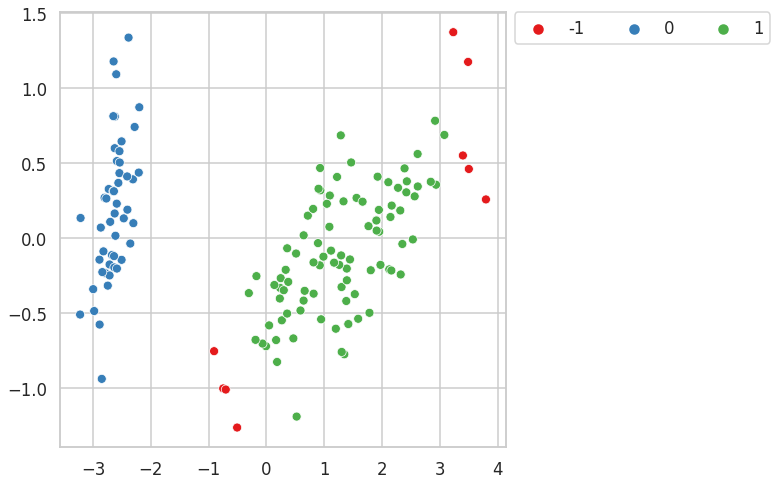

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


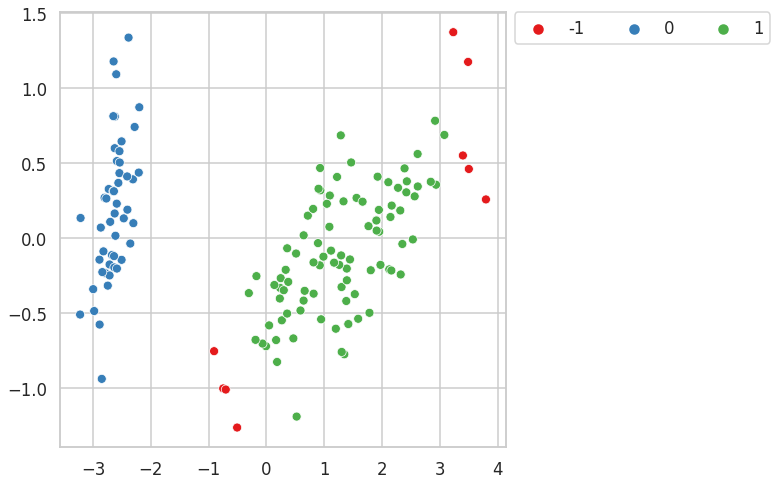

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


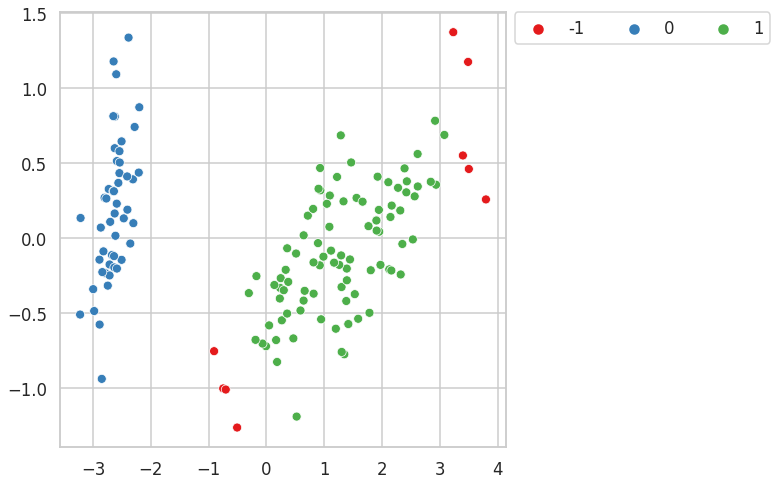

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


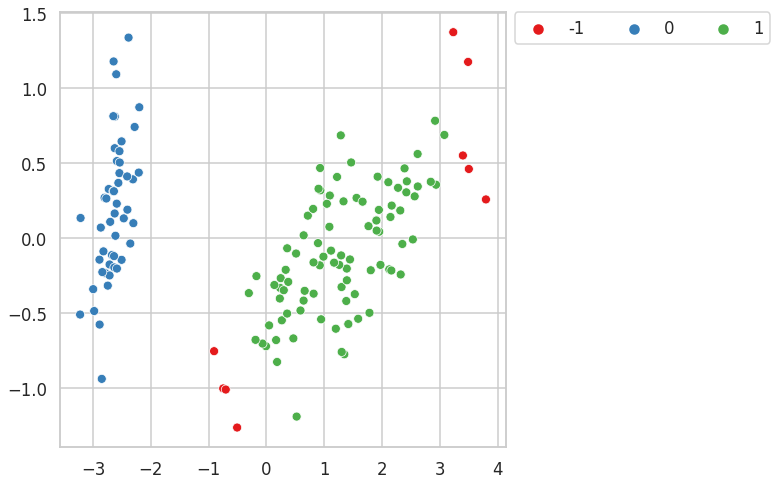

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 0.70 produces 3 clusters with silhouette score : 0.58
The Noise percentage is : 0.06
 1    60.666667
 0    33.333333
-1     6.000000
dtype: float64


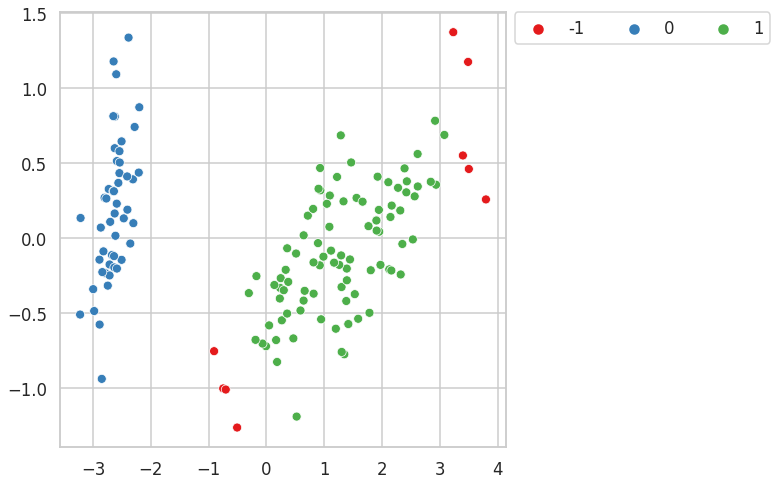

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.80 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


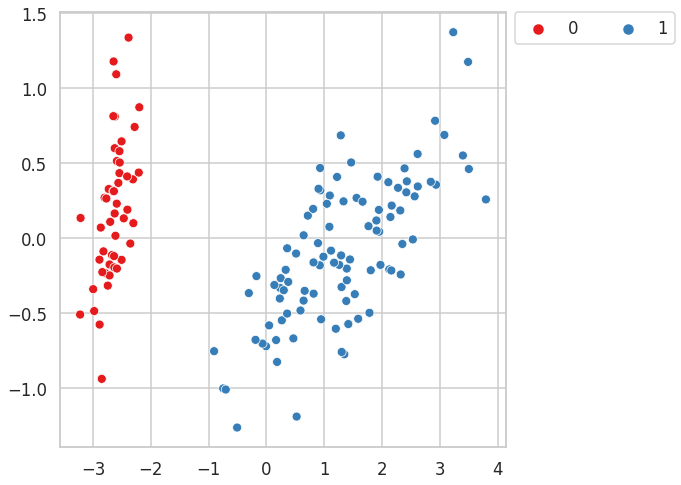

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.80 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


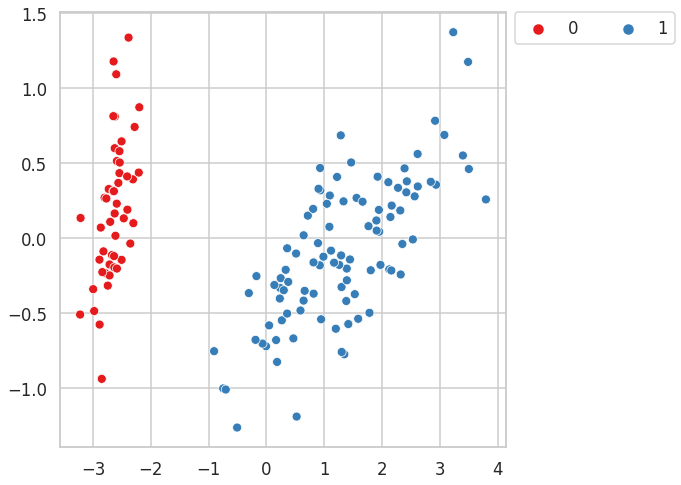

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.80 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


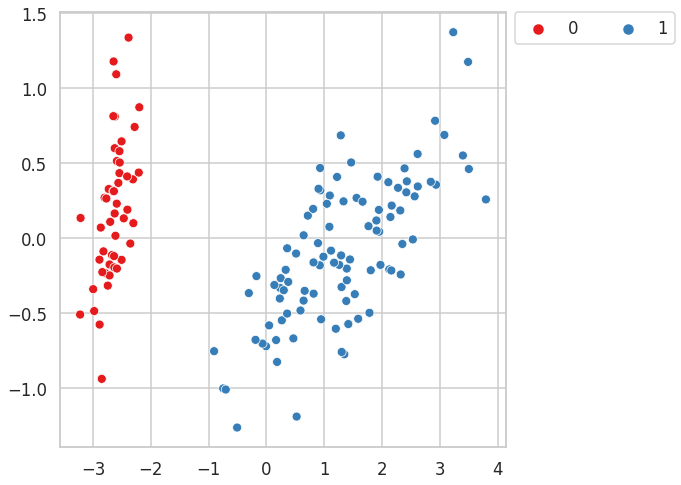

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.80 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


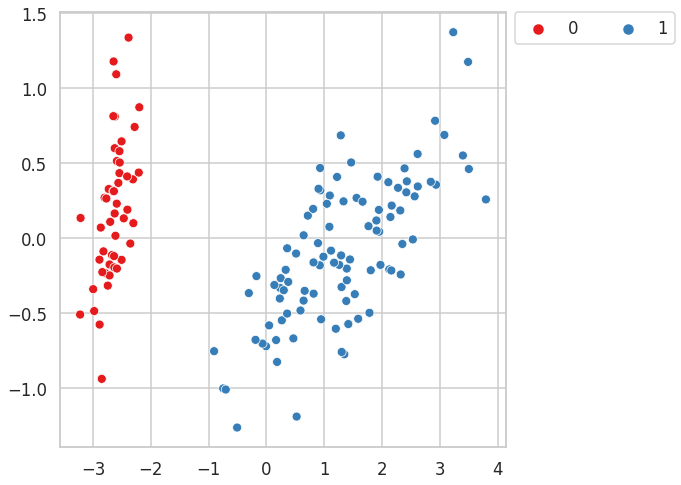

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.80 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


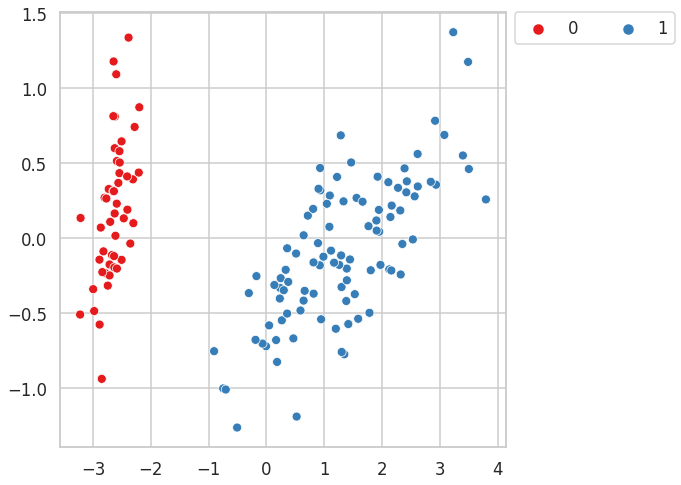

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.52
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


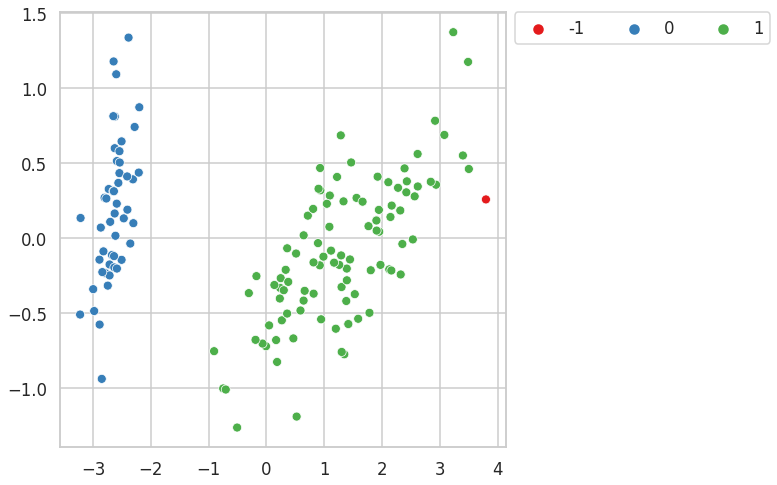

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.52
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


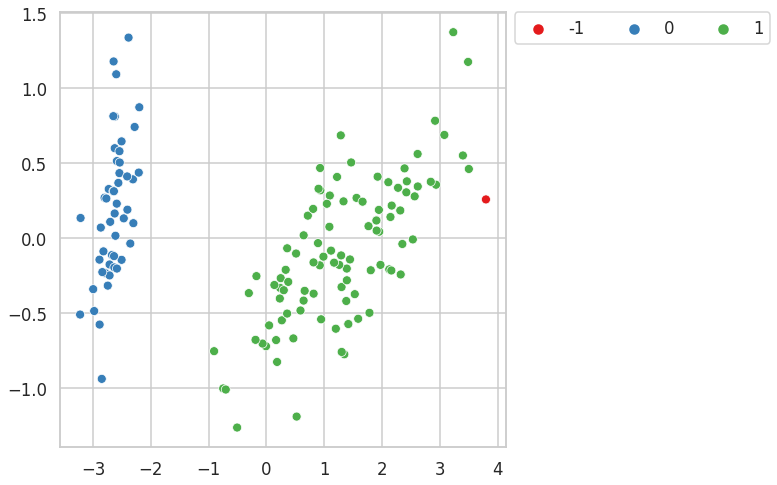

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.52
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


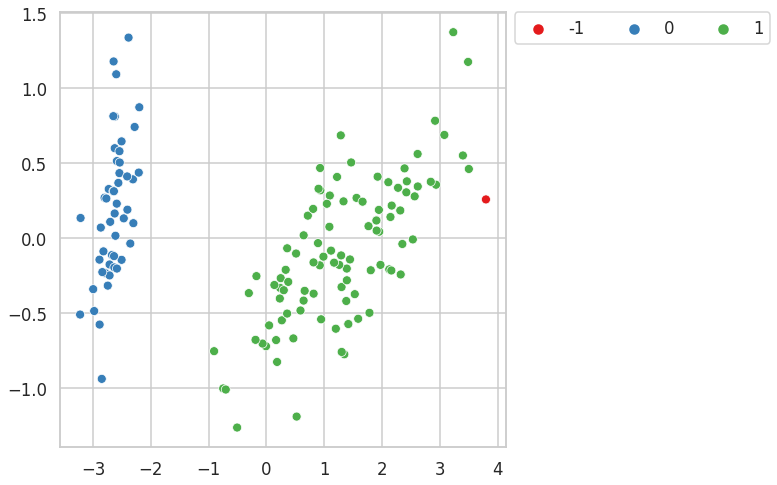

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.52
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


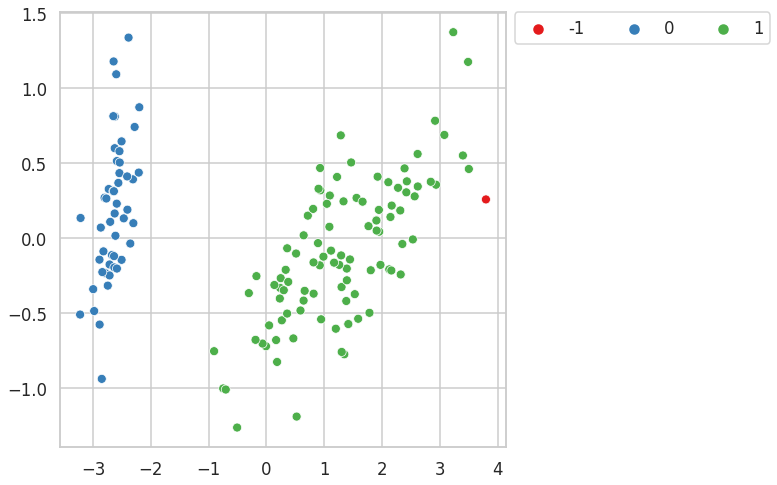

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.52
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


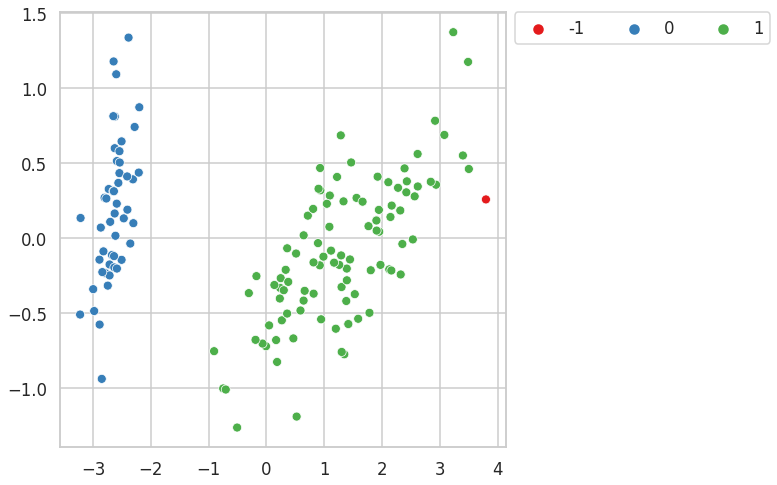

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.52
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


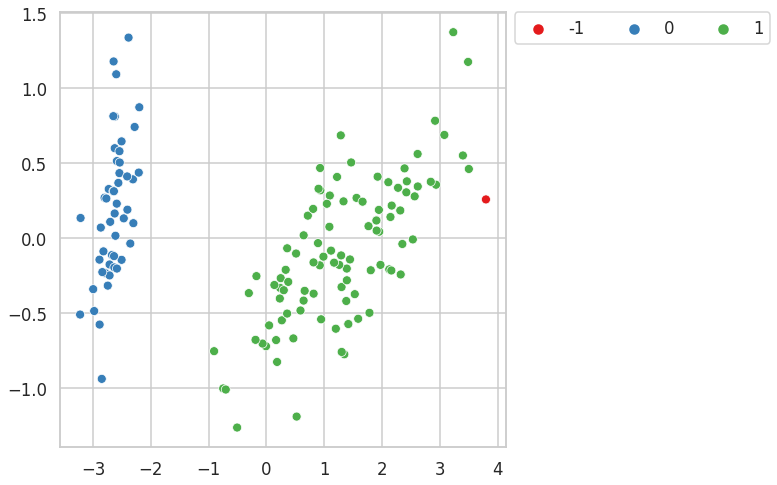

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


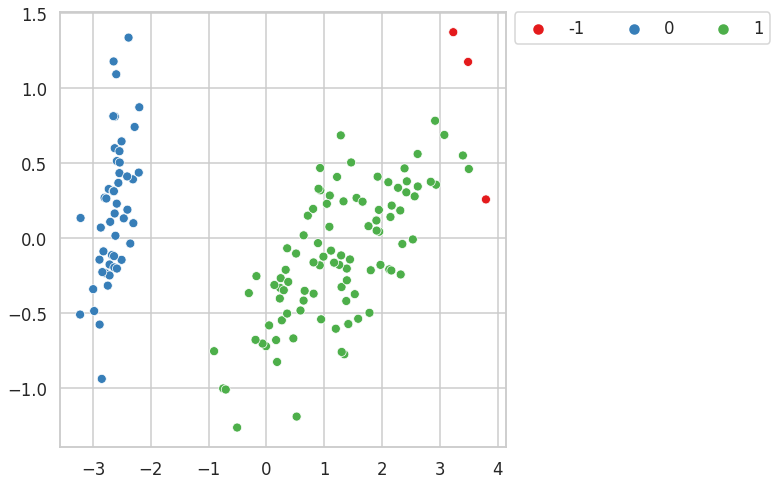

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


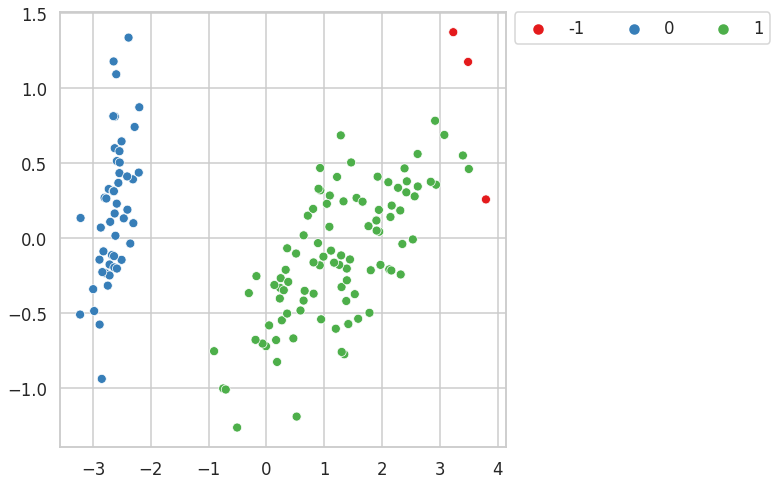

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


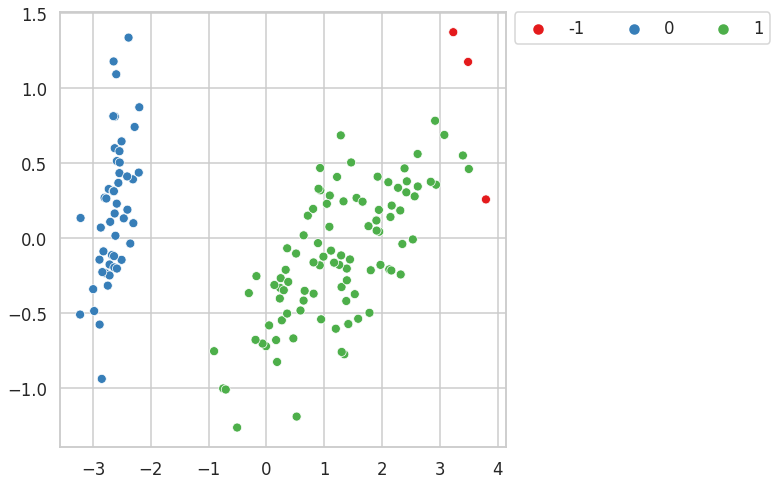

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


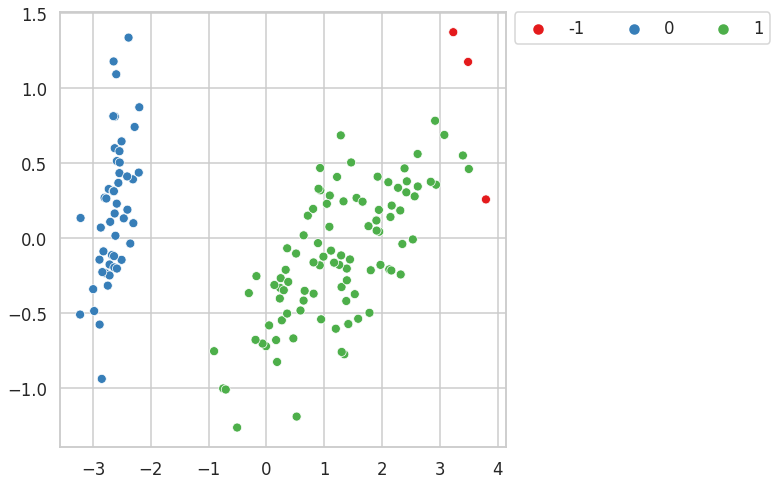

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02666666666666667
 1    64.000000
 0    33.333333
-1     2.666667
dtype: float64


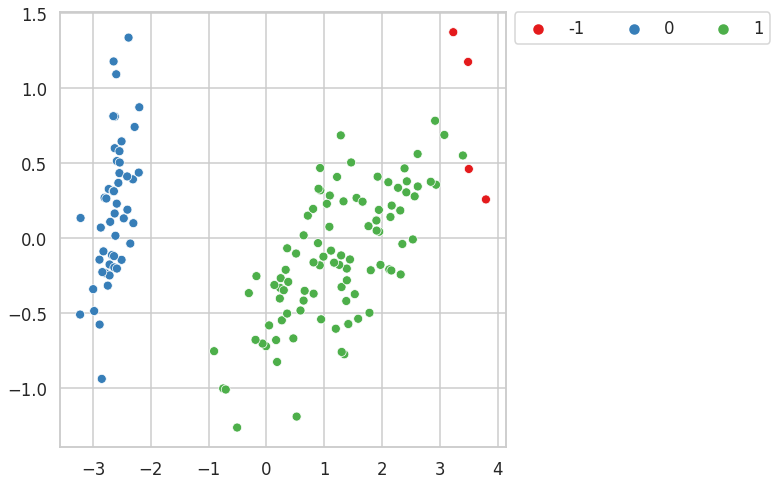

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.03333333333333333
 1    63.333333
 0    33.333333
-1     3.333333
dtype: float64


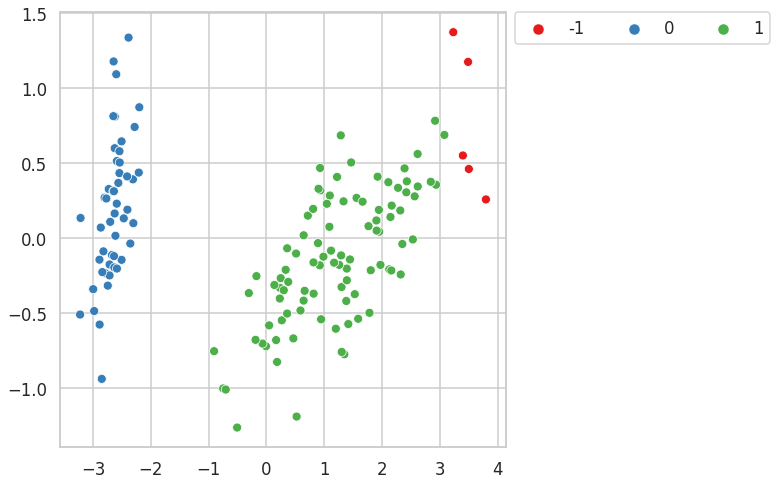

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.56
The Noise percentage is : 0.03333333333333333
 1    63.333333
 0    33.333333
-1     3.333333
dtype: float64


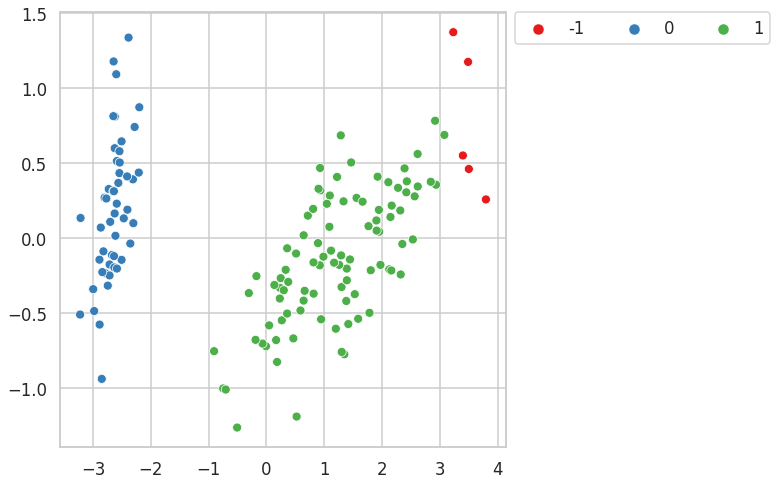

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


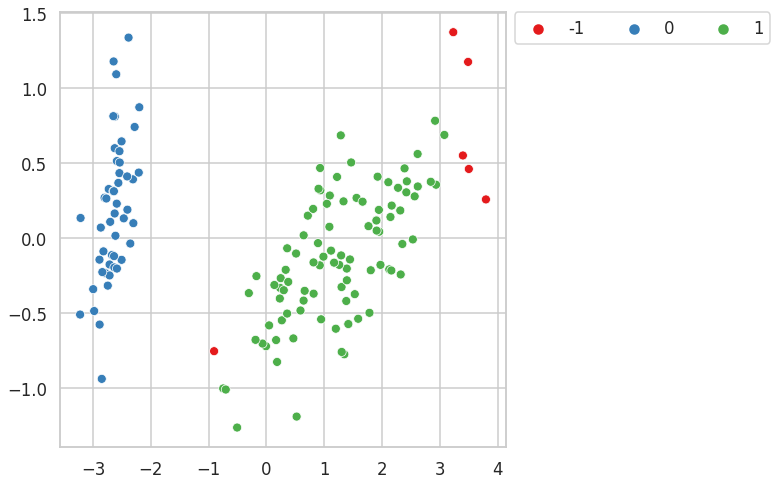

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


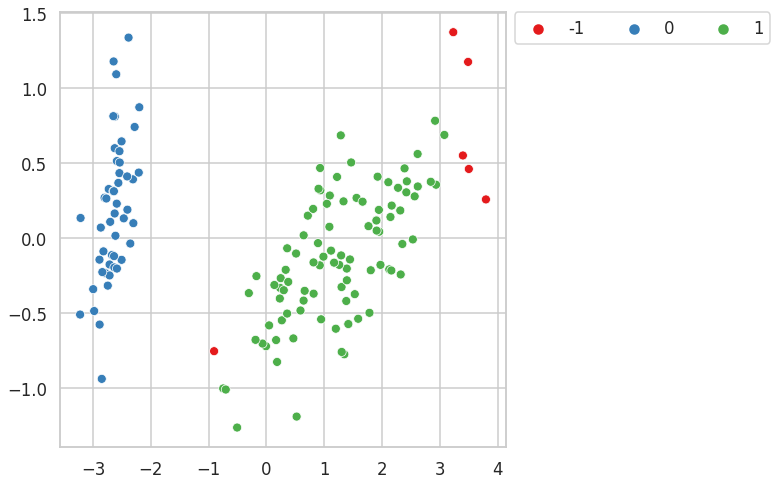

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 0.80 produces 3 clusters with silhouette score : 0.57
The Noise percentage is : 0.04
 1    62.666667
 0    33.333333
-1     4.000000
dtype: float64


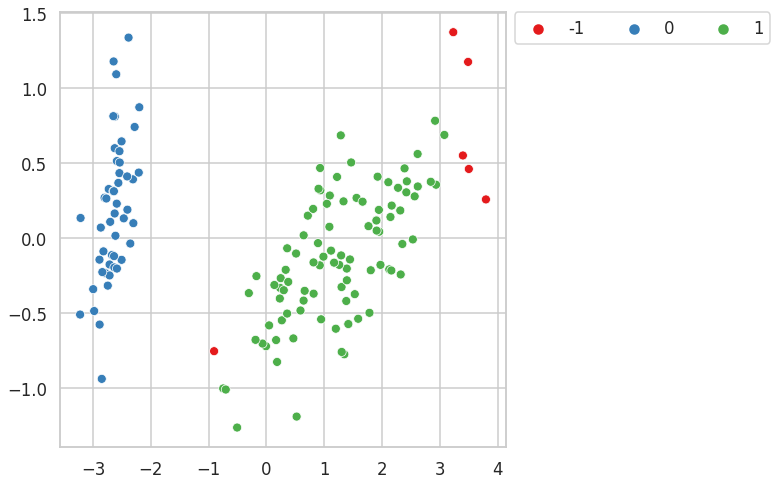

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


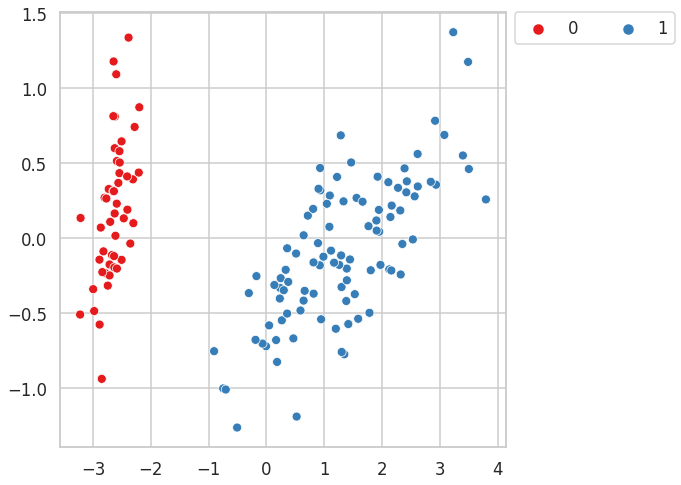

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


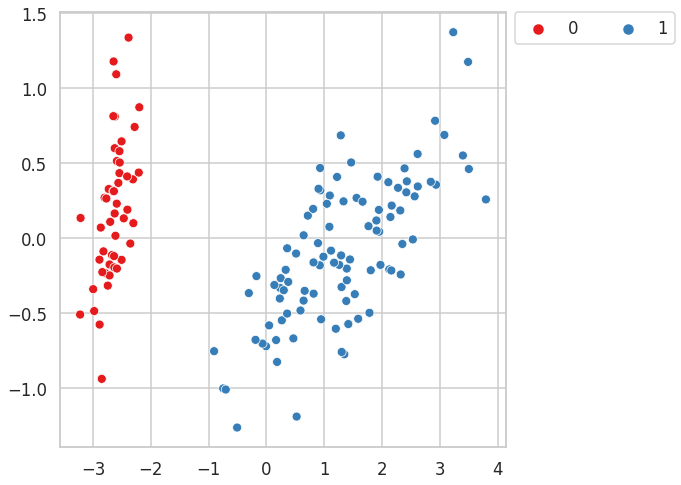

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


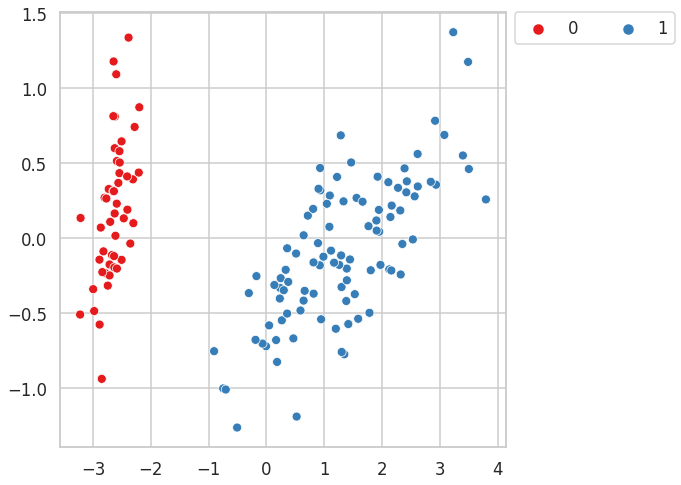

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


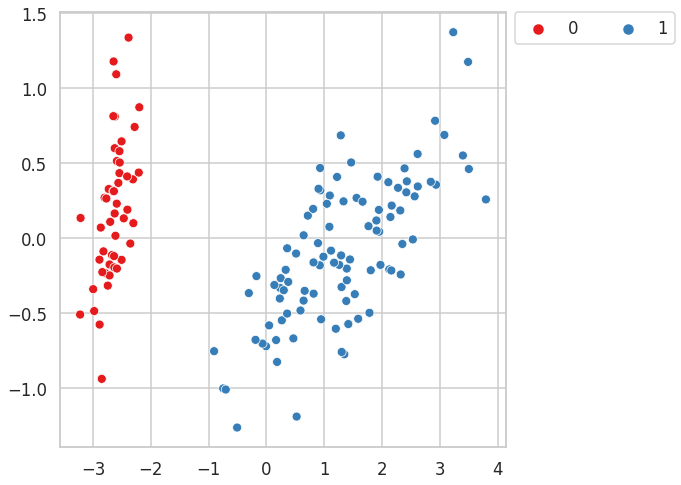

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


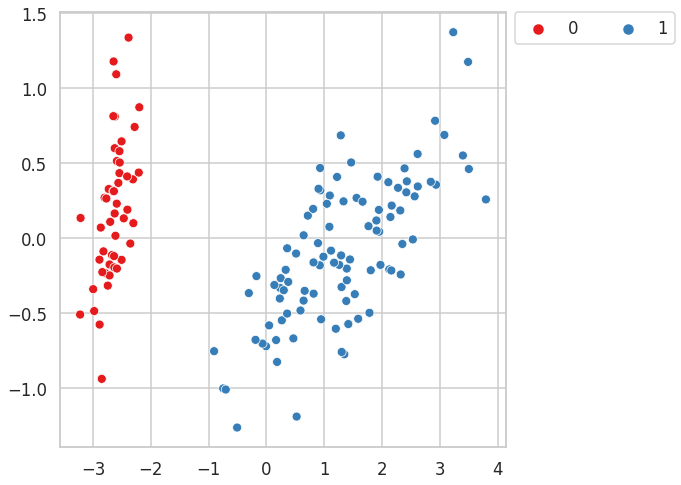

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


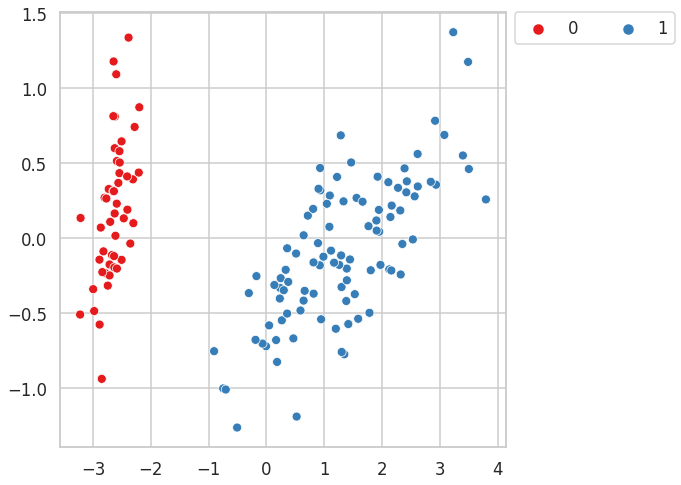

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


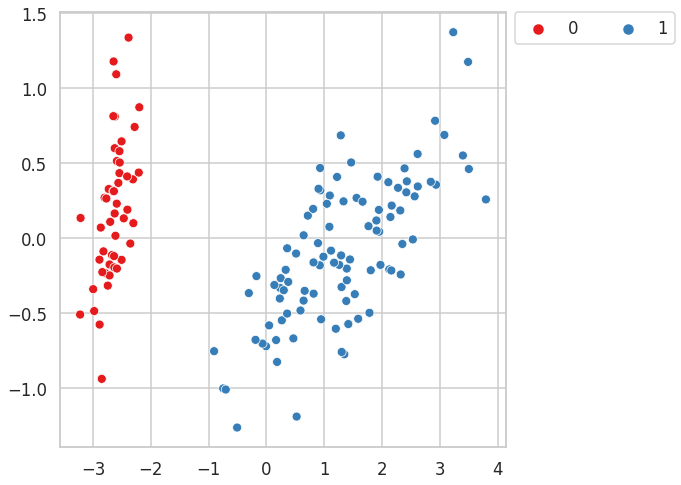

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


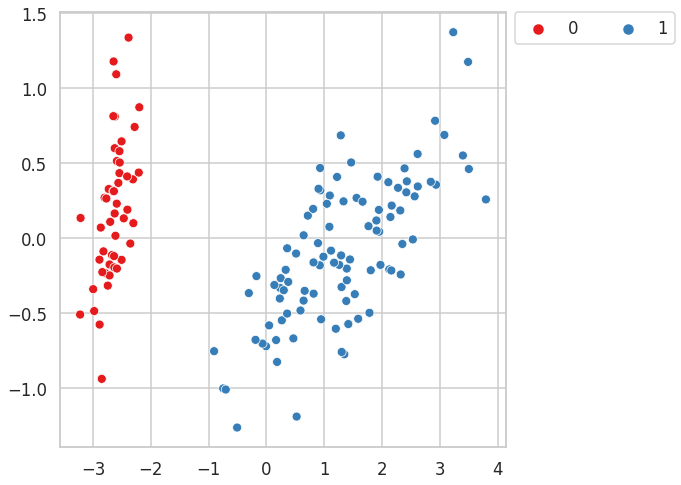

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


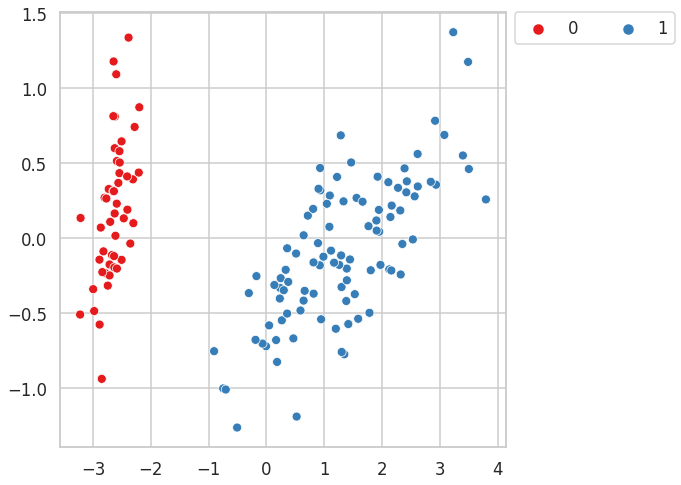

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


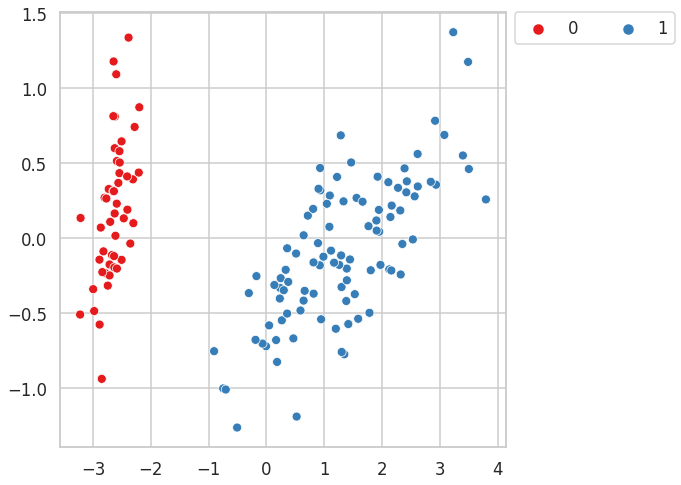

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


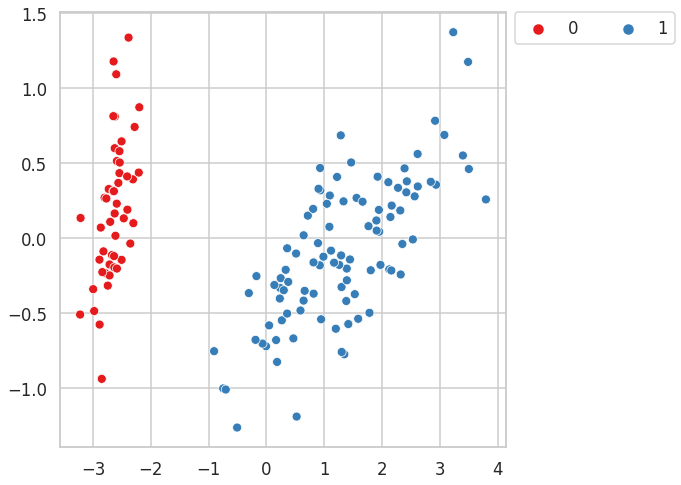

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


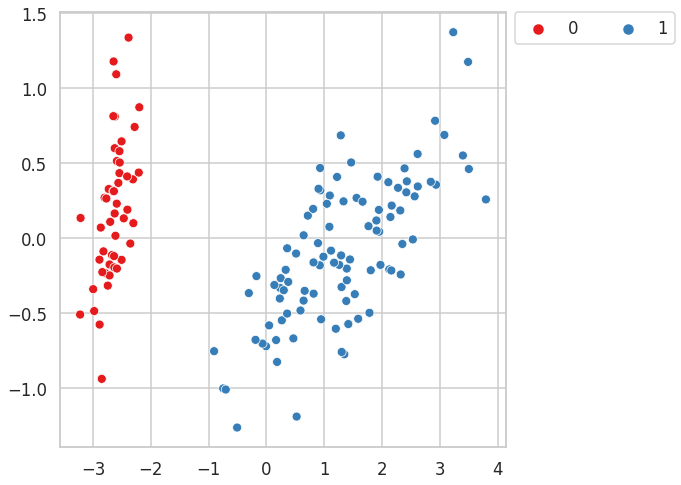

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


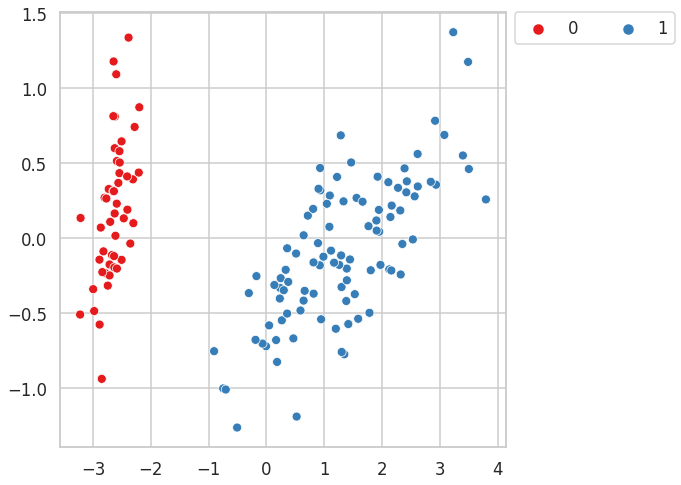

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.54
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


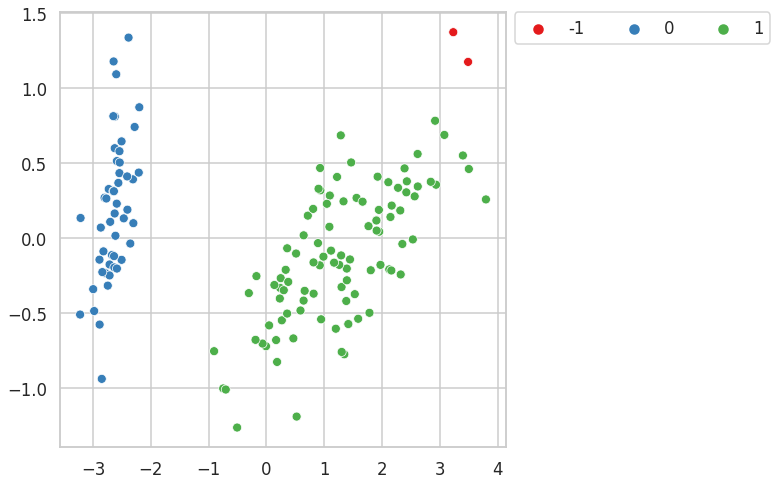

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.54
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


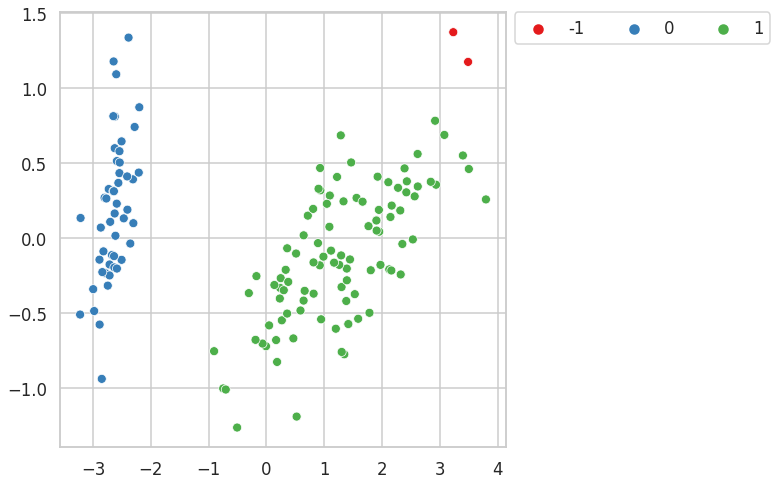

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.54
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


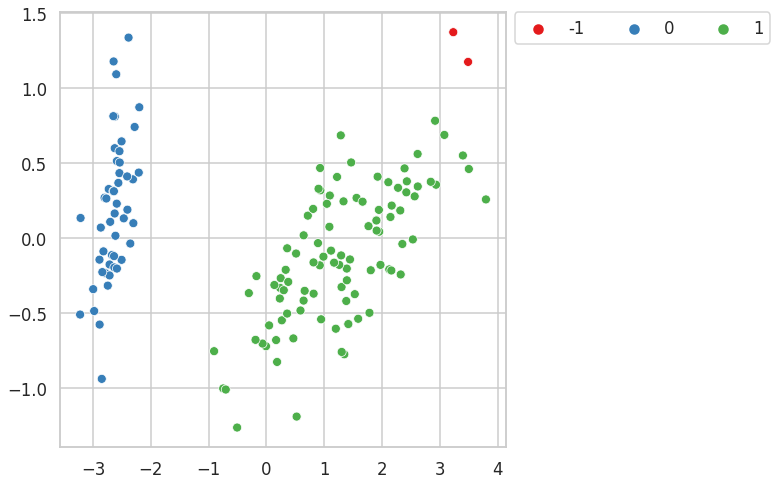

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.54
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


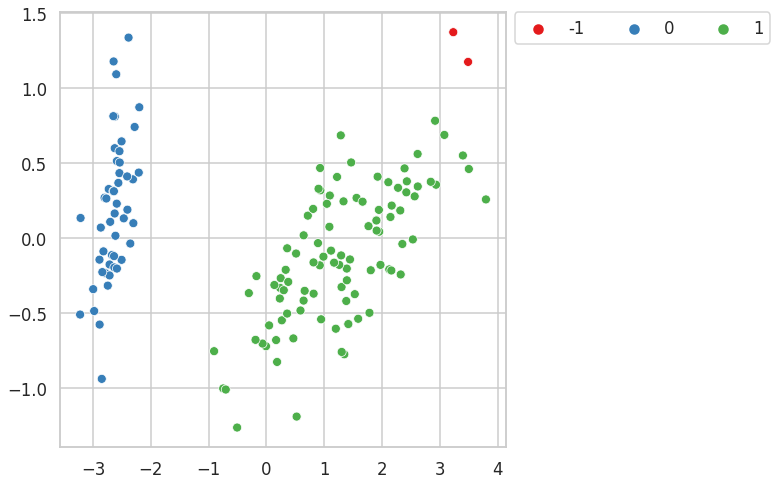

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


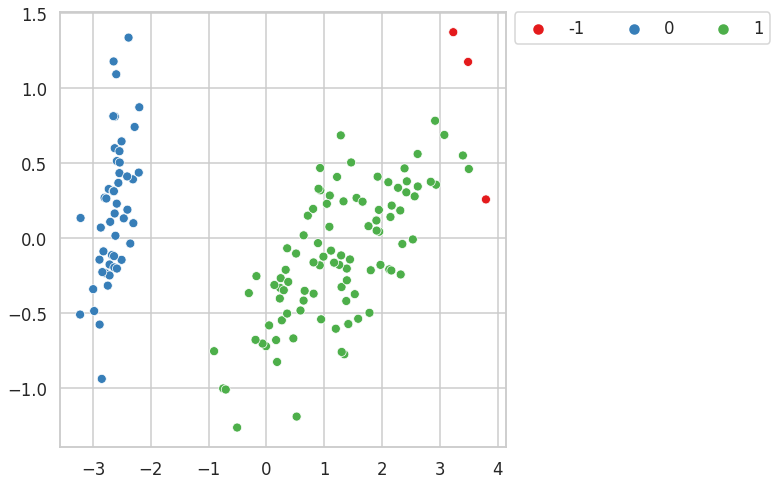

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


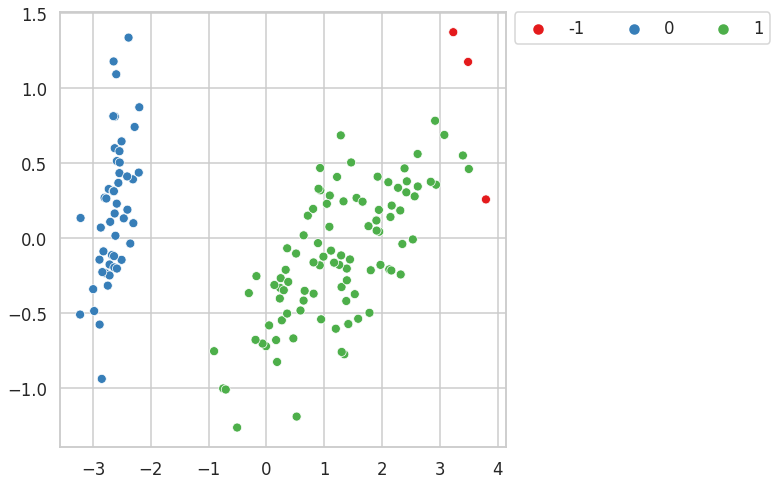

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


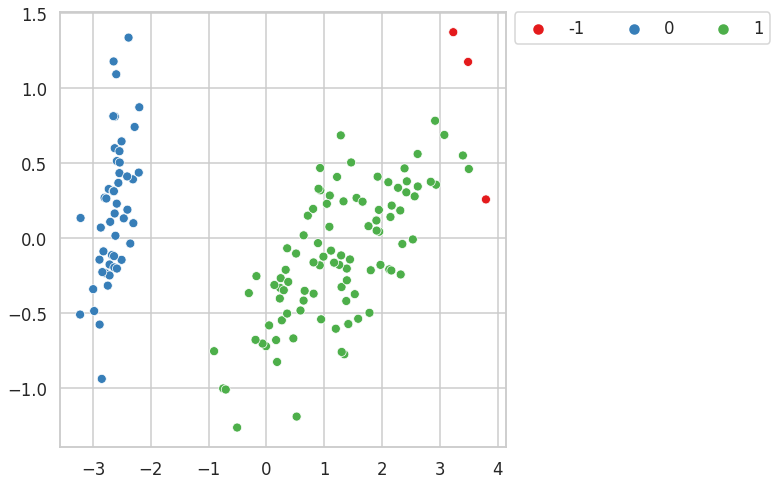

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 0.90 produces 3 clusters with silhouette score : 0.55
The Noise percentage is : 0.02
 1    64.666667
 0    33.333333
-1     2.000000
dtype: float64


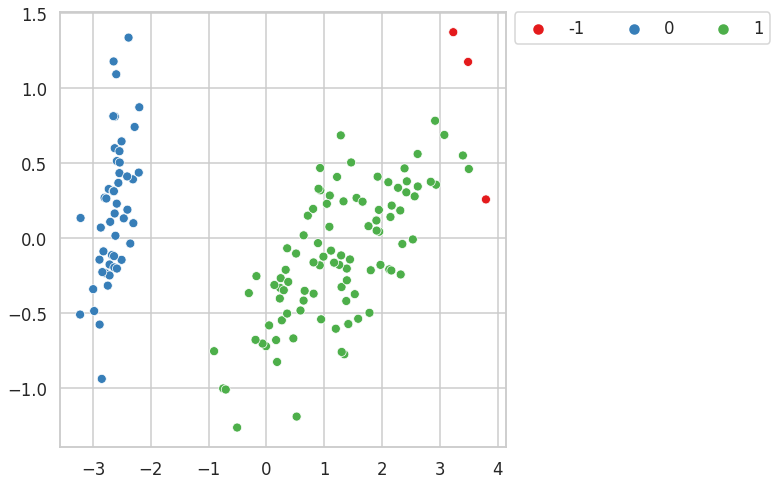

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 5.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


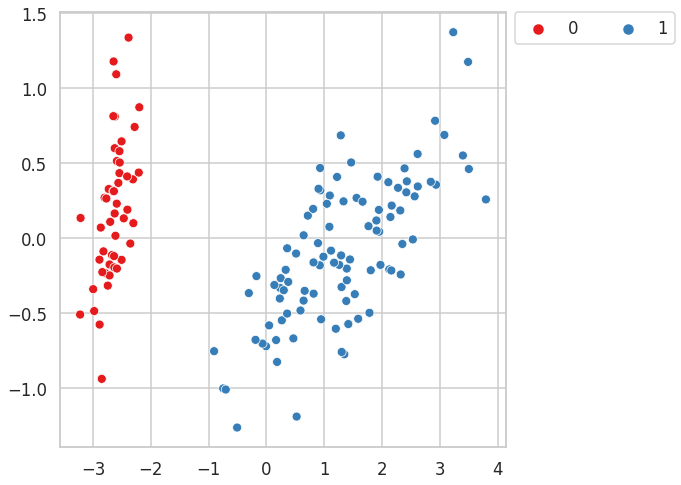

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


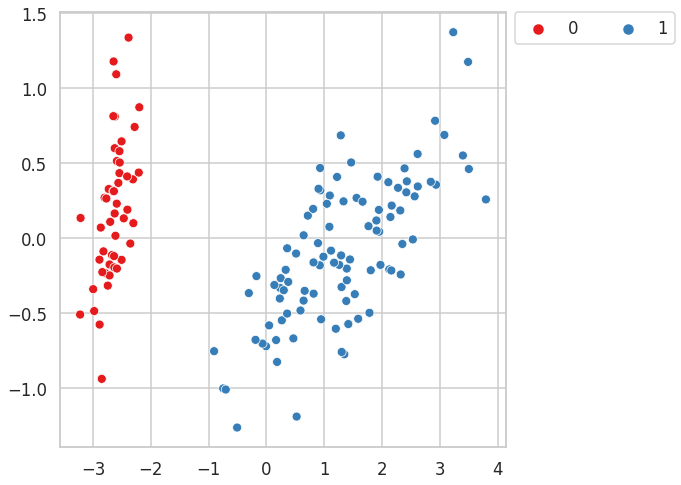

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


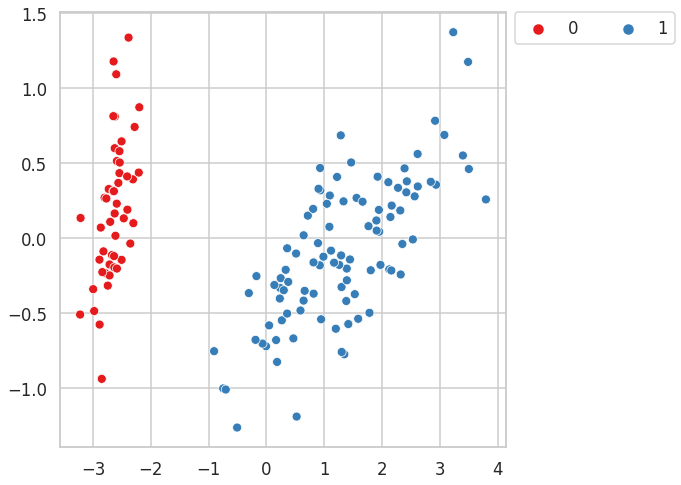

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 8.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


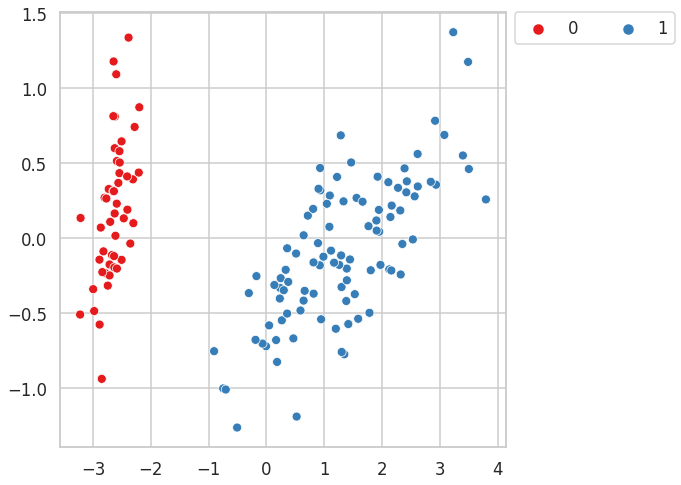

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 9.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


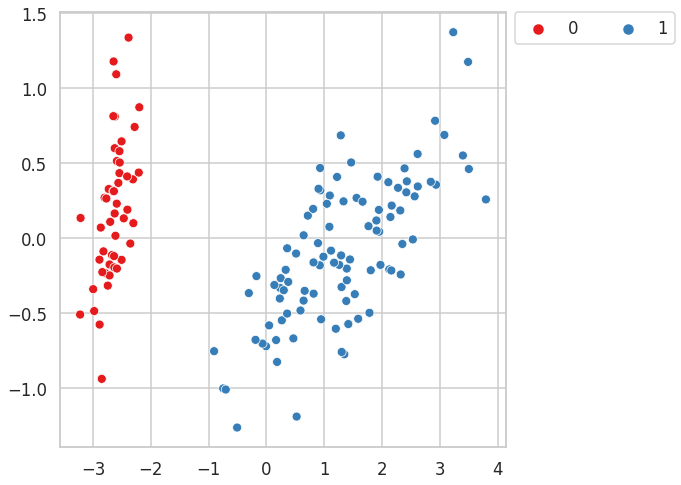

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 10.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


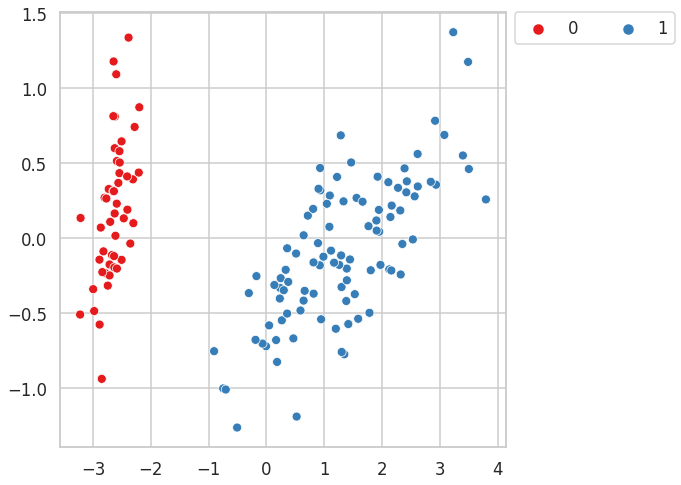

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 11.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


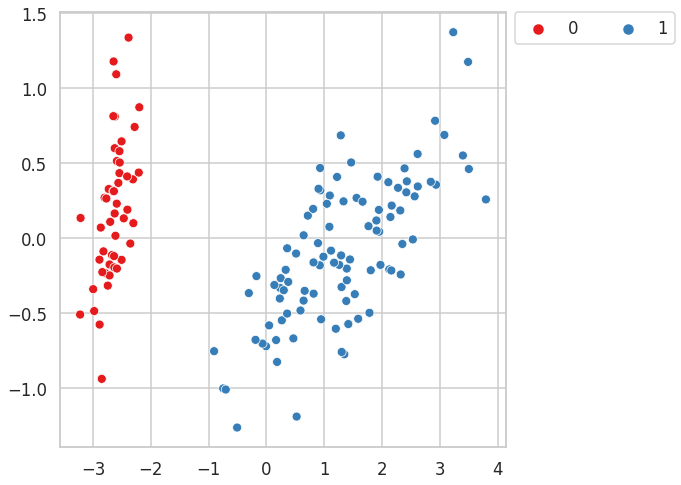

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 12.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


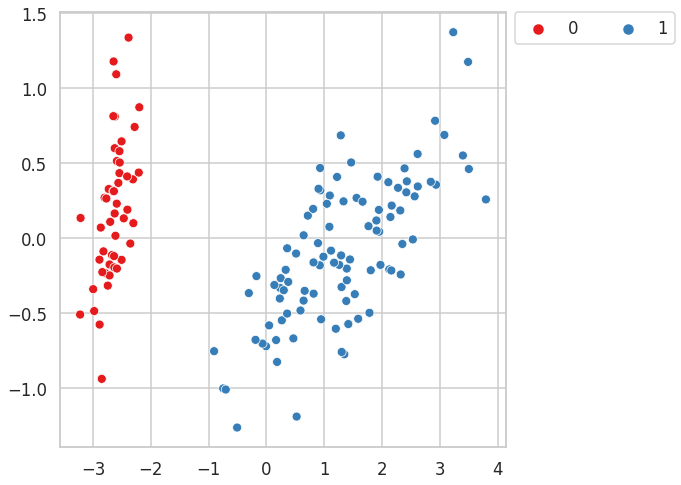

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 13.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


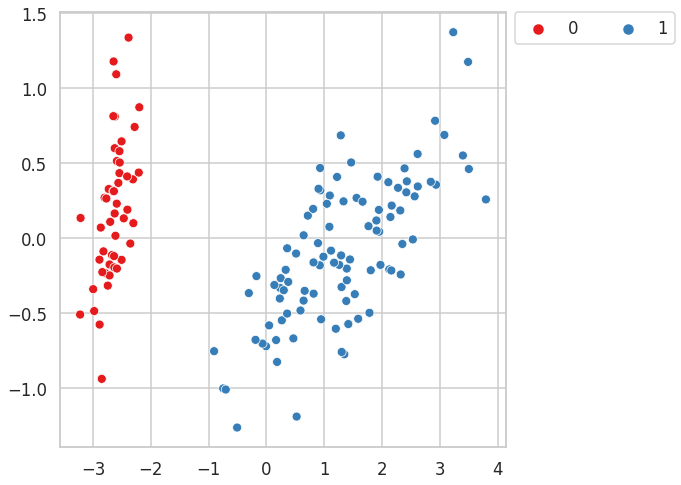

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 14.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


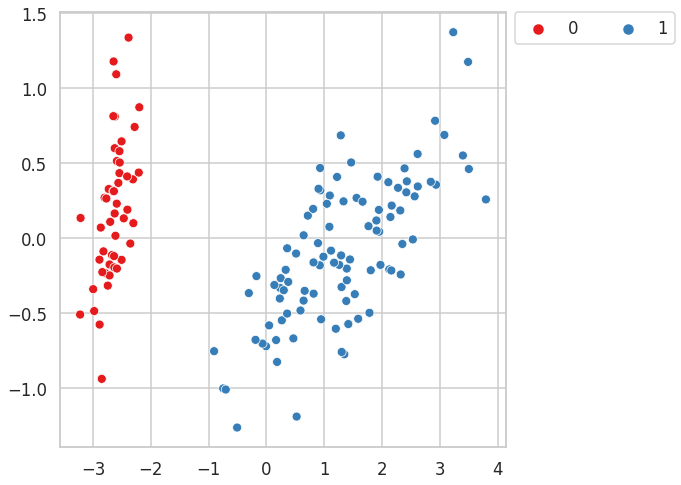

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 15.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


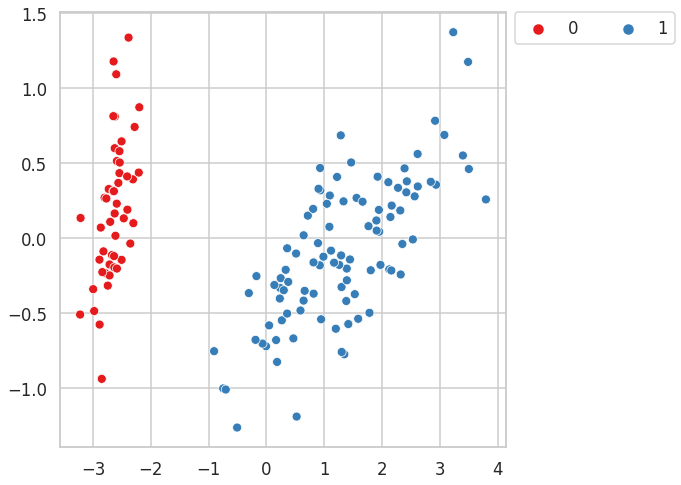

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 16.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


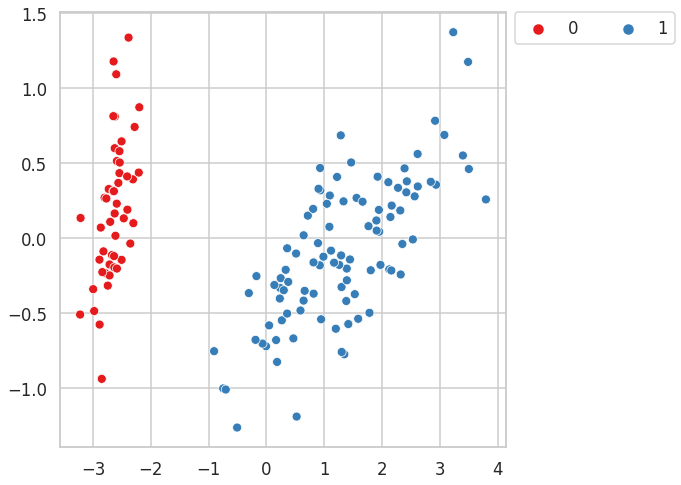

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 17.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


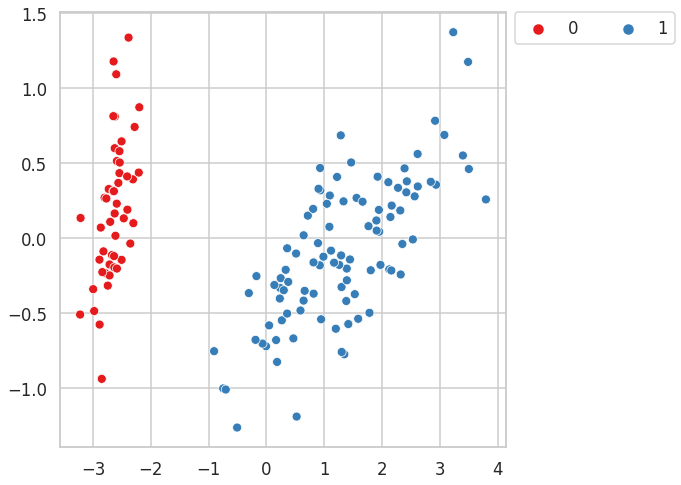

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 18.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


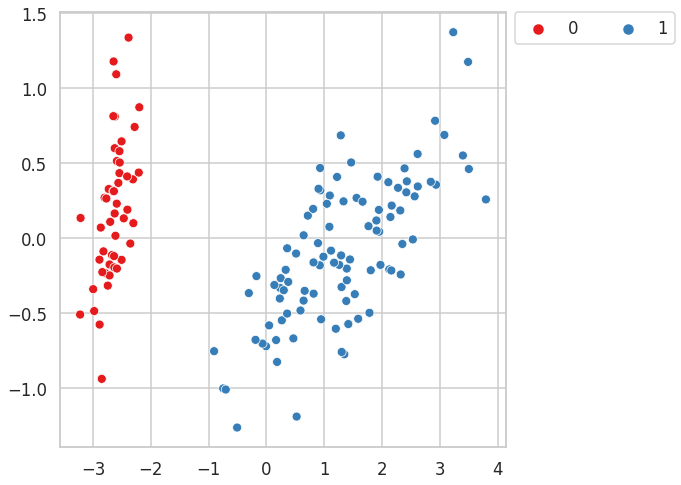

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 19.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


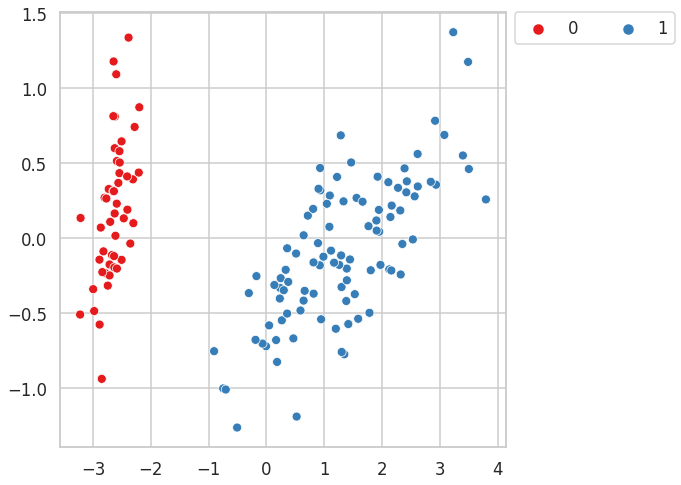

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 20.00, and epsilon: 1.00 produces 2 clusters with silhouette score : 0.71
The Noise percentage is : 0
1    66.666667
0    33.333333
dtype: float64


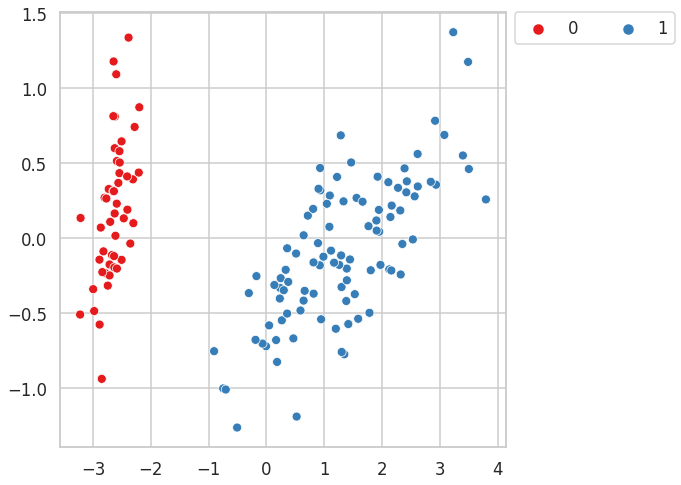

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 21.00, and epsilon: 1.00 produces 3 clusters with silhouette score : 0.51
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


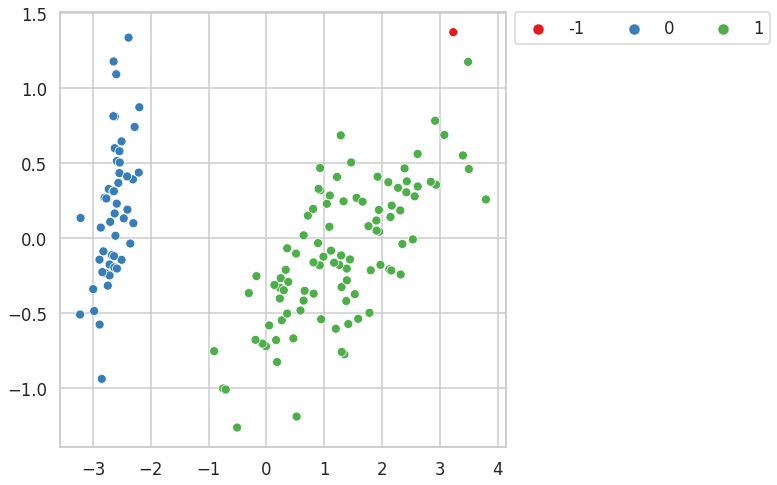

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 22.00, and epsilon: 1.00 produces 3 clusters with silhouette score : 0.51
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


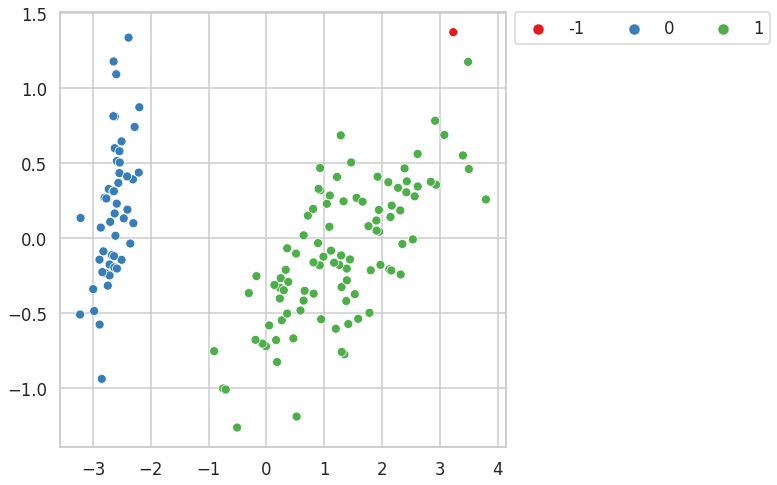

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 23.00, and epsilon: 1.00 produces 3 clusters with silhouette score : 0.51
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


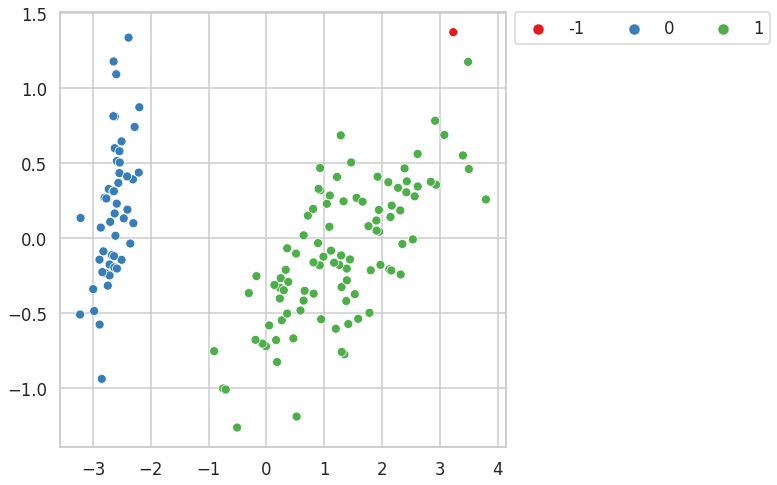

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 24.00, and epsilon: 1.00 produces 3 clusters with silhouette score : 0.51
The Noise percentage is : 0.006666666666666667
 1    66.000000
 0    33.333333
-1     0.666667
dtype: float64


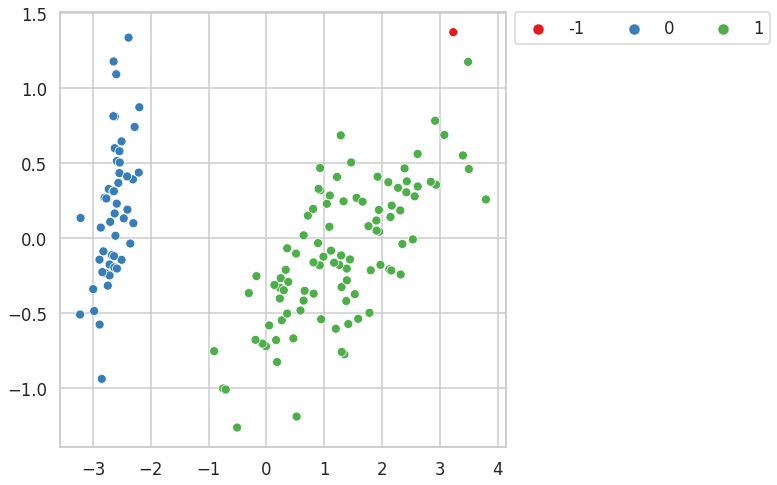

-----------------------------------------------------------------------------------------------------
Minimum number of samples : 25.00, and epsilon: 1.00 produces 3 clusters with silhouette score : 0.54
The Noise percentage is : 0.013333333333333334
 1    65.333333
 0    33.333333
-1     1.333333
dtype: float64


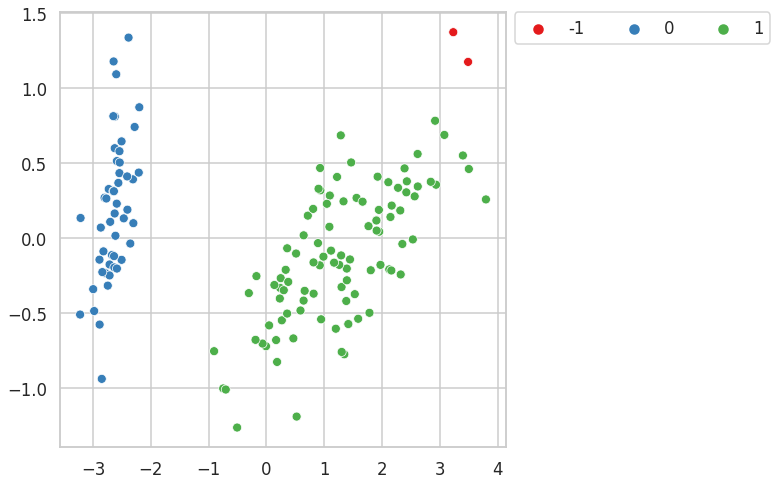

-----------------------------------------------------------------------------------------------------


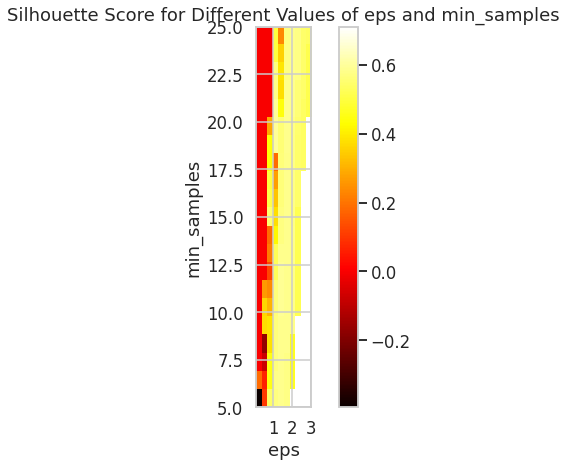


Best Silhouette Score: 0.71
Best Parameters: {'min_samples': 5, 'eps': 0.7000000000000001, 'n_clusters': 2}


(0.711235373323721,
 {'min_samples': 5, 'eps': 0.7000000000000001, 'n_clusters': 2})

In [81]:
DBScan(data_2d.values,min_eps = 0.1, max_eps = 1, min_samples = 5, max_samples = 25)
# Minimum number of samples : 6.00, and epsilon: 0.90 produces 2 clusters with silhouette score : 0.71
# The Noise percentage is : 0
# 1    66.666667
# 0    33.333333

# How ever we may assume that we have noise from the plot and cluster them into separate cluster as a noise as they are a way from the data  

# Minimum number of samples : 23.00, and epsilon: 0.60 produces 3 clusters with silhouette score : 0.57
# The Noise percentage is : 0.08666666666666667
#  1    58.666667
#  0    32.666667
# -1     8.666667

## Customer dataset
Repeat all the above on the customer data set 

In [82]:
df_Customer = pd.read_csv("/content/Customer data.csv",index_col = "ID")

In [83]:
df_Customer.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
ID,,,,,,,
100000001,0,0,67,2,124670,1,2
100000002,1,1,22,1,150773,1,2
100000003,0,0,49,1,89210,0,0
100000004,0,0,45,1,171565,1,1
100000005,0,0,53,1,149031,1,1


In [84]:
df_Customer.describe()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
count,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000
mean,0.457000,0.496500,35.909000,1.03800,120954.419000,0.810500,0.739000
std,0.498272,0.500113,11.719402,0.59978,38108.824679,0.638587,0.812533
min,0.000000,0.000000,18.000000,0.00000,35832.000000,0.000000,0.000000
25%,0.000000,0.000000,27.000000,1.00000,97663.250000,0.000000,0.000000
50%,0.000000,0.000000,33.000000,1.00000,115548.500000,1.000000,1.000000
75%,1.000000,1.000000,42.000000,1.00000,138072.250000,1.000000,1.000000
max,1.000000,1.000000,76.000000,3.00000,309364.000000,2.000000,2.000000


In [85]:
df_Customer.nunique()

Sex                   2
Marital status        2
Age                  58
Education             4
Income             1982
Occupation            3
Settlement size       3
dtype: int64

not all features have the same scale 


In [86]:
scaler = StandardScaler()
# Fit and transform the data using the scaler
scaled_data = scaler.fit_transform(df_Customer)

Minimum number of samples : 5.00, and epsilon: 0.10 produces 40 clusters with silhouette score : -0.33
The Noise percentage is : 0.771
-1    77.10
 0     3.05
 7     2.65
 1     2.35
 8     1.40
dtype: float64
34    0.25
36    0.25
37    0.25
38    0.25
28    0.20
dtype: float64
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 6.00, and epsilon: 0.10 produces 31 clusters with silhouette score : -0.36
The Noise percentage is : 0.812
-1    81.20
 0     2.95
 7     2.30
 4     1.20
 5     1.20
dtype: float64
11    0.30
8     0.30
1     0.30
27    0.25
29    0.15
dtype: float64
-----------------------------------------------------------------------------------------------------
Minimum number of samples : 7.00, and epsilon: 0.10 produces 23 clusters with silhouette score : -0.36
The Noise percentage is : 0.8695
-1    86.95
 9     1.50
 4     1.20
 1     1.05
 3     0.85
dtype: float64
7     0.35
5     0.35
21 

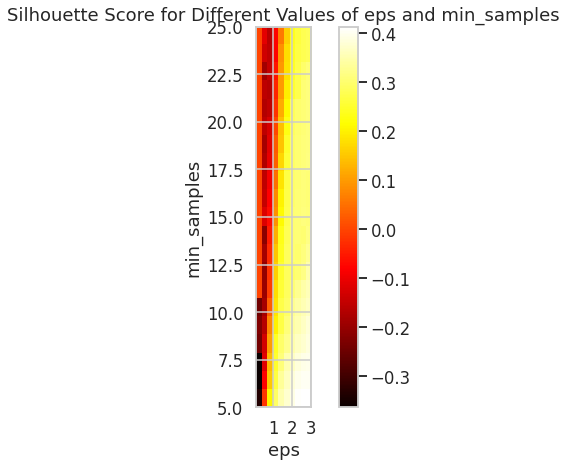


Best Silhouette Score: 0.41
Best Parameters: {'min_samples': 5, 'eps': 0.9, 'n_clusters': 50}


(0.4129108329603727, {'min_samples': 5, 'eps': 0.9, 'n_clusters': 50})

In [87]:
DBScan(scaled_data,min_eps = 0.1, max_eps = 1, min_samples = 5, max_samples = 25)


# Minimum number of samples : 5.00, and epsilon: 1.40 produces 29 clusters with silhouette score : 0.37
# The Noise percentage is : 0.0205
# 1    17.90
# 3    13.40
# 7     9.25
# 8     7.95
# 2     6.25
# dtype: float64
# 21    0.55
# 22    0.45
# 27    0.45
# 18    0.35
# 20    0.25
# dtype: float64

# however there are many clusters 

# Minimum number of samples : 23.00, and epsilon: 2.00 produces 5 clusters with silhouette score : 0.19
# The Noise percentage is : 0.016
#  0    41.05
#  1    36.20
#  2    12.35
#  3     8.80
# -1     1.60
# dtype: float64
